In [1]:
import math
import random
from typing import Tuple
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import csv
random.seed(10)

In [2]:
import pickle
from pathlib import Path

# Structure: (theta, phi) -> (theta_etilt, phi_scan)
saved_tp = dict()
saved_tp_file = Path("t3p3.pkl")
if saved_tp_file.is_file():
    with open(saved_tp_file, "rb") as f:
        saved_tp = pickle.load(f)
        
# Structure: (segment, polygon) -> (boolean True or False)
saved_los = dict()

saved_los_file = Path("los3.pkl")
if saved_los_file.is_file():
    with open(saved_los_file, "rb") as f:
        saved_los = pickle.load(f)

In [3]:
!pip install Geometry3D shapely

In [4]:
from Geometry3D import *
from shapely import geometry

In [5]:
data = pd.read_csv("C:\\Users\\tniloy\\Downloads\\opencellid dataset\\310.csv", names=['radio', 'mcc', 'mnc', 'lac', 'cid', 'unit', 'longitude', 'latitude', 'range', 'samples', 'changeable', 'created', 'updated', 'averageSignal'])

In [6]:
data.head (10)

,radio,mcc,mnc,lac,cid,unit,longitude,latitude,range,samples,changeable,created,updated,averageSignal
0,GSM,310,260,32192,22568,0,-73.858566,40.898438,1779,12,1,1459696254,1489125559,0
1,GSM,310,260,22629,61562,0,-95.876501,41.286475,3367,17,1,1459810860,1609205988,0
2,GSM,310,260,51052,44152,0,-71.084483,42.381728,1000,44,1,1459812328,1514115939,0
3,GSM,310,260,51051,40311,0,-71.085559,42.381356,1000,52,1,1459812328,1527695374,0
4,GSM,310,260,5973,60092,0,-95.570630,29.735371,1000,22,1,1459692332,1490851584,0
5,GSM,310,410,19007,7133,0,-87.258205,40.153886,19135,6,1,1459699529,1472415099,0
6,GSM,310,410,53005,50671,0,-95.563889,30.280380,1000,1,1,1459775023,1459775023,0
7,GSM,310,260,46136,15418,0,-76.999741,39.160080,1000,1,1,1459663271,1459663271,0
8,GSM,310,410,27672,59021,0,-81.741964,26.213691,1000,11,1,1459687298,1491031828,0
9,GSM,310,260,5973,50942,0,-95.560226,29.736557,1000,6,1,1459692332,1469493454,0


In [7]:
# center_x = 0
# center_y = 0
# center_z = 0
# FSS POsition:
lat_FSS= 37.20250
lon_FSS= -80.43444
R  = 6.371e6  #Radius of the earth

x_FSS = R * math.cos(math.radians(lat_FSS)) * math.cos(math.radians(lon_FSS))
y_FSS = R * math.cos(math.radians(lat_FSS)) * math.sin(math.radians(lon_FSS))
z_FSS = R * math.sin(math.radians(lat_FSS))

print("X, Y, Z = "+ str([x_FSS, y_FSS, z_FSS]))


radius=5000 #radius of the inclusion zone
latitude_range = radius / 110574
longitude_range = radius/(111320*math.cos(math.radians(latitude_range)))
print("Total area of inclusion zone is = " + str(radius*radius*math.pi))

X, Y, Z = [843264.3231973607, -5003968.368478095, 3852122.3823358943]
Total area of inclusion zone is = 78539816.33974482


In [8]:
print(latitude_range)
print(longitude_range)

0.04521858664785573
0.044915572737550945


In [9]:
data_within_zone = data[(data['radio'] == 'GSM') & (data['longitude'] <= (lon_FSS + longitude_range)) & (data['longitude'] >= (lon_FSS - longitude_range)) & (data['latitude'] <= (lat_FSS + latitude_range)) & (data['latitude'] >= (lat_FSS - latitude_range))]

data_within_zone.head(10)

,radio,mcc,mnc,lac,cid,unit,longitude,latitude,range,samples,changeable,created,updated,averageSignal
780410,GSM,310,260,37630,43582,0,-80.393175,37.196127,8733,3992,1,1413757287,1435049916,0
1813932,GSM,310,260,32453,43561,0,-80.421524,37.189560,1000,9,1,1458834001,1491931840,0
1813934,GSM,310,260,32453,43602,0,-80.410309,37.233810,1000,6,1,1458834001,1479555225,0
1814053,GSM,310,260,32453,43822,0,-80.406704,37.227516,1000,8,1,1458834001,1479576548,0
1814075,GSM,310,260,32453,43583,0,-80.461073,37.203233,2207,15,1,1458834001,1477155991,0
1814213,GSM,310,260,32453,43581,0,-80.409897,37.217972,1000,5,1,1458834001,1473235293,0
1814220,GSM,310,260,32453,43601,0,-80.425186,37.236099,1000,6,1,1458834001,1473191254,0
1814361,GSM,310,260,32453,43562,0,-80.391645,37.165063,1000,11,1,1458834001,1489446412,0
1814366,GSM,310,260,32453,43603,0,-80.425415,37.222710,1000,4,1,1458834001,1474352285,0
1814368,GSM,310,260,32453,43621,0,-80.393486,37.224279,1033,56,1,1458834001,1482422269,0


In [10]:
len(data_within_zone)

33

In [11]:
import json
with open ('C:\\Users\\tniloy\\Downloads\\export (1).geojson') as f:
    df=json.load(f)
    data1=pd.json_normalize(df,record_path=['features'])
data1.head(10)

,type,id,properties.@id,properties.addr:housenumber,properties.addr:street,properties.building,properties.height,properties.name,properties.operator,properties.type,...,properties.automatic_door,properties.access,properties.button_operated,properties.door,properties.operator:short,properties.operator:type,properties.operator:wikidata,properties.operator:wikipedia,properties.foot,properties.vehicle
0,Feature,relation/308029,relation/308029,630,Washington Street Southwest,dormitory,15.7,Pritchard Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Feature,relation/548333,relation/548333,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Feature,relation/548339,relation/548339,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Feature,relation/548344,relation/548344,1406,Giles Road,church,NaN,Blacksburg First Wesleyan Church,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Feature,relation/548347,relation/548347,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Feature,relation/548348,relation/548348,NaN,NaN,residential,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Feature,relation/548371,relation/548371,1416,Palmer Drive,detached,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Feature,relation/548372,relation/548372,900,Dickerson Lane,detached,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Feature,relation/548373,relation/548373,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Feature,relation/548386,relation/548386,NaN,NaN,yes,NaN,NaN,NaN,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
data1[data1["properties.height"].notnull()].head(20)

,type,id,properties.@id,properties.addr:housenumber,properties.addr:street,properties.building,properties.height,properties.name,properties.operator,properties.type,...,properties.automatic_door,properties.access,properties.button_operated,properties.door,properties.operator:short,properties.operator:type,properties.operator:wikidata,properties.operator:wikipedia,properties.foot,properties.vehicle
0,Feature,relation/308029,relation/308029,630,Washington Street Southwest,dormitory,15.7,Pritchard Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,Feature,relation/1360465,relation/1360465,NaN,NaN,university,14.86,East Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34,Feature,relation/1360466,relation/1360466,NaN,NaN,dormitory,14.86,West Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,Feature,relation/1360467,relation/1360467,NaN,NaN,dormitory,11.27,Slusher Wing,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,Feature,relation/1360468,relation/1360468,NaN,NaN,dormitory,33.59,Slusher Tower,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37,Feature,relation/1360469,relation/1360469,NaN,NaN,dormitory,14.86,Main Eggleston Hall,Virginia Tech,multipolygon,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
66,Feature,way/26210227,way/26210227,NaN,NaN,university,15.47,Cheatham Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67,Feature,way/26210236,way/26210236,285,Ag Quad Lane,university,11.57,Dietrick Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
69,Feature,way/32709325,way/32709325,570,Washington Street Southwest,dormitory,25.82,Hoge Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,Feature,way/32953606,way/32953606,210,Drillfield Drive,university,11.61,Sandy Hall,Virginia Tech,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
data1["geometry.coordinates"].head(10)

0    [[[-80.4194702, 37.2238774], [-80.4194505, 37....
1    [[[-80.4070717, 37.2320238], [-80.4069865, 37....
2    [[[-80.4068521, 37.2319488], [-80.4069373, 37....
3    [[[-80.4104274, 37.2506844], [-80.4104412, 37....
4    [[[-80.4355296, 37.2138316], [-80.4355103, 37....
5    [[[-80.4416012, 37.2238365], [-80.4417281, 37....
6    [[[-80.3924701, 37.2185727], [-80.3923812, 37....
7    [[[-80.4121293, 37.2397986], [-80.4121648, 37....
8    [[[-80.4075916, 37.2253453], [-80.4076676, 37....
9    [[[-80.4071473, 37.2322051], [-80.4072218, 37....
Name: geometry.coordinates, dtype: object

In [14]:
class Building:
    def __init__(self, coordinates=None, height=None):
        self.coordinates = []
        if coordinates is not None:
            self.coordinates = coordinates
        
        if height is None or not str(height).isdigit():
            self.height = random.uniform(10, 40)
        else:
            self.height = height
        
        self.x_coord, self.y_coord, self.z_coord = self.latlon_to_XYZ()
        
        self.points = []
        for i in range(len(self.x_coord)):
            x, y, z = self.x_coord[i], self.y_coord[i], self.z_coord[i]
            self.points.append(Point(x,y,z))
        
        self.xy_points = np.array([(p.x, p.y) for p in self.points])
        self.xy_polygon = geometry.Polygon(self.xy_points)
        
        self.wall_polygons = self.get_wall_polygons()
    
    def latlon_to_XYZ(self):
        x_coord = np.array([])
        y_coord = np.array([])
        z_coord = np.array([])
        
        # bottom points of building at each coordinate
        for lon, lat in self.coordinates:
            x = R * math.cos(math.radians(lat)) * math.cos(math.radians(lon))
            y = R * math.cos(math.radians(lat)) * math.sin(math.radians(lon))
            x_coord = np.append(x_coord, x)
            y_coord = np.append(y_coord, y)
            z_coord = np.append(z_coord, 0)
            # z_coord = np.append(z_coord, self.height)
            
        # make coordinates to relative to FSS position
        x_coord -= x_FSS
        y_coord -= y_FSS
        
        return x_coord, y_coord, z_coord

    def get_wall_polygons(self):
        polygons = []

        # points = [Point(x,y,0) for x,y in p.boundary.coords]
        # polygons.append(ConvexPolygon(points))
        points = [Point(x,y,self.height) for x,y in self.xy_polygon.boundary.coords]
        # polygons.append(ConvexPolygon(points))

        for i in range(len(points)-1):
            high_point_1 = points[i]
            high_point_2 = points[i + 1]
            low_point_1 = Point(high_point_1.x, high_point_1.y, 0)
            low_point_2 = Point(high_point_2.x, high_point_2.y, 0)

            poly_points = [low_point_1, low_point_2, high_point_1, high_point_2]
            #print(poly_points)
            polygons.append(ConvexPolygon(poly_points))
            
        return polygons
        

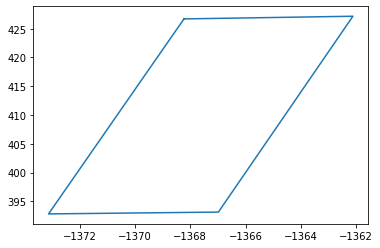

In [15]:
from shapely import geometry

b = Building(data1.iloc[500]["geometry.coordinates"][0], data1.iloc[500]["properties.height"])
x, y = b.xy_polygon.boundary.xy
plt.plot(x, y)

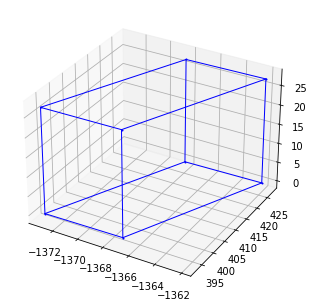

In [16]:
r = Renderer(backend='matplotlib')
for p in b.wall_polygons:
    r.add((p,'b',1),normal_length=0)
r.show()

In [17]:
from tqdm import tqdm
buildings = []

for i in tqdm(range(len(data1))):
    for coords in data1.iloc[i]["geometry.coordinates"]:
        try:
            buildings.append(Building(coords, data1.iloc[i]["properties.height"]))
        except:
            print(f"Skipping building {i}")

  1%|▍                                                                              | 45/8644 [00:00<00:37, 227.00it/s]

Skipping building 26
Skipping building 26
Skipping building 27
Skipping building 27
Skipping building 27
Skipping building 28
Skipping building 28
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 29
Skipping building 53
Skipping building 53
Skipping building 53
Skipping building 53


100%|█████████████████████████████████████████████████████████████████████████████| 8644/8644 [00:17<00:00, 499.92it/s]

Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8165
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8166
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8167
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8168
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8169
Skipping building 8170
Skipping building 8170
Skipping building 8170
Skipping bu

In [18]:
class FSS_Channels:
  # channels start at 0, so a channel plan with 8 channels is from 0 to 7

  band_width = 240e6 # 240MHz

  # 10.7-12.7 GHz frequency range
  range_start = 10.7e9 # 10.7GHz
  range_end = 12.7e9 # 12.7GHz

  channel_count = 8

  range_size = range_end - range_start
  unused_space = range_size - band_width * channel_count

  # FSS channel spacing should be 10MHz
  space_between_channels = unused_space / channel_count

  @staticmethod
  def getChannelRange(channel) -> Tuple[int, int]:
    channel_start = int((0.5 + channel) * FSS_Channels.space_between_channels + channel * FSS_Channels.band_width)
    channel_end = channel_start + FSS_Channels.band_width
    return channel_start, channel_end

  def __init__(channel):
    self.channel = channel

In [19]:
class BS_Channels:
  # channels start at 1, so a channel plan with 5 channels is from 1 to 5

  band_width = 100e6 # 100MHz

  # 12.2-12.7 GHz frequency range
  range_start = 12.2e9 # 12.2GHz
  range_end = 12.7e9 # 12.7GHz

  channel_count = 5

  range_size = range_end - range_start
  unused_space = range_size - band_width * channel_count

  # BS channel spacing should be 0MHz
  space_between_channels = unused_space / channel_count

  @staticmethod
  def getChannelRange(channel) -> Tuple[int, int]:
    channel -= 1
    
    channel_start = int((0.5 + channel) * BS_Channels.space_between_channels + channel * BS_Channels.band_width)
    channel_end = channel_start + BS_Channels.band_width
    return channel_start, channel_end

  def __init__(channel):
    self.channel = channel

In [20]:
# class BS:
#   def __init__(self, radius, max_height, carr_freq, interference_type):
#     self.radius = radius
#     self.max_height = max_height
#     self.carr_freq = carr_freq
#     self.interference_type = interference_type
#     self.base_heights = {
#         'UMi': 10,
#         'UMa': 25,
#         'RMa': 35,
#         None: random.randint(10, 35)
#     }
#     self.BS_x = random.randint(-4000,4000) + 1000*random.random()
#     self.BS_y = random.randint(-4000,4000) + 1000*random.random()
#     self.BS_z = self.base_heights[self.interference_type]

#   def BS_random_co_ordinates(self):
#     return self.BS_x, self.BS_y, self.BS_z
 
#   def UE_random_co_ordinates(self):
#     UE_x = random.randint(-4000,4000) + 1000*random.random()
#     UE_y = random.randint(-4000,4000) + 1000*random.random()
#     UE_z = random.uniform(0,1.5)
    
#     return UE_x, UE_y, UE_z

# # Creating the FSS class
#   def FSS_random_co_ordinates(self):

#     FSS_x = random.randint(-4000,4000) + 1000*random.random()
#     FSS_y = random.randint(-4000,4000) + 1000*random.random()
#     FSS_z = random.choice([1.5,4.5])
    
#     return FSS_x, FSS_y, FSS_z


In [21]:
def path_loss_UMi(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##UMi
##LOS,SF=4:

##(10m<=d_2D)<=D_BP:
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+((FSS_Y-BS_Y)**2)+((4.5-10)**2))
    hBs=10
    fc=12
    d_3D=math.sqrt(hBs**2+d_2D**2)
    PL1umi=32.4+ 21*math.log10(d_3D)+ 20*math.log10(fc)
    
##(D_BP<=d_2D)<=5000m:
    hBs=10
    hUT=4.5
    hE=1
    hBs1=hBs-hE
    hUT1=hUT-hE
    c=3e8
    D_BP= (4*hBs1*hUT1*12e9)/c
    PL2umi=32.4+40*math.log10(d_3D)+20*math.log10(fc)-9.5*math.log10((D_BP)**2+(hBs-hUT)**2)
    
    if 10 <=d_2D and d_2D<=D_BP:
        PLUMiLOS=PL1umi
    elif D_BP<=d_2D and  d_2D<=5000:
        PLUMiLOS= PL2umi  
    else:
        PLUMiLOS=1

##NLOS,SF=7.82:
    PL1umiNLOS= 35.3*math.log10(d_3D)+22.4+21.3*math.log10(fc)-0.3*(hUT-1.5)
    PLUMiNLOS= max(PLUMiLOS,PL1umiNLOS)
    
    line_of_sight = True
    
##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, 10), Point(FSS_X, FSS_Y, 4.5))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_UMi = PLUMiNLOS
                    line_of_sight = False
                else:
                    path_loss_UMi = PLUMiLOS
#                     line_of_sight = True
    
 # intersection(line, polygon): [Intersection], None
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_UMi = PLUMiNLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_UMi = PLUMiLOS
#                 line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False
    
# #Loss Probability:
#     if d_2D>18:
#         PrLosUmi=(18/d_2D)+math.exp((-(d_2D/36))*(1-(18/d_2D)))     
#     else:
#         PrLosUmi=1 ##d_2d<=18     
#     if PrLosUmi > random.random():
#         path_loss_UMi = PLUMiLOS   
#     else:
#         path_loss_UMi = PLUMiNLOS   
##path_loss 
#     path_loss_UMi= PL2umi*PrLosUmi+PL1umiNLOS*(1-PrLosUmi)
    
    return path_loss_UMi, d_2D, line_of_sight

In [22]:
def path_loss_UMa(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##LOS,SF=4:
##(10m<=d_2D)<=D_BP:
    fc=12
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+(FSS_Y- BS_Y)**2)+((FSS_Z-BS_Z)**2)
    hBs=25
    d_3D=math.sqrt(hBs**2+d_2D**2)
    PL3uma=28.0+22*math.log10(d_3D)+20*math.log10(fc)
    
##(D_BP<=d_2D) <=5000m:
    hUT=4.5
    hE=1
    hBs1=hBs-hE
    hUT1=hUT-hE
    c=3e8
    D_BP= (4*hBs1*hUT1*12e9)/c
    PL4uma=28.0+40*math.log10(d_3D)+20*math.log10(fc)-9*math.log10((D_BP)**2+(hBs-hUT)**2)
    
    if 10 <=d_2D and d_2D<=D_BP:
        PLUMALOS=PL3uma
    elif D_BP<=d_2D and d_2D<=5000:
         PLUMALOS= PL4uma  
    else:
        PLUMALOS=1
        
##NLOS,SF=6:
    PL1NLOSuma=13.54+39.08*math.log10(d_3D)+20*math.log10(fc)-0.6*(hUT-1.5)
    PLUMANLOS=max(PLUMALOS,PL1NLOSuma)
    
    line_of_sight = True

##NLOS,SF=7.8 (optional)
##PL_Optional=32.4+20*math.log(fc)+30*math.log(d_3D)


##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, BS_Z), Point(FSS_X, FSS_Y, FSS_Z))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_UMa = PLUMANLOS
                    line_of_sight = False
                else:
                    path_loss_UMa = PLUMALOS
#                     line_of_sight = True
                
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_UMa = PLUMANLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_UMa = PLUMALOS
#                 line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False


##Loss Probability:
#     if d_2D >18:
#         if hUT<=13:
#             ChUT=0
#         elif 13<hUT and hUT<=23:
#             ChUT=((hUT-13)/10)**1.5  
#         PrLOSUma=((18/d_2D)+math.exp((-(d_2D/63))*(1-(18/d_2D))))*(1+ChUT*(5/4)*((d_2D/100)**3)*math.exp(-(d_2D/150)))
#     else:##18m<d_2D:
#         PrLOSUma=1
        
#     if PrLOSUma > random.random():
#         path_loss_UMa = PLUMALOS
    
#     else:
#         path_loss_UMa = PLUMANLOS
    
##Path Loss
#     path_loss_UMa= PL4uma*PrLOSUma+PL1NLOSuma*(1-PrLOSUma)
    return path_loss_UMa, d_2D, line_of_sight

In [23]:
def path_loss_RMa(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z):
##LOS,SF=4(PL1),SF=6(PL2)
##10m<=d_2D<=d_BP: 
    fc=12
    h=5
    d_2D=math.sqrt(((FSS_X-BS_X)**2)+((FSS_Y- BS_Y)**2)+((FSS_Z-BS_Z)**2))
    hBs=35
    d_3D= math.sqrt(hBs**2+d_2D**2)
    PL1rma=20*math.log10((40*math.pi*d_3D*fc)/3)+ min(0.03*h**1.72,10)*math.log10(d_3D)-min(0.044*h**1.72,14.77)+0.002*math.log10(h)*d_3D
    
##d_BP<=d_2D<=10km:
    hUT=4.5
    c=3e8
    d_BP= (2*math.pi*hBs*hUT*12e9)/c
    PL2rma= PL1rma*(d_BP)+40*math.log10(d_3D/d_BP)

    if 10<=d_2D and d_2D <=d_BP:
        PLRMALOS=PL1rma
    elif d_BP<=d_2D and d_2D <=10000:
        PLRMALOS= PL2rma  
    else:
        PLRMALOS=1

##NLOS,SF=8:
    W=20
    h=5
    PL1NLOSrma= 161.04-7.11*math.log10(W)+7.5*math.log10(h)-(24.37-3.7*(h/hBs)**2)*math.log10(hBs)+(43.42-3.1*math.log10(hBs))*(math.log10(d_3D)-3)+20*math.log10(fc)-(3.2*(math.log10(11.75*hUT))**2-4.97)
    PLRMANLOS=max(PLRMALOS,PL1NLOSrma)
    
    line_of_sight = True
    
##realistic pathloss:
    bs_to_fss_segment = Segment(Point(BS_X, BS_Y, BS_Z), Point(FSS_X, FSS_Y, FSS_Z))
    for i in tqdm(range(len(buildings))):
#     for i in range(len(buildings)):
        for polygon in buildings[i].wall_polygons:
            if (hash(bs_to_fss_segment), hash(polygon)) in saved_los:
                if saved_los.get((hash(bs_to_fss_segment), hash(polygon))):
                    path_loss_RMa = PLRMANLOS
                    line_of_sight = False
                else:
                    path_loss_RMa = PLRMALOS
                    # line_of_sight = True
   
            elif intersection(bs_to_fss_segment, polygon) is not None:
                path_loss_RMa = PLRMANLOS
                line_of_sight = False
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = True
            else:
                path_loss_RMa = PLRMALOS
                # line_of_sight = True
                saved_los[(hash(bs_to_fss_segment), hash(polygon))] = False
                
    

# ##Loss Probability:
#     if d_2D>10:
#         PrLOSrma=math.exp(-((d_2D-10)/1000))
        
# ## 10m<d_2D:
#     else:
#         PrLOSrma=1
        
#     if PrLOSrma > random.random():
#         path_loss_RMa= PLRMALOS
    
#     else:
#         path_loss_RMa = PLRMANLOS

##PathLoss:
#     path_loss_RMa=PL2rma*PrLOSrma+PL1NLOSrma*(1-PrLOSrma)
    return path_loss_RMa, d_2D,  line_of_sight

In [24]:
def Interface_UMi_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_UMi,theta_tilt,phi_scan,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        # theta_tilt, phi_scan = max_gain_5g_parameters(theta, phi)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, (10-4.5)

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
#         print("Angle between interference axis and FSS main lobe:", fss_phi_difference)
        if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)
        

        G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)

        TXPower= -6.77     #8- 10* math.log10(30) #N=30, for 38dbm=8db
#         LBuildingLoss=1
        interface1=TXPower+ G_5G_R-pathloss_UMi- LBodyLoss + G_Rx_5G
        return interface1,pathloss_UMi

In [25]:
def Interface_UMa_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_UMa,theta_tilt,phi_scan,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, BS_Z-FSS_Z

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
        # if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)

        G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)
        
        TXPower= -6.77     #8- 10* math.log10(30) #N=30,  for 38dbm=8db
#         LBuildingLoss=1
        interface2=TXPower+ G_5G_R-pathloss_UMa- LBodyLoss + G_Rx_5G
        return interface2,pathloss_UMa

In [26]:
def Interface_RMa_1(BS_X,BS_Y,BS_Z,FSS_X,FSS_Y,FSS_Z,FSS_phi,pathloss_RMa,theta_tilt,phi_scan,output=False):
        LBodyLoss=4
#         LSpectralOverlap=10*math.log(10)
        x, y, z = BS_X-FSS_X, BS_Y-FSS_Y, BS_Z-FSS_Z

        theta_bs_es = math.degrees(math.atan(y/x)) % 360
        phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
        # if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)
        fss_phi_difference = abs(FSS_phi - phi_bs_es)
        if output: print("fss_phi_difference:", fss_phi_difference)

        G_5G_R=gain_5g(theta_bs_es, phi_bs_es, theta_tilt, phi_scan)
        G_Rx_5G=gain_fss_wbes_b(fss_phi_difference)
        
        TXPower= -6.77     #8- 10* math.log10(30) #N=30,  for 38dbm=8db
#         LBuildingLoss=1
        interface3=TXPower+ G_5G_R-pathloss_RMa-LBodyLoss + G_Rx_5G
        return interface3,pathloss_RMa

In [27]:
k = 1.38064852*10**(-23)
T=200
B=240e6
Noise = 10*math.log10(k*T*B)
Noise_W = 10 ** (Noise / 10)
print('Noise:', Noise)
print('Noise in Watts:', Noise_W)

Noise: -121.78675630934148
Noise in Watts: 6.627112895999999e-13


In [32]:
bs_ue_max_radius = 1000
bs_ue_min_radius= 1
base_station_count=33

# fss1 = BS(radius, max_height=1.5, carr_freq=12e3, interference_type=None)

x,y,z = 0,0,4.5

FSS_phi = {
    'UMi': 15,
    'UMa': 48,
    'RMa': 5
}
  
exclusion_zones = [500, 1000, 2000, 3000, 4000]
        
def simulate(output=True):
    FSS_X=np.array([])
    FSS_Y=np.array([])
    FSS_Z=np.array([])
    FSS_CHANNELS = []
    for i in range (1):
        FSS_X = np.append(FSS_X, 0)
        FSS_Y = np.append(FSS_Y, 0)
        FSS_Z = np.append(FSS_Z, 4.5)
        # 0 means not in use, 1 means in use
        channel_status = [random.randint(0, 1) for i in range(FSS_Channels.channel_count)]
        channels_used = np.array([i for i in range(FSS_Channels.channel_count) if channel_status[i] == 1])
        FSS_CHANNELS.append(channels_used)
        if output: print("FSS Co-ordinates=" +str (x)+ "," + str(y)+ "," + str(z) + ", channel: " + str(channels_used))
    if output: print(FSS_X, FSS_Y, FSS_Z, FSS_CHANNELS)

    # Create base stations
    BS_X=np.array([])
    BS_Y=np.array([])
    BS_Z=np.array([])
    
    # Randomly select base stations 
    # base_station_indexes = random.sample(range(len(data_within_zone)), base_station_count)

    # for i in base_station_indexes:
    for i in range(base_station_count):
        lat_BS, lon_BS = data_within_zone.iloc[i]['latitude'], data_within_zone.iloc[i]['longitude']
#         bs1 = BS(radius, max_height=35, carr_freq=12e3, interference_type=None)
        x_BS = R * math.cos(math.radians(lat_BS)) * math.cos(math.radians(lon_BS))
        y_BS = R * math.cos(math.radians(lat_BS)) * math.sin(math.radians(lon_BS))
#         z_BS = R * math.sin(math.radians(lat_BS))

        BS_X = np.append(BS_X, x_BS - x_FSS)
        BS_Y = np.append(BS_Y, y_BS - y_FSS)
        BS_Z = np.append(BS_Z, 10)
        if output: print("Bs Co-ordinates=" +str (x_BS)+ "," + str(y_BS)+ "," + str(z_BS))
    
    if output: print(BS_X,BS_Y,BS_Z)

    # Create user equipment
    UE_X=np.array([])
    UE_Y=np.array([])
    UE_Z=np.array([])
    UE_CHANNEL=np.array([])
    for p in range (len(BS_X)):
        for i in range(3):
    # number of split regions
    # i is the sector number
            for j in range(10):
      # number of UEs per region
      # j is the number of the UE in one sector
                bs_x, bs_y, bs_z = BS_X[p], BS_Y[p],BS_Z[p]
                theta_bs_ue = random.uniform(120 * i, 120 * (i+1))
                # 0-120, 120-240, 240-360
                radius_bs_ue = random.uniform(bs_ue_min_radius, bs_ue_max_radius)

                x1 = bs_x + radius_bs_ue * math.cos(math.radians(theta_bs_ue))
                y1 = bs_y + radius_bs_ue * math.sin(math.radians(theta_bs_ue))

                UE_X = np.append(UE_X, x1)
                UE_Y = np.append(UE_Y, y1)
                UE_Z = np.append(UE_Z, 1.5)

                maximum_UEs_per_channel = 4

                if j > maximum_UEs_per_channel * BS_Channels.channel_count:
                    raise Exception(f"BS cannot support {j} UEs")

                count = {i: 0 for i in range(1, BS_Channels.channel_count + 1)}

                channel = random.randint(1, BS_Channels.channel_count)

                while count[channel] >= maximum_UEs_per_channel:
                    channel = random.randint(1, BS_Channels.channel_count)

                count[channel] += 1

                UE_CHANNEL = np.append(UE_CHANNEL, channel)

                if output: print("UE Co-ordinates=" +str (x1)+ "," + str(y1)+ "," + str(z1) + ", channel: " + str(channel))
            if output: print(UE_X,UE_Y,UE_Z)
        
    pathloss_UMa=np.empty([0])
    pathloss_UMi=np.empty([0])
    pathloss_RMa=np.empty([0])
    distance_UMa=np.empty([0])
    distance_UMi=np.empty([0])
    distance_RMa=np.empty([0])
    line_of_sight=np.empty([0])
    for i in range(len(BS_X)):
        for j in range (len(FSS_X)):
            pathlossumi,distance,los_single = path_loss_UMi(BS_X[i],BS_Y[i],10,FSS_X[j],FSS_Y[j],4.5)
            pathlossuma,distance,los_single = path_loss_UMa(BS_X[i],BS_Y[i],25,FSS_X[j],FSS_Y[j],FSS_Z[j])
            pathlossrma,distance,los_single = path_loss_RMa(BS_X[i],BS_Y[i],35,FSS_X[j],FSS_Y[j],FSS_Z[j])
            if output: print("pathloss umi:", pathlossumi, "uma:", pathlossuma, "rma:", pathlossrma, "for distance", distance)
                
            
            if not los_single:
                pathloss_UMa=np.append(pathloss_UMa,pathlossuma)
                distance_UMa=np.append(distance_UMa,distance)
                pathloss_UMi=np.append(pathloss_UMi,pathlossumi)
                distance_UMi=np.append(distance_UMi,distance)
                pathloss_RMa=np.append(pathloss_RMa,pathlossrma)
                distance_RMa=np.append(distance_RMa,distance)

                line_of_sight=np.append(line_of_sight,los_single)


    if output: print(pathloss_UMi,distance_UMi)
    if output: print(pathloss_UMa,distance_UMa)
    if output: print(pathloss_RMa,distance_RMa)

    interface_UMi_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    interface_UMa_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    interface_RMa_W = {exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones}
    for i in range(len(pathloss_UMi)):
        interface_UMi_BS=np.empty([0])
        interface_UMa_BS=np.empty([0])
        interface_RMa_BS=np.empty([0])
        for j in range(len(FSS_X)):
            print(f"BS {i}, FSS {j}, pathloss {pathloss_UMi[i*len(FSS_X)+j]}")
            for k in random.sample(range(len(UE_X)),30):
                # channel check
                # if UE is using channel 1, the start is 12.2GHz and the end is 12.3GHz
                bs_channel_start, bs_channel_end = BS_Channels.getChannelRange(UE_CHANNEL[k])
                bs_channel_range = range(bs_channel_start, int(bs_channel_end + (5e6)), int(5e6))

                interference_found = False

                for fss_channel in FSS_CHANNELS[j]:
                    # if fss_channel >= 6:
                    fss_channel_start, fss_channel_end = FSS_Channels.getChannelRange(fss_channel)
                    fss_channel_range = range(bs_channel_start, int(bs_channel_end + (5e6)), int(5e6))
                    
                    bs_set = set(bs_channel_range)
                    if len(bs_set.intersection(fss_channel_range)):
                        interference_found = True

                if not interference_found:
#                    
                    continue

                for interference_type in ["UMi", "UMa", "RMa"]:
                    if interference_type == "UMi":
                        BS_Z = np.array([10 for i in range(len(BS_X))])
                    elif interference_type == "UMa":
                        BS_Z = np.array([25 for i in range(len(BS_X))])
                    elif interference_type == "RMa":
                        BS_Z = np.array([35 for i in range(len(BS_X))])
                    # bs_ue_x, bs_ue_y, bs_ue_z = BS_X-UE_X, BS_Y-UE_Y, BS_Z-UE_Z
                    bs_ue_x, bs_ue_y, bs_ue_z = UE_X[k]-BS_X[i], UE_Y[k]-BS_Y[i], UE_Z[k]-BS_Z[i]

                    theta_bs_ue = np.arctan(bs_ue_y/bs_ue_x)
                    phi_bs_ue = np.sqrt(bs_ue_x**2 + bs_ue_y**2) / bs_ue_z

                    theta_bs_ue = np.degrees(theta_bs_ue) % 360
                    phi_bs_ue = np.degrees(phi_bs_ue) % 360
                    if output: print("theta_bs_ue:", theta_bs_ue, "phi_bs_ue:", phi_bs_ue)

                    theta_tilt, phi_scan = max_gain_5g_parameters(theta_bs_ue, phi_bs_ue)
                    theta_tilt=10
                    
                    
#                     x, y, z = BS_X[i]-FSS_X[j], BS_Y[i]-FSS_Y[j], (10-4.5)
#                     theta_bs_es = math.degrees(math.atan(y/x)) % 360
#                     phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
#                     Angle_interferences_beam = (phi_bs_ue + phi_bs_es) 
#                     print("Angle between interference axis and Beams:",  Angle_interferences_beam )
#                     if output: print("theta_bs_es:", theta_bs_es, "phi_bs_es:", phi_bs_es)
        

                    if interference_type == "UMi":
                        interfaceumi,pathloss_UMi_x= Interface_UMi_1(BS_X[i],BS_Y[i],BS_Z[i],FSS_X[j],FSS_Y[j],FSS_Z[j],FSS_phi['UMi'],pathloss_UMi[i*len(FSS_X)+j],theta_tilt,phi_scan)
                        print("UE:", k, "/ interference umi:", interfaceumi, "/ pathloss:", pathlossumi)
                        if interfaceumi is not None:
                            interface_UMi_BS=np.append(interface_UMi_BS,interfaceumi)
#                     elif interference_type == "UMa":
#                         interfaceuma,pathloss_UMa_x= Interface_UMa_1(BS_X[i],BS_Y[i],BS_Z[i],FSS_X[j],FSS_Y[j],FSS_Z[j],FSS_phi['UMa'],pathloss_UMa[i*len(FSS_X)+j],theta_tilt,phi_scan)
#                         if output: print("interference uma:", interfaceuma, "pathloss:", pathlossuma)
#                         interface_UMa_BS=np.append(interface_UMa_BS,interfaceuma)
#                     elif interference_type == "RMa":
#                         interfacerma,pathloss_RMa_x= Interface_RMa_1(BS_X[i],BS_Y[i],BS_Z[i],FSS_X[j],FSS_Y[j],FSS_Z[j],FSS_phi['RMa'],pathloss_RMa[i*len(FSS_X)+j],theta_tilt,phi_scan)
#                         if output: print("interference rma:", interfacerma, "pathloss:", pathlossrma)
#                         interface_RMa_BS=np.append(interface_RMa_BS,interfacerma)

        for exclusion_zone in exclusion_zones:
            if distance_UMi[i*len(FSS_X)+j] > exclusion_zone:
                interface_UMi_W[exclusion_zone] = np.append(interface_UMi_W[exclusion_zone], np.sum(10 ** (interface_UMi_BS / 10)))
            if distance_UMa[i*len(FSS_X)+j] > exclusion_zone:
                interface_UMa_W[exclusion_zone] = np.append(interface_UMa_W[exclusion_zone], np.sum(10 ** (interface_UMa_BS / 10)))
            if distance_RMa[i*len(FSS_X)+j] > exclusion_zone:
                interface_RMa_W[exclusion_zone] = np.append(interface_RMa_W[exclusion_zone], np.sum(10 ** (interface_RMa_BS / 10)))
    
    
    if output: print(interface_UMi_W,pathloss_UMi)
    if output: print(interface_UMa_W,pathloss_UMa)
    if output: print(interface_RMa_W,pathloss_RMa)

    # I_N_UMi = np.array([interfaceumi-Noise for interfaceumi in interface_UMi])
    I_N_UMi, I_N_UMa, I_N_RMa = dict(), dict(), dict()
    for exclusion_zone in exclusion_zones:
        I_N_UMi[exclusion_zone] = interface_UMi_W[exclusion_zone] / Noise_W
    if output: print('I/N UMi:', I_N_UMi) 
    for exclusion_zone in exclusion_zones:
        I_N_UMa[exclusion_zone] = interface_UMa_W[exclusion_zone] / Noise_W  
    if output: print('I/N UMa:', I_N_UMa)
    for exclusion_zone in exclusion_zones:
        I_N_RMa[exclusion_zone] = interface_RMa_W[exclusion_zone] / Noise_W
    if output: print('I/N RMa:', I_N_RMa)  

    return distance_RMa, I_N_RMa, distance_UMa, I_N_UMa, distance_UMi, I_N_UMi, line_of_sight

In [33]:
# Prototype functions to calculate antenna gain of 5G base station and FSS earth station

import math, cmath
from scipy import optimize

# gain is in dBi

# 3GPP TR 38.901
# https://www.etsi.org/deliver/etsi_tr/138900_138999/138901/14.00.00_60/tr_138901v140000p.pdf
antenna_gain_max = 8

# values recommended by Dr. Zoheb
rows = 16  # Nv
cols = 16  # Nh
hspace = 0.5  # dh/λ
vspace = 0.5  # dv/λ

# constant values based on ECC Rep 281
phi_3db = 80  # degrees
theta_3db = 65  # degrees
front_to_back_ratio = 30  # dB
side_lobe_level_limit = 30  # dB

# antenna horizontal pattern
def gain_antenna_element_horizontal(phi) -> float:
    return -min(
                12 * (phi / phi_3db)**2, 
                front_to_back_ratio
            )

# antenna vertical pattern
def gain_antenna_element_vertical(theta) -> float:
    return -min(
                12 * ((theta - 90) / theta_3db)**2,
                side_lobe_level_limit
            )

# antenna element gain of elevation and azimuth plane
def gain_antenna_element(theta, phi) -> float:
    return antenna_gain_max - \
            min(
                -(gain_antenna_element_horizontal(phi) + gain_antenna_element_vertical(theta)), 
                front_to_back_ratio
            )

def superposition(n, m, theta, phi, hspace, vspace) -> complex:
    return cmath.exp(complex(0, 2 * math.pi * \
                (
                    (n-1) * vspace * math.cos(math.radians(theta)) + \
                    (m-1) * hspace * math.sin(math.radians(theta)) * math.sin(math.radians(phi))
                )
            ))

def weighting(n, m, theta_tilt, phi_scan, hspace, vspace) -> complex:
    return cmath.exp(complex(0, -2 * math.pi * \
                (
                    (n-1) * vspace * math.sin(math.radians(theta_tilt)) + \
                    (m-1) * hspace * math.cos(math.radians(theta_tilt)) * math.sin(math.radians(phi_scan))
                )
            )) / cmath.sqrt(rows * cols)

# returns theta_tilt and phi_scan which yield maximum antenna gain given theta and phi
def max_gain_5g_parameters(theta, phi, coarse=True, rounding_precision=0) -> tuple:
    if coarse:
        theta = round(theta, rounding_precision)
        phi = round(phi, rounding_precision)
    if (theta, phi) in saved_tp:
        # print(f'match found for ({theta}, {phi}), using that')
        return saved_tp.get((theta, phi))
    
    
    
    # return max_parameters
    # scipy's optimization can only find the minimum, so we pass a function which returns the negative of the weighting function
    result = optimize.brute(
        lambda x: -beam_pattern_5g(theta, phi, x[0], x[1]),  # x[0] = theta_tilt, x[1] = phi_scan
        # theta_tilt is between -90 and 90 degrees, phi_scan is between -180 and 180 degrees
        ranges = [(-90, 90), (-180, 180)]
        
    )
    saved_tp[(theta, phi)] = tuple(x for x in result)
    
    return saved_tp[(theta, phi)]


# a_A, the directional pattern from beam forming with an array of elements
def beam_pattern_5g(theta, phi, theta_tilt, phi_scan) -> float:
    summation = 0
    # weighting multiplied by the superposition vector
    for n in range(1, rows+1):
        for m in range(1, cols+1):
            # print(f"{theta_tilt}, {phi_scan}, {abs(weighting(n, m, theta_tilt, phi_scan, hspace, vspace))}")
            summation += weighting(n, m, theta_tilt, phi_scan, hspace, vspace) * superposition(n, m, theta, phi, hspace, vspace)

    return abs(summation)**2

# antenna gain of 5G base station (represented by a single beam i)
def gain_5g(theta, phi, theta_tilt, phi_scan) -> float:
    beam_pattern = beam_pattern_5g(theta, phi, theta_tilt, phi_scan)

    return gain_antenna_element(theta, phi) + \
           10 * math.log10(beam_pattern)

# space refers to D/λ
def get_phi_min(space) -> float:
    # Rec. ITU-R S.465-6
    if space >= 50:
        return max(1.0, 100 * (1 / space))
    else:
        return max(2.0, 114 * (space ** -1.09))

# receiving antenna gain of FSS earth station
# phi is an angle between base station antenna direction and FSS ES antenna's main axis (elevation angle)
def gain_fss_s1428(phi, phi_min) -> float:

    if 0 < phi < phi_min:
        return 32 - 25 * math.log10(phi_min)
    elif phi_min <= phi < 48:
        return 32 - 25 * math.log10(phi)
    elif 48 <= phi <= 180:
        return -10

    # This function is only defined where phi is within (0, 180]
    raise ValueError(f'Angle phi must be within the interval (0, 180] degrees, was {phi} degrees instead')

# co-polarized components only
# https://www.etsi.org/deliver/etsi_en/303900_303999/303981/01.02.01_60/en_303981v010201p.pdf
def gain_fss_wbes_b(phi) -> float:
    if 0 <= phi < 6:
        return 20
    elif 6 <= phi < 48:
        return 40 - 25 * math.log10(phi)
    elif 48 <= phi <= 180:
        return -2
    elif 180 <= phi <= 360:
        return gain_fss_wbes_b(360 - phi)

    # This function is only defined where phi is within [6, 180]
    raise ValueError(f'Angle phi must be within the interval [6, 180] degrees, was {phi} degrees instead')
    

In [34]:
# from tqdm import tqdm
# distance_RMa, I_N_RMa_W, I_N_RMa_noAverage, distance_UMa, I_N_UMa_W, I_N_UMa_noAverage, distance_UMi, I_N_UMi_W, I_N_UMi_noAverage, line_of_sight = [np.empty([0]) for x in range(10)]
# simulation_count = 10
# for i in tqdm(range(simulation_count)):
#    distance_RMa_single, I_N_RMa_single_W, distance_UMa_single, I_N_UMa_single_W, distance_UMi_single, I_N_UMi_single_W, line_of_sight_single = simulate(output=False)

#    distance_RMa = np.append(distance_RMa, distance_RMa_single)
#    # print(I_N_RMa_single_W)
#    I_N_RMa_W = np.append(I_N_RMa_W, I_N_RMa_single_W)
#    I_N_RMa_noAverage = np.append(I_N_RMa_noAverage, 10 * np.log10(I_N_RMa_single_W))
   
#    distance_UMa = np.append(distance_UMa, distance_UMa_single)
#    I_N_UMa_W = np.append(I_N_UMa_W, I_N_UMa_single_W)
#    I_N_UMa_noAverage = np.append(I_N_UMa_noAverage, 10 * np.log10(I_N_UMa_single_W))

#    distance_UMi = np.append(distance_UMi, distance_UMi_single)
#    I_N_UMi_W = np.append(I_N_UMi_W, I_N_UMi_single_W)
#    I_N_UMi_noAverage = np.append(I_N_UMi_noAverage, 10 * np.log10(I_N_UMi_single_W))
    
#    line_of_sight = np.append(line_of_sight, line_of_sight_single)
    
# for arr in (I_N_RMa_noAverage,I_N_UMa_noAverage,I_N_UMi_noAverage):
#     arr[arr == -np.inf]=0
    
# I_N_RMa = 10 * np.log10(np.average(I_N_RMa_W))
# I_N_UMa = 10 * np.log10(np.average(I_N_UMa_W))
# I_N_UMi = 10 * np.log10(np.average(I_N_UMi_W))

# pairs = {
#   'RMa': (np.average(distance_RMa), I_N_RMa),
#   'UMa': (np.average(distance_UMa), I_N_UMa),
#   'UMi': (np.average(distance_UMi), I_N_UMi)
# }

# pairs_noAverage = {
#   'RMa': (distance_RMa, I_N_RMa_noAverage),
#   'UMa': (distance_UMa, I_N_UMa_noAverage),
#   'UMi': (distance_UMi, I_N_UMi_noAverage)
# }


In [35]:
from tqdm import tqdm
distance_RMa, distance_UMa, distance_UMi, line_of_sight = [np.empty([0]) for x in range(4)]
I_N_RMa_W, I_N_RMa_noAverage, I_N_UMa_W, I_N_UMa_noAverage, I_N_UMi_W, I_N_UMi_noAverage = [{exclusion_zone: np.empty([0]) for exclusion_zone in exclusion_zones} for x in range(6)]

simulation_count = 10
for i in tqdm(range(simulation_count)):
    distance_RMa_single, I_N_RMa_single_W, distance_UMa_single, I_N_UMa_single_W, distance_UMi_single, I_N_UMi_single_W, line_of_sight_single = simulate(output=False)
    distance_RMa = np.append(distance_RMa, distance_RMa_single)
    distance_UMa = np.append(distance_UMa, distance_UMa_single)
    distance_UMi = np.append(distance_UMi, distance_UMi_single)

    I_N_groups = [
      (I_N_RMa_W, I_N_RMa_noAverage, I_N_RMa_single_W),
      (I_N_UMa_W, I_N_UMa_noAverage, I_N_UMa_single_W),
      (I_N_UMi_W, I_N_UMi_noAverage, I_N_UMi_single_W)
   ]
    for I_N_W, I_N_noAverage, I_N_single_W in I_N_groups:
        for exclusion_zone in exclusion_zones:
            I_N_W[exclusion_zone] = np.append(I_N_W[exclusion_zone], I_N_single_W[exclusion_zone])
            I_N_noAverage[exclusion_zone] = np.append(I_N_noAverage[exclusion_zone], 10 * np.log10(I_N_single_W[exclusion_zone]))
    
    line_of_sight = np.append(line_of_sight, line_of_sight_single)
    
for arr in (I_N_RMa_noAverage,I_N_UMa_noAverage,I_N_UMi_noAverage):
    arr[arr == -np.inf]=0

# for arr in (I_N_RMa_noAverage,I_N_UMa_noAverage,I_N_UMi_noAverage):
#     for exclusion_zone in exclusion_zones:
#         arr[exclusion_zone][arr[exclusion_zone] == -np.inf]=0
    
I_N_RMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_RMa_W[exclusion_zone])) for exclusion_zone in I_N_RMa_W}
I_N_UMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMa_W[exclusion_zone])) for exclusion_zone in I_N_UMa_W}
I_N_UMi = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMi_W[exclusion_zone])) for exclusion_zone in I_N_UMi_W}

pairs = {
  'RMa': (np.average(distance_RMa), I_N_RMa),
  'UMa': (np.average(distance_UMa), I_N_UMa),
  'UMi': (np.average(distance_UMi), I_N_UMi)
}

pairs_noAverage = {
  'RMa': (distance_RMa, I_N_RMa_noAverage),
  'UMa': (distance_UMa, I_N_UMa_noAverage),
  'UMi': (distance_UMi, I_N_UMi_noAverage)
}


 66%|███████████████████████████████████████████████████                          | 5425/8177 [00:07<00:03, 849.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.85it/s]

 35%|██████████████████████████▉                                                  | 2860/8177 [00:03<00:06, 768.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.72it/s]

  4%|███▍                                                                          | 354/8177 [00:00<00:12, 621.40it/s]


 76%|██████████████████████████████████████████████████████████▏                  | 6181/8177 [00:07<00:02, 893.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.62it/s]

 43%|█████████████████████████████████                                            | 3512/8177 [00:04<00:06, 763.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.85it/s]

 12%|█████████▍                                                                   | 1001/8177 [00:01<00:08, 891.84it/s]


 84%|████████████████████████████████████████████████████████████████▌            | 6852/8177 [00:08<00:01, 860.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.30it/s]

 52%|███████████████████████████████████████▊                                     | 4225/8177 [00:05<00:04, 876.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.08it/s]

 20%|███████████████                                                              | 1606/8177 [00:02<00:08, 751.84it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7453/8177 [00:09<00:00, 886.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.76it/s]

 58%|████████████████████████████████████████████▌                                | 4731/8177 [00:06<00:03, 898.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.08it/s]

 25%|███████████████████▏                                                         | 2040/8177 [00:02<00:07, 773.34it/s]


 95%|█████████████████████████████████████████████████████████████████████████▎   | 7787/8177 [00:10<00:00, 634.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.41it/s]

 62%|███████████████████████████████████████████████▌                             | 5047/8177 [00:06<00:03, 838.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.75it/s]

 29%|██████████████████████▏                                                      | 2352/8177 [00:03<00:08, 710.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.99it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 68%|████████████████████████████████████████████████████                         | 5534/8177 [00:07<00:03, 836.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.08it/s]

 35%|███████████████████████████                                                  | 2876/8177 [00:04<00:06, 770.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.52it/s]

  4%|███▎                                                                          | 348/8177 [00:00<00:12, 614.31it/s]


 75%|█████████████████████████████████████████████████████████▍                   | 6099/8177 [00:07<00:02, 884.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.49it/s]

 41%|███████████████████████████████▊                                             | 3379/8177 [00:04<00:07, 672.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.25it/s]

  9%|███████▍                                                                      | 776/8177 [00:01<00:10, 701.37it/s]


 81%|██████████████████████████████████████████████████████████████▌              | 6650/8177 [00:08<00:01, 769.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.43it/s]

 48%|█████████████████████████████████████▏                                       | 3945/8177 [00:05<00:04, 905.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.33it/s]

 16%|████████████▋                                                                | 1343/8177 [00:01<00:08, 833.25it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7200/8177 [00:09<00:01, 737.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.00it/s]

 56%|███████████████████████████████████████████                                  | 4578/8177 [00:06<00:04, 887.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.17it/s]

 25%|███████████████████▌                                                         | 2072/8177 [00:02<00:07, 803.64it/s]


 98%|███████████████████████████████████████████████████████████████████████████  | 7973/8177 [00:10<00:00, 754.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.46it/s]

 65%|██████████████████████████████████████████████████                           | 5323/8177 [00:06<00:03, 834.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.12it/s]

 32%|████████████████████████▍                                                    | 2601/8177 [00:03<00:07, 744.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.11it/s]

  2%|█▎                                                                            | 136/8177 [00:00<00:20, 387.81it/s]


 72%|███████████████████████████████████████████████████████▎                     | 5877/8177 [00:07<00:02, 823.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.11it/s]

 39%|██████████████████████████████▎                                              | 3219/8177 [00:04<00:08, 565.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.29it/s]

  9%|██████▋                                                                       | 700/8177 [00:01<00:11, 666.41it/s]


 80%|█████████████████████████████████████████████████████████████▊               | 6560/8177 [00:08<00:01, 852.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.85it/s]

 48%|████████████████████████████████████▌                                        | 3886/8177 [00:05<00:04, 892.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.49it/s]

 16%|████████████▋                                                                | 1341/8177 [00:01<00:08, 843.49it/s]


 88%|████████████████████████████████████████████████████████████████████         | 7232/8177 [00:09<00:01, 724.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.90it/s]

 56%|███████████████████████████████████████████▍                                 | 4619/8177 [00:06<00:04, 882.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.30it/s]

 25%|███████████████████▌                                                         | 2075/8177 [00:02<00:07, 805.00it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7878/8177 [00:10<00:00, 695.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.61it/s]

 64%|█████████████████████████████████████████████████▍                           | 5245/8177 [00:06<00:03, 828.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.75it/s]

 33%|█████████████████████████▏                                                   | 2677/8177 [00:03<00:06, 786.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.77it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 363.65it/s]


 70%|█████████████████████████████████████████████████████▊                       | 5719/8177 [00:07<00:02, 859.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.31it/s]

 37%|████████████████████████████▍                                                | 3022/8177 [00:04<00:08, 615.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.71it/s]

  5%|███▉                                                                          | 418/8177 [00:00<00:12, 601.00it/s]


 77%|██████████████████████████████████████████████████████████▉                  | 6263/8177 [00:08<00:02, 922.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.69it/s]

 44%|██████████████████████████████████                                           | 3615/8177 [00:05<00:05, 859.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.93it/s]

 13%|██████████                                                                   | 1064/8177 [00:01<00:08, 881.02it/s]


 85%|█████████████████████████████████████████████████████████████████▌           | 6959/8177 [00:08<00:01, 842.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.84it/s]

 50%|██████████████████████████████████████▊                                      | 4121/8177 [00:05<00:04, 811.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 725.95it/s]

 13%|██████████▎                                                                  | 1089/8177 [00:01<00:08, 788.77it/s]


 84%|████████████████████████████████████████████████████████████████▋            | 6872/8177 [00:09<00:01, 812.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.14it/s]

 50%|██████████████████████████████████████▎                                      | 4073/8177 [00:05<00:04, 884.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.60it/s]

 19%|██████████████▌                                                              | 1541/8177 [00:02<00:07, 878.94it/s]


 91%|██████████████████████████████████████████████████████████████████████       | 7438/8177 [00:09<00:00, 906.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.62it/s]

 59%|█████████████████████████████████████████████▏                               | 4793/8177 [00:06<00:03, 856.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.80it/s]

 26%|████████████████████▎                                                        | 2159/8177 [00:02<00:07, 804.34it/s]


 98%|███████████████████████████████████████████████████████████████████████████▊ | 8048/8177 [00:10<00:00, 748.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.98it/s]

 67%|███████████████████████████████████████████████████▎                         | 5446/8177 [00:07<00:03, 852.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.02it/s]

 35%|███████████████████████████                                                  | 2868/8177 [00:03<00:06, 772.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.55it/s]

  4%|███▎                                                                          | 350/8177 [00:00<00:12, 620.87it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6142/8177 [00:07<00:02, 884.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.98it/s]

 43%|████████████████████████████████▊                                            | 3487/8177 [00:04<00:06, 732.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.44it/s]

 10%|████████▏                                                                     | 857/8177 [00:01<00:10, 731.43it/s]


 83%|███████████████████████████████████████████████████████████████▌             | 6750/8177 [00:08<00:01, 848.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.86it/s]

 50%|██████████████████████████████████████▊                                      | 4126/8177 [00:05<00:04, 888.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.99it/s]

 18%|██████████████▏                                                              | 1512/8177 [00:02<00:07, 878.25it/s]


 91%|█████████████████████████████████████████████████████████████████████▊       | 7411/8177 [00:09<00:00, 924.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.57it/s]

 59%|█████████████████████████████████████████████▋                               | 4852/8177 [00:06<00:03, 848.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.61it/s]

 27%|█████████████████████                                                        | 2238/8177 [00:03<00:08, 689.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.99it/s]



 67%|███████████████████████████████████████████████████▉                         | 5518/8177 [00:07<00:03, 864.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.55it/s]

 36%|███████████████████████████▋                                                 | 2937/8177 [00:04<00:08, 641.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.99it/s]

  4%|███▍                                                                          | 356/8177 [00:00<00:12, 632.12it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6144/8177 [00:07<00:02, 878.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.85it/s]

 42%|████████████████████████████████▎                                            | 3435/8177 [00:04<00:06, 688.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.20it/s]

 10%|████████                                                                      | 851/8177 [00:01<00:10, 714.67it/s]


 83%|███████████████████████████████████████████████████████████████▋             | 6766/8177 [00:08<00:01, 853.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.01it/s]

 50%|██████████████████████████████████████▍                                      | 4087/8177 [00:05<00:04, 875.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.25it/s]

 19%|██████████████▎                                                              | 1524/8177 [00:02<00:07, 887.90it/s]


 91%|██████████████████████████████████████████████████████████████████████▍      | 7474/8177 [00:09<00:00, 889.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.48it/s]

 59%|█████████████████████████████████████████████▎                               | 4812/8177 [00:06<00:03, 854.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.17it/s]

 27%|█████████████████████                                                        | 2241/8177 [00:03<00:08, 703.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.05it/s]



 68%|████████████████████████████████████████████████████▏                        | 5543/8177 [00:07<00:03, 875.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.19it/s]

 36%|███████████████████████████▋                                                 | 2943/8177 [00:04<00:08, 637.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.42it/s]

  5%|███▉                                                                          | 414/8177 [00:00<00:13, 590.52it/s]


 76%|██████████████████████████████████████████████████████████▎                  | 6195/8177 [00:08<00:02, 876.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.77it/s]

 44%|█████████████████████████████████▉                                           | 3602/8177 [00:05<00:05, 841.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.26it/s]

 13%|██████████                                                                   | 1073/8177 [00:01<00:08, 871.62it/s]


 85%|█████████████████████████████████████████████████████████████████▌           | 6956/8177 [00:08<00:01, 819.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.19it/s]

 53%|████████████████████████████████████████▊                                    | 4330/8177 [00:05<00:04, 887.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.25it/s]

 22%|████████████████▉                                                            | 1805/8177 [00:02<00:07, 870.67it/s]


 94%|████████████████████████████████████████████████████████████████████████▎    | 7685/8177 [00:10<00:00, 594.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.40it/s]

 62%|███████████████████████████████████████████████▊                             | 5078/8177 [00:06<00:03, 858.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.75it/s]

 30%|███████████████████████                                                      | 2451/8177 [00:03<00:08, 663.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.00it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:18, 445.64it/s]


 68%|████████████████████████████████████████████████████▍                        | 5566/8177 [00:07<00:03, 861.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.03it/s]

 36%|███████████████████████████▋                                                 | 2946/8177 [00:04<00:07, 657.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.19it/s]

  4%|███▎                                                                          | 350/8177 [00:00<00:12, 620.13it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6136/8177 [00:07<00:02, 870.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.25it/s]

 43%|█████████████████████████████████                                            | 3508/8177 [00:04<00:06, 775.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.03it/s]

 12%|█████████▏                                                                    | 963/8177 [00:01<00:08, 814.28it/s]


 84%|████████████████████████████████████████████████████████████████▌            | 6862/8177 [00:08<00:01, 865.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.23it/s]

 52%|████████████████████████████████████████▍                                    | 4291/8177 [00:05<00:04, 923.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.13it/s]

 20%|███████████████▋                                                             | 1662/8177 [00:02<00:08, 803.32it/s]


 91%|██████████████████████████████████████████████████████████████████████       | 7439/8177 [00:09<00:00, 905.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.47it/s]

 57%|████████████████████████████████████████████▏                                | 4692/8177 [00:06<00:03, 899.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.22it/s]

 25%|███████████████████▏                                                         | 2044/8177 [00:02<00:07, 790.85it/s]


 95%|█████████████████████████████████████████████████████████████████████████▎   | 7791/8177 [00:10<00:00, 625.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.28it/s]

 63%|████████████████████████████████████████████████▍                            | 5146/8177 [00:06<00:03, 828.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.66it/s]

 31%|███████████████████████▋                                                     | 2513/8177 [00:03<00:08, 689.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.22it/s]

  1%|▉                                                                              | 94/8177 [00:00<00:21, 373.52it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5799/8177 [00:07<00:02, 823.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.08it/s]

 39%|█████████████████████████████▊                                               | 3165/8177 [00:04<00:08, 625.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.68it/s]

  7%|█████▋                                                                        | 598/8177 [00:01<00:14, 537.49it/s]


 79%|████████████████████████████████████████████████████████████▉                | 6477/8177 [00:08<00:02, 847.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.68it/s]

 48%|████████████████████████████████████▋                                        | 3902/8177 [00:05<00:04, 897.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.78it/s]

 16%|████████████▍                                                                | 1325/8177 [00:01<00:08, 829.32it/s]


 89%|████████████████████████████████████████████████████████████████████▏        | 7247/8177 [00:09<00:01, 737.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.22it/s]

 57%|███████████████████████████████████████████▌                                 | 4624/8177 [00:06<00:03, 890.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.44it/s]

 26%|███████████████████▋                                                         | 2087/8177 [00:02<00:07, 787.67it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7931/8177 [00:10<00:00, 728.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.12it/s]

 66%|██████████████████████████████████████████████████▌                          | 5365/8177 [00:07<00:03, 825.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.99it/s]

 34%|██████████████████████████▎                                                  | 2791/8177 [00:03<00:06, 824.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.52it/s]

  3%|██▋                                                                           | 285/8177 [00:00<00:13, 601.32it/s]


 74%|█████████████████████████████████████████████████████████                    | 6065/8177 [00:07<00:02, 880.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.25it/s]

 41%|███████████████████████████████▊                                             | 3384/8177 [00:04<00:07, 678.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.03it/s]

  9%|███████▏                                                                      | 759/8177 [00:01<00:10, 713.37it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6725/8177 [00:08<00:01, 822.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.33it/s]

 49%|██████████████████████████████████████                                       | 4036/8177 [00:05<00:04, 857.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 743.61it/s]

 13%|█████████▉                                                                   | 1051/8177 [00:01<00:08, 847.55it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6613/8177 [00:09<00:02, 773.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 735.76it/s]

 48%|█████████████████████████████████████▏                                       | 3955/8177 [00:05<00:04, 882.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.32it/s]

 17%|████████████▋                                                                | 1352/8177 [00:01<00:08, 841.37it/s]


 88%|███████████████████████████████████████████████████████████████████▉         | 7216/8177 [00:09<00:01, 725.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.17it/s]

 56%|███████████████████████████████████████████                                  | 4572/8177 [00:06<00:04, 886.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.83it/s]

 24%|██████████████████▊                                                          | 1994/8177 [00:02<00:07, 846.48it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7864/8177 [00:10<00:00, 690.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.57it/s]

 64%|█████████████████████████████████████████████████▎                           | 5232/8177 [00:06<00:03, 831.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.60it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 466 / interference umi: -183.51136630726904 / pathloss: 125.47617490800064
UE: 317 / interference umi: -175.08478347058605 / pathloss: 125.47617490800064
UE: 614 / interference umi: -187.99759417629582 / pathloss: 125.47617490800064
UE: 816 / interference umi: -185.89722907850572 / pathloss: 125.47617490800064
UE: 24 / interference umi: -179.3740349038346 / pathloss: 125.47617490800064
UE: 217 / interference umi: -185.99051819260427 / pathloss: 125.47617490800064
UE: 775 / interference umi: -187.40214146637203 / pathloss: 125.47617490800064
UE: 325 / interference umi: -193.98261640264528 / pathloss: 125.47617490800064
UE: 362 / interference umi: -169.11550307830913 / pathloss: 125.47617490800064
UE: 188 / interference umi: -195.67208793956286 / pathloss: 125.47617490800064
UE: 130 / interference umi: -185.15685933967353 / pathloss: 125.47617490800064
UE: 503 / interference umi: -185.98198028893353 / pathloss: 125.47617490800064
UE: 659 / int

UE: 330 / interference umi: -155.49918364294473 / pathloss: 125.47617490800064
UE: 444 / interference umi: -137.3142053869417 / pathloss: 125.47617490800064
UE: 529 / interference umi: -135.2039928495872 / pathloss: 125.47617490800064
UE: 50 / interference umi: -170.34126341267267 / pathloss: 125.47617490800064
UE: 157 / interference umi: -151.38352704872682 / pathloss: 125.47617490800064
UE: 366 / interference umi: -155.07723259298524 / pathloss: 125.47617490800064
UE: 441 / interference umi: -162.5249107030455 / pathloss: 125.47617490800064
UE: 467 / interference umi: -152.32902105345332 / pathloss: 125.47617490800064
UE: 728 / interference umi: -153.1976030355356 / pathloss: 125.47617490800064
UE: 62 / interference umi: -156.7132171438917 / pathloss: 125.47617490800064
UE: 8 / interference umi: -142.75709153400052 / pathloss: 125.47617490800064
UE: 835 / interference umi: -153.14575370228118 / pathloss: 125.47617490800064
UE: 515 / interference umi: -153.14575387947045 / pathloss: 1

BS 7, FSS 0, pathloss 130.70891544035513
UE: 300 / interference umi: -200.51428754645326 / pathloss: 125.47617490800064
UE: 94 / interference umi: -200.9615437987494 / pathloss: 125.47617490800064
UE: 551 / interference umi: -222.75852897119347 / pathloss: 125.47617490800064
UE: 810 / interference umi: -176.99970193887734 / pathloss: 125.47617490800064
UE: 51 / interference umi: -199.59611951905075 / pathloss: 125.47617490800064
UE: 481 / interference umi: -198.71802205431666 / pathloss: 125.47617490800064
UE: 555 / interference umi: -199.01154424444863 / pathloss: 125.47617490800064
UE: 332 / interference umi: -199.92629851396896 / pathloss: 125.47617490800064
UE: 987 / interference umi: -201.03541390107176 / pathloss: 125.47617490800064
UE: 311 / interference umi: -187.6880012414689 / pathloss: 125.47617490800064
UE: 492 / interference umi: -201.90920170277235 / pathloss: 125.47617490800064
UE: 85 / interference umi: -200.1876700669073 / pathloss: 125.47617490800064
UE: 285 / interfe

UE: 140 / interference umi: -185.8638997001622 / pathloss: 125.47617490800064
UE: 220 / interference umi: -182.0999674884241 / pathloss: 125.47617490800064
UE: 738 / interference umi: -184.43464164041688 / pathloss: 125.47617490800064
UE: 829 / interference umi: -180.87543542889736 / pathloss: 125.47617490800064
UE: 478 / interference umi: -174.64143195129776 / pathloss: 125.47617490800064
UE: 565 / interference umi: -161.89716248546222 / pathloss: 125.47617490800064
UE: 11 / interference umi: -195.69208570144662 / pathloss: 125.47617490800064
UE: 394 / interference umi: -184.5365744750202 / pathloss: 125.47617490800064
UE: 692 / interference umi: -202.63181687118254 / pathloss: 125.47617490800064
UE: 736 / interference umi: -184.89781081281157 / pathloss: 125.47617490800064
UE: 912 / interference umi: -185.9876419625612 / pathloss: 125.47617490800064
UE: 267 / interference umi: -191.03880727281697 / pathloss: 125.47617490800064
UE: 515 / interference umi: -185.4036462193066 / pathloss

C:\Users\tniloy\AppData\Local\Temp\ipykernel_14828\1761302164.py:20: RuntimeWarning: divide by zero encountered in log10
  I_N_noAverage[exclusion_zone] = np.append(I_N_noAverage[exclusion_zone], 10 * np.log10(I_N_single_W[exclusion_zone]))
 64%|█████████████████████████████████████████████████                            | 5206/8177 [00:06<00:03, 819.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.34it/s]

 32%|████████████████████████▎                                                    | 2586/8177 [00:03<00:07, 733.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.63it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 362.73it/s]


 69%|█████████████████████████████████████████████████████▏                       | 5646/8177 [00:07<00:02, 864.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.65it/s]

 36%|███████████████████████████▋                                                 | 2941/8177 [00:04<00:07, 655.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.38it/s]

  4%|███▍                                                                          | 355/8177 [00:00<00:12, 625.59it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6138/8177 [00:07<00:02, 878.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.55it/s]

 42%|████████████████████████████████                                             | 3404/8177 [00:04<00:07, 672.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.20it/s]

  9%|███████▍                                                                      | 774/8177 [00:01<00:10, 708.73it/s]


 81%|██████████████████████████████████████████████████████████████▋              | 6654/8177 [00:08<00:01, 785.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.89it/s]

 48%|█████████████████████████████████████▏                                       | 3951/8177 [00:05<00:04, 890.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.68it/s]

 16%|████████████▋                                                                | 1341/8177 [00:01<00:08, 845.64it/s]


 88%|███████████████████████████████████████████████████████████████████▌         | 7176/8177 [00:09<00:01, 690.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.86it/s]

 55%|█████████████████████████████████████████▉                                   | 4460/8177 [00:06<00:04, 913.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.55it/s]

 23%|█████████████████▊                                                           | 1892/8177 [00:02<00:07, 815.65it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7709/8177 [00:10<00:00, 593.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.57it/s]

 62%|███████████████████████████████████████████████▍                             | 5033/8177 [00:06<00:03, 833.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.05it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 699.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.79it/s]



 67%|███████████████████████████████████████████████████▊                         | 5501/8177 [00:07<00:03, 863.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.44it/s]

 35%|██████████████████████████▊                                                  | 2850/8177 [00:03<00:07, 750.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.03it/s]

  4%|██▋                                                                           | 287/8177 [00:00<00:13, 605.75it/s]


 73%|████████████████████████████████████████████████████████▌                    | 6009/8177 [00:07<00:02, 862.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.29it/s]

 40%|██████████████████████████████▊                                              | 3272/8177 [00:04<00:08, 577.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.58it/s]

  8%|██████▋                                                                       | 695/8177 [00:01<00:11, 653.58it/s]


 80%|█████████████████████████████████████████████████████████████▉               | 6572/8177 [00:08<00:01, 841.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.81it/s]

 47%|████████████████████████████████████▍                                        | 3872/8177 [00:05<00:04, 891.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.20it/s]

 15%|███████████▊                                                                 | 1258/8177 [00:01<00:08, 793.50it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7076/8177 [00:09<00:01, 650.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.13it/s]

 54%|█████████████████████████████████████████▍                                   | 4397/8177 [00:05<00:04, 899.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.31it/s]

 22%|████████████████▉                                                            | 1799/8177 [00:02<00:07, 882.60it/s]


 93%|███████████████████████████████████████████████████████████████████████▉     | 7639/8177 [00:09<00:00, 661.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.48it/s]

 60%|██████████████████████████████████████████████▍                              | 4931/8177 [00:06<00:03, 837.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.03it/s]

 28%|█████████████████████▊                                                       | 2317/8177 [00:03<00:07, 752.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.93it/s]



 67%|███████████████████████████████████████████████████▍                         | 5459/8177 [00:07<00:03, 873.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.45it/s]

 35%|██████████████████████████▉                                                  | 2857/8177 [00:03<00:06, 763.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.23it/s]

  3%|██▋                                                                           | 284/8177 [00:00<00:13, 601.02it/s]


 73%|████████████████████████████████████████████████████████▏                    | 5964/8177 [00:07<00:02, 815.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.85it/s]

 40%|██████████████████████████████▊                                              | 3266/8177 [00:04<00:08, 565.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.79it/s]

  8%|██████▌                                                                       | 686/8177 [00:01<00:11, 635.97it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6533/8177 [00:08<00:01, 822.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.61it/s]

 47%|████████████████████████████████████▍                                        | 3866/8177 [00:05<00:04, 884.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.58it/s]

 15%|███████████▍                                                                 | 1215/8177 [00:01<00:09, 739.49it/s]


 85%|█████████████████████████████████████████████████████████████████▋           | 6975/8177 [00:09<00:01, 831.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.50it/s]

 53%|████████████████████████████████████████▌                                    | 4310/8177 [00:05<00:04, 886.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.90it/s]

 21%|███████████████▉                                                             | 1690/8177 [00:02<00:07, 844.94it/s]


 91%|█████████████████████████████████████████████████████████████████████▉       | 7424/8177 [00:09<00:00, 887.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.99it/s]

 59%|█████████████████████████████████████████████▎                               | 4811/8177 [00:06<00:03, 852.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.63it/s]

 27%|████████████████████▋                                                        | 2202/8177 [00:03<00:08, 695.72it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7846/8177 [00:10<00:00, 642.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 746.93it/s]

 59%|█████████████████████████████████████████████                                | 4789/8177 [00:06<00:04, 797.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.52it/s]

 25%|███████████████████▎                                                         | 2054/8177 [00:02<00:07, 789.27it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7873/8177 [00:10<00:00, 686.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.84it/s]

 64%|████████████████████████████████████████████████▉                            | 5200/8177 [00:06<00:03, 824.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.18it/s]

 32%|████████████████████████▍                                                    | 2600/8177 [00:03<00:07, 738.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.61it/s]

  1%|▊                                                                              | 90/8177 [00:00<00:23, 346.75it/s]


 70%|██████████████████████████████████████████████████████                       | 5739/8177 [00:07<00:03, 804.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.19it/s]

 37%|████████████████████████████▍                                                | 3024/8177 [00:04<00:08, 621.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.51it/s]

  5%|███▉                                                                          | 416/8177 [00:00<00:13, 585.39it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6158/8177 [00:08<00:02, 867.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.81it/s]

 43%|████████████████████████████████▉                                            | 3496/8177 [00:04<00:06, 751.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.58it/s]

 10%|███████▉                                                                      | 835/8177 [00:01<00:10, 686.77it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6724/8177 [00:08<00:01, 821.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.49it/s]

 49%|██████████████████████████████████████                                       | 4037/8177 [00:05<00:04, 884.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.72it/s]

 18%|█████████████▌                                                               | 1435/8177 [00:02<00:07, 862.98it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7199/8177 [00:09<00:01, 717.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.61it/s]

 56%|███████████████████████████████████████████                                  | 4575/8177 [00:06<00:04, 888.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.89it/s]

 24%|██████████████████▍                                                          | 1961/8177 [00:02<00:07, 840.03it/s]


 96%|█████████████████████████████████████████████████████████████████████████▋   | 7830/8177 [00:10<00:00, 661.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.65it/s]

 63%|████████████████████████████████████████████████▏                            | 5114/8177 [00:06<00:03, 830.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.68it/s]

 31%|███████████████████████▌                                                     | 2500/8177 [00:03<00:08, 700.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.02it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 460.83it/s]


 70%|█████████████████████████████████████████████████████▋                       | 5704/8177 [00:07<00:02, 891.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.28it/s]

 38%|█████████████████████████████▏                                               | 3097/8177 [00:04<00:07, 663.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.25it/s]

  7%|█████▏                                                                        | 541/8177 [00:00<00:13, 581.19it/s]


 78%|████████████████████████████████████████████████████████████▎                | 6408/8177 [00:08<00:01, 888.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.42it/s]

 45%|██████████████████████████████████▊                                          | 3697/8177 [00:05<00:05, 867.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.21it/s]

 14%|██████████▊                                                                  | 1147/8177 [00:01<00:09, 730.19it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7072/8177 [00:09<00:01, 669.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.92it/s]

 55%|█████████████████████████████████████████▉                                   | 4459/8177 [00:05<00:04, 911.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.06it/s]

 22%|████████████████▉                                                            | 1804/8177 [00:02<00:07, 869.34it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7707/8177 [00:10<00:00, 592.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.62it/s]

 62%|███████████████████████████████████████████████▊                             | 5081/8177 [00:06<00:03, 832.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.83it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 692.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.17it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 460.92it/s]


 70%|█████████████████████████████████████████████████████▋                       | 5700/8177 [00:07<00:02, 888.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.39it/s]

 38%|█████████████████████████████▏                                               | 3101/8177 [00:04<00:07, 662.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.87it/s]

  7%|█████▏                                                                        | 541/8177 [00:00<00:13, 581.01it/s]


 79%|████████████████████████████████████████████████████████████▍                | 6422/8177 [00:08<00:01, 877.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.21it/s]

 46%|███████████████████████████████████                                          | 3727/8177 [00:05<00:05, 876.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.10it/s]

 14%|██████████▊                                                                  | 1146/8177 [00:01<00:09, 739.10it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7022/8177 [00:09<00:01, 738.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.70it/s]

 53%|█████████████████████████████████████████                                    | 4365/8177 [00:05<00:04, 887.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.03it/s]

 22%|█████████████████▏                                                           | 1824/8177 [00:02<00:07, 863.82it/s]


 94%|████████████████████████████████████████████████████████████████████████▎    | 7680/8177 [00:09<00:00, 611.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.41it/s]

 62%|███████████████████████████████████████████████▊                             | 5074/8177 [00:06<00:03, 858.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.19it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:08, 684.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.60it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:18, 450.98it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5667/8177 [00:07<00:02, 875.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.89it/s]

 37%|████████████████████████████▎                                                | 3009/8177 [00:04<00:08, 624.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.33it/s]

  5%|███▉                                                                          | 417/8177 [00:00<00:13, 595.47it/s]


 76%|██████████████████████████████████████████████████████████▊                  | 6243/8177 [00:08<00:02, 899.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.15it/s]

 44%|██████████████████████████████████▏                                          | 3624/8177 [00:05<00:05, 857.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.00it/s]

 13%|██████████                                                                   | 1073/8177 [00:01<00:08, 870.04it/s]


 85%|█████████████████████████████████████████████████████████████████▌           | 6956/8177 [00:08<00:01, 834.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.08it/s]

 53%|████████████████████████████████████████▌                                    | 4309/8177 [00:05<00:04, 893.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.48it/s]

 21%|███████████████▉                                                             | 1696/8177 [00:02<00:07, 836.47it/s]


 93%|███████████████████████████████████████████████████████████████████████▎     | 7571/8177 [00:09<00:00, 795.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.82it/s]

 58%|████████████████████████████████████████████▉                                | 4766/8177 [00:06<00:04, 811.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 740.91it/s]

 24%|██████████████████▎                                                          | 1949/8177 [00:02<00:07, 828.73it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7706/8177 [00:10<00:00, 586.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.49it/s]

 61%|███████████████████████████████████████████████                              | 5001/8177 [00:06<00:03, 840.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.25it/s]

 28%|█████████████████████▉                                                       | 2325/8177 [00:03<00:07, 752.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.07it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 68%|████████████████████████████████████████████████████▌                        | 5579/8177 [00:07<00:02, 875.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.27it/s]

 36%|███████████████████████████▊                                                 | 2957/8177 [00:04<00:07, 652.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.26it/s]

  5%|███▉                                                                          | 413/8177 [00:00<00:13, 589.39it/s]


 76%|██████████████████████████████████████████████████████████▌                  | 6218/8177 [00:08<00:02, 877.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.75it/s]

 43%|█████████████████████████████████                                            | 3511/8177 [00:04<00:06, 758.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.94it/s]

 12%|█████████                                                                     | 945/8177 [00:01<00:09, 780.57it/s]


 84%|████████████████████████████████████████████████████████████████▌            | 6862/8177 [00:08<00:01, 869.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.03it/s]

 51%|███████████████████████████████████████                                      | 4147/8177 [00:05<00:04, 892.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.90it/s]

 19%|██████████████▎                                                              | 1526/8177 [00:02<00:07, 877.13it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7387/8177 [00:09<00:00, 894.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.00it/s]

 58%|████████████████████████████████████████████▌                                | 4738/8177 [00:06<00:03, 900.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.15it/s]

 27%|████████████████████▍                                                        | 2170/8177 [00:03<00:07, 758.18it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8009/8177 [00:10<00:00, 723.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.85it/s]

 66%|███████████████████████████████████████████████████                          | 5420/8177 [00:07<00:03, 843.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.12it/s]

 35%|██████████████████████████▉                                                  | 2867/8177 [00:03<00:06, 760.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.33it/s]

  4%|███▎                                                                          | 352/8177 [00:00<00:12, 624.01it/s]


 75%|█████████████████████████████████████████████████████████▊                   | 6139/8177 [00:07<00:02, 876.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.36it/s]

 40%|██████████████████████████████▍                                              | 3238/8177 [00:04<00:09, 510.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 717.44it/s]

  5%|███▉                                                                          | 410/8177 [00:00<00:12, 601.85it/s]


 76%|██████████████████████████████████████████████████████████▍                  | 6212/8177 [00:08<00:02, 874.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.33it/s]

 43%|█████████████████████████████████▏                                           | 3521/8177 [00:04<00:06, 775.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.64it/s]

 12%|█████████                                                                     | 951/8177 [00:01<00:09, 800.64it/s]


 84%|████████████████████████████████████████████████████████████████▉            | 6901/8177 [00:08<00:01, 868.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.68it/s]

 52%|████████████████████████████████████████▏                                    | 4273/8177 [00:05<00:04, 907.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.29it/s]

 21%|████████████████                                                             | 1712/8177 [00:02<00:07, 849.17it/s]


 93%|███████████████████████████████████████████████████████████████████████▍     | 7586/8177 [00:09<00:00, 792.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.47it/s]

 60%|█████████████████████████████████████████████▉                               | 4884/8177 [00:06<00:03, 838.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.30it/s]

 28%|█████████████████████▉                                                       | 2329/8177 [00:03<00:07, 742.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.63it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 770 / interference umi: -164.01680729063676 / pathloss: 125.47617490800064
UE: 588 / interference umi: -192.37914335771387 / pathloss: 125.47617490800064
UE: 211 / interference umi: -167.44630733579208 / pathloss: 125.47617490800064
UE: 856 / interference umi: -190.58871619300717 / pathloss: 125.47617490800064
UE: 888 / interference umi: -185.05527532257292 / pathloss: 125.47617490800064
UE: 699 / interference umi: -192.49349225293923 / pathloss: 125.47617490800064
UE: 726 / interference umi: -187.50111643404261 / pathloss: 125.47617490800064
UE: 13 / interference umi: -189.45814509995688 / pathloss: 125.47617490800064
UE: 653 / interference umi: -185.9820617365848 / pathloss: 125.47617490800064
UE: 138 / interference umi: -167.42794992415645 / pathloss: 125.47617490800064
UE: 646 / interference umi: -184.9809764506602 / pathloss: 125.47617490800064
UE: 975 / interference umi: -197.35376541958126 / pathloss: 125.47617490800064
UE: 326 / inte

UE: 183 / interference umi: -157.072919936209 / pathloss: 125.47617490800064
UE: 92 / interference umi: -146.31111954377874 / pathloss: 125.47617490800064
UE: 499 / interference umi: -150.66550191842964 / pathloss: 125.47617490800064
UE: 975 / interference umi: -147.32556175208174 / pathloss: 125.47617490800064
UE: 319 / interference umi: -159.8896130007054 / pathloss: 125.47617490800064
UE: 826 / interference umi: -159.61292302037694 / pathloss: 125.47617490800064
UE: 555 / interference umi: -153.9737279229877 / pathloss: 125.47617490800064
UE: 880 / interference umi: -163.00514230284273 / pathloss: 125.47617490800064
UE: 138 / interference umi: -158.6578916633604 / pathloss: 125.47617490800064
UE: 258 / interference umi: -156.0884533792643 / pathloss: 125.47617490800064
UE: 49 / interference umi: -155.10097944919332 / pathloss: 125.47617490800064
UE: 472 / interference umi: -156.11333081152898 / pathloss: 125.47617490800064
UE: 127 / interference umi: -159.93056080250628 / pathloss: 

UE: 29 / interference umi: -162.32942351407308 / pathloss: 125.47617490800064
UE: 233 / interference umi: -161.00908658769558 / pathloss: 125.47617490800064
UE: 344 / interference umi: -148.23775350855564 / pathloss: 125.47617490800064
UE: 112 / interference umi: -156.38228999167782 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 717 / interference umi: -222.75784044283097 / pathloss: 125.47617490800064
UE: 969 / interference umi: -209.98097418762796 / pathloss: 125.47617490800064
UE: 853 / interference umi: -205.75704236483023 / pathloss: 125.47617490800064
UE: 229 / interference umi: -211.64462959227347 / pathloss: 125.47617490800064
UE: 855 / interference umi: -207.11470766431992 / pathloss: 125.47617490800064
UE: 627 / interference umi: -200.347748990612 / pathloss: 125.47617490800064
UE: 46 / interference umi: -201.22609364483486 / pathloss: 125.47617490800064
UE: 421 / interference umi: -199.87822734440056 / pathloss: 125.47617490800064
UE: 881 / inter

UE: 352 / interference umi: -178.7524337395569 / pathloss: 125.47617490800064
UE: 973 / interference umi: -180.63477541832304 / pathloss: 125.47617490800064
UE: 625 / interference umi: -198.4067633357423 / pathloss: 125.47617490800064
UE: 964 / interference umi: -184.1357713581089 / pathloss: 125.47617490800064
UE: 410 / interference umi: -180.98273040978307 / pathloss: 125.47617490800064
UE: 746 / interference umi: -207.41787330182262 / pathloss: 125.47617490800064
UE: 509 / interference umi: -181.7672090241947 / pathloss: 125.47617490800064
UE: 875 / interference umi: -166.84884553313967 / pathloss: 125.47617490800064
UE: 568 / interference umi: -182.85897380818483 / pathloss: 125.47617490800064
UE: 512 / interference umi: -190.8855611117267 / pathloss: 125.47617490800064
UE: 95 / interference umi: -182.14997443709063 / pathloss: 125.47617490800064
UE: 639 / interference umi: -175.15566893637745 / pathloss: 125.47617490800064
UE: 371 / interference umi: -160.61714989490116 / pathloss

 20%|███████████████▊                                                               | 2/10 [40:11<2:40:31, 1203.96s/it]

UE: 511 / interference umi: -187.633755330288 / pathloss: 125.47617490800064



 70%|██████████████████████████████████████████████████████                       | 5742/8177 [00:07<00:02, 854.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.29it/s]

 40%|██████████████████████████████▌                                              | 3245/8177 [00:04<00:08, 552.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.12it/s]

 13%|█████████▊                                                                   | 1036/8177 [00:01<00:07, 902.14it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7167/8177 [00:09<00:01, 678.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.63it/s]

 58%|████████████████████████████████████████████▋                                | 4751/8177 [00:06<00:03, 895.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.44it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 618.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.30it/s]

  2%|█▉                                                                            | 202/8177 [00:00<00:16, 484.14it/s]


 77%|██████████████████████████████████████████████████████████▉                  | 6256/8177 [00:08<00:02, 920.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.10it/s]

 47%|████████████████████████████████████▍                                        | 3868/8177 [00:05<00:04, 892.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.25it/s]

 20%|███████████████                                                              | 1605/8177 [00:02<00:08, 821.44it/s]


 95%|████████████████████████████████████████████████████████████████████████▊    | 7738/8177 [00:10<00:00, 613.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.79it/s]

 66%|██████████████████████████████████████████████████▊                          | 5399/8177 [00:07<00:03, 844.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.58it/s]

 37%|████████████████████████████▌                                                | 3033/8177 [00:04<00:08, 636.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.17it/s]

  9%|██████▉                                                                       | 732/8177 [00:01<00:10, 706.11it/s]


 84%|████████████████████████████████████████████████████████████████▌            | 6852/8177 [00:08<00:01, 848.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.93it/s]

 54%|█████████████████████████████████████████▉                                   | 4448/8177 [00:05<00:04, 891.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.18it/s]

 27%|████████████████████▍                                                        | 2174/8177 [00:03<00:07, 779.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.82it/s]

  1%|▍                                                                              | 49/8177 [00:00<00:18, 447.41it/s]


 73%|████████████████████████████████████████████████████████                     | 5947/8177 [00:07<00:02, 832.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.63it/s]

 42%|████████████████████████████████▍                                            | 3448/8177 [00:04<00:06, 704.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.16it/s]

 15%|███████████▎                                                                 | 1197/8177 [00:01<00:09, 746.22it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7401/8177 [00:09<00:00, 897.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.78it/s]

 61%|███████████████████████████████████████████████▎                             | 5023/8177 [00:06<00:03, 835.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.62it/s]

 33%|█████████████████████████▌                                                   | 2718/8177 [00:03<00:06, 811.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.68it/s]

  5%|████▏                                                                         | 435/8177 [00:00<00:12, 609.15it/s]


 80%|█████████████████████████████████████████████████████████████▋               | 6554/8177 [00:08<00:01, 871.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.73it/s]

 51%|███████████████████████████████████████                                      | 4146/8177 [00:05<00:04, 891.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.87it/s]

 23%|█████████████████▉                                                           | 1908/8177 [00:02<00:07, 804.69it/s]


 99%|███████████████████████████████████████████████████████████████████████████▉ | 8062/8177 [00:10<00:00, 758.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.37it/s]

 69%|█████████████████████████████████████████████████████▌                       | 5683/8177 [00:07<00:02, 885.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.25it/s]

 40%|██████████████████████████████▌                                              | 3242/8177 [00:04<00:08, 570.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.07it/s]

 12%|█████████▍                                                                   | 1003/8177 [00:01<00:08, 869.74it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7079/8177 [00:09<00:01, 677.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.88it/s]

 58%|████████████████████████████████████████████▊                                | 4756/8177 [00:06<00:03, 892.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.96it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 605.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.32it/s]

  3%|██                                                                            | 214/8177 [00:00<00:15, 510.61it/s]


 77%|███████████████████████████████████████████████████████████▎                 | 6297/8177 [00:08<00:02, 921.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.33it/s]

 47%|████████████████████████████████████▎                                        | 3851/8177 [00:05<00:04, 879.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.25it/s]

 20%|███████████████▏                                                             | 1616/8177 [00:02<00:07, 829.36it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7705/8177 [00:09<00:00, 604.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.77it/s]

 64%|█████████████████████████████████████████████████▋                           | 5270/8177 [00:06<00:03, 840.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.06it/s]

 35%|███████████████████████████                                                  | 2869/8177 [00:04<00:07, 752.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.42it/s]

  5%|███▉                                                                          | 413/8177 [00:00<00:13, 575.81it/s]


 78%|████████████████████████████████████████████████████████████▏                | 6391/8177 [00:08<00:01, 896.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.47it/s]

 47%|████████████████████████████████████                                         | 3827/8177 [00:05<00:05, 868.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.17it/s]

 19%|██████████████▍                                                              | 1528/8177 [00:02<00:07, 878.93it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7690/8177 [00:09<00:00, 601.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 65%|█████████████████████████████████████████████████▉                           | 5297/8177 [00:06<00:03, 835.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.96it/s]

 35%|███████████████████████████▏                                                 | 2883/8177 [00:03<00:06, 787.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.23it/s]

  5%|███▉                                                                          | 409/8177 [00:00<00:13, 581.20it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6325/8177 [00:08<00:02, 893.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 754.02it/s]

 47%|████████████████████████████████████▏                                        | 3843/8177 [00:05<00:04, 892.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.50it/s]

 20%|███████████████                                                              | 1603/8177 [00:02<00:08, 821.33it/s]


 95%|█████████████████████████████████████████████████████████████████████████    | 7763/8177 [00:10<00:00, 616.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.45it/s]

 65%|██████████████████████████████████████████████████▏                          | 5335/8177 [00:07<00:03, 804.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.20it/s]

 36%|███████████████████████████▉                                                 | 2961/8177 [00:04<00:07, 667.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.30it/s]

  7%|█████▊                                                                        | 604/8177 [00:01<00:14, 536.32it/s]


 83%|████████████████████████████████████████████████████████████████▎            | 6825/8177 [00:08<00:01, 856.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.24it/s]

 55%|█████████████████████████████████████████▉                                   | 4460/8177 [00:05<00:04, 920.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.07it/s]

 27%|████████████████████▍                                                        | 2168/8177 [00:02<00:07, 766.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.80it/s]

  1%|▍                                                                              | 48/8177 [00:00<00:18, 438.90it/s]


 73%|████████████████████████████████████████████████████████▏                    | 5967/8177 [00:07<00:02, 836.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.99it/s]

 43%|█████████████████████████████████▎                                           | 3540/8177 [00:04<00:05, 778.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.02it/s]

 16%|████████████▋                                                                | 1345/8177 [00:01<00:08, 836.26it/s]


 92%|██████████████████████████████████████████████████████████████████████▌      | 7488/8177 [00:09<00:00, 898.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.12it/s]

 62%|████████████████████████████████████████████████                             | 5101/8177 [00:06<00:03, 833.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.61it/s]

 34%|█████████████████████████▉                                                   | 2759/8177 [00:03<00:07, 765.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.43it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 488.22it/s]


 77%|███████████████████████████████████████████████████████████▏                 | 6281/8177 [00:08<00:02, 910.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.75it/s]

 47%|████████████████████████████████████▎                                        | 3852/8177 [00:05<00:04, 893.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.33it/s]

 19%|██████████████▊                                                              | 1578/8177 [00:02<00:08, 796.97it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7690/8177 [00:10<00:00, 598.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.94it/s]

 65%|█████████████████████████████████████████████████▉                           | 5307/8177 [00:06<00:03, 835.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.95it/s]

 36%|███████████████████████████▉                                                 | 2964/8177 [00:04<00:07, 668.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.11it/s]

  8%|██████                                                                        | 632/8177 [00:01<00:13, 568.92it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6817/8177 [00:08<00:01, 847.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.08it/s]

 54%|█████████████████████████████████████████▌                                   | 4419/8177 [00:05<00:04, 914.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.45it/s]

 26%|████████████████████▎                                                        | 2161/8177 [00:02<00:07, 818.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.32it/s]

  1%|▍                                                                              | 49/8177 [00:00<00:18, 448.07it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5890/8177 [00:07<00:02, 835.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.75it/s]

 42%|████████████████████████████████▏                                            | 3415/8177 [00:04<00:06, 687.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.74it/s]

 15%|███████████▍                                                                 | 1210/8177 [00:01<00:09, 757.13it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7389/8177 [00:09<00:00, 888.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.48it/s]

 62%|███████████████████████████████████████████████▍                             | 5032/8177 [00:06<00:03, 814.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.38it/s]

 33%|█████████████████████████▍                                                   | 2705/8177 [00:03<00:06, 818.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.53it/s]

  5%|████▏                                                                         | 434/8177 [00:00<00:12, 615.78it/s]


 80%|█████████████████████████████████████████████████████████████▎               | 6516/8177 [00:08<00:01, 882.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.57it/s]

 51%|███████████████████████████████████████▎                                     | 4172/8177 [00:05<00:04, 904.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.78it/s]

 23%|█████████████████▊                                                           | 1894/8177 [00:02<00:07, 811.64it/s]


 98%|███████████████████████████████████████████████████████████████████████████▊ | 8048/8177 [00:10<00:00, 741.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.35it/s]

 70%|█████████████████████████████████████████████████████▋                       | 5698/8177 [00:07<00:02, 887.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.64it/s]

 39%|█████████████████████████████▋                                               | 3159/8177 [00:04<00:07, 639.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.07it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:11, 668.96it/s]


 85%|█████████████████████████████████████████████████████████████████▎           | 6940/8177 [00:08<00:01, 839.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.08it/s]

 56%|██████████████████████████████████████████▊                                  | 4546/8177 [00:06<00:03, 915.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.89it/s]

 27%|████████████████████▌                                                        | 2186/8177 [00:03<00:08, 712.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.88it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:18, 429.77it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5857/8177 [00:07<00:02, 843.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.76it/s]

 42%|████████████████████████████████▎                                            | 3433/8177 [00:04<00:06, 704.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.87it/s]

 15%|███████████▍                                                                 | 1217/8177 [00:01<00:09, 759.09it/s]


 91%|█████████████████████████████████████████████████████████████████████▉       | 7421/8177 [00:09<00:00, 899.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.05it/s]

 62%|███████████████████████████████████████████████▌                             | 5046/8177 [00:06<00:03, 850.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.35it/s]

 32%|████████████████████████▍                                                    | 2597/8177 [00:03<00:07, 748.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.43it/s]

  4%|██▊                                                                           | 299/8177 [00:00<00:13, 595.39it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6322/8177 [00:08<00:02, 902.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.67it/s]

 46%|███████████████████████████████████                                          | 3729/8177 [00:05<00:05, 864.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.31it/s]

 17%|█████████████                                                                | 1386/8177 [00:02<00:08, 780.10it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7387/8177 [00:09<00:00, 871.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.65it/s]

 60%|██████████████████████████████████████████████▎                              | 4920/8177 [00:06<00:03, 835.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.06it/s]

 32%|████████████████████████▍                                                    | 2595/8177 [00:03<00:07, 738.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.65it/s]

  5%|███▌                                                                          | 373/8177 [00:00<00:12, 619.76it/s]


 79%|████████████████████████████████████████████████████████████▌                | 6435/8177 [00:08<00:01, 896.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.52it/s]

 50%|██████████████████████████████████████▏                                      | 4054/8177 [00:05<00:04, 886.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.64it/s]

 22%|█████████████████                                                            | 1812/8177 [00:02<00:07, 862.36it/s]


 97%|██████████████████████████████████████████████████████████████████████████▊  | 7941/8177 [00:10<00:00, 702.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.92it/s]

 69%|████████████████████████████████████████████████████▊                        | 5610/8177 [00:07<00:02, 881.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.49it/s]

 39%|█████████████████████████████▉                                               | 3175/8177 [00:04<00:07, 645.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.89it/s]

 11%|████████▊                                                                     | 920/8177 [00:01<00:09, 758.25it/s]


 87%|██████████████████████████████████████████████████████████████████▊          | 7092/8177 [00:09<00:01, 669.43it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.49it/s]

 57%|███████████████████████████████████████████▊                                 | 4652/8177 [00:06<00:03, 905.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.05it/s]

 28%|█████████████████████▊                                                       | 2319/8177 [00:03<00:07, 756.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.79it/s]

  1%|▉                                                                              | 93/8177 [00:00<00:21, 369.49it/s]


 74%|████████████████████████████████████████████████████████▉                    | 6046/8177 [00:07<00:02, 851.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.53it/s]

 45%|██████████████████████████████████▌                                          | 3666/8177 [00:05<00:05, 869.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.87it/s]

 17%|█████████████                                                                | 1389/8177 [00:02<00:08, 842.22it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7593/8177 [00:09<00:00, 823.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.30it/s]

 63%|████████████████████████████████████████████████▋                            | 5166/8177 [00:06<00:03, 825.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.88it/s]

 33%|█████████████████████████▏                                                   | 2673/8177 [00:03<00:07, 755.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 739.93it/s]

  2%|█▎                                                                            | 139/8177 [00:00<00:21, 371.20it/s]


 74%|████████████████████████████████████████████████████████▉                    | 6050/8177 [00:07<00:02, 885.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.28it/s]

 45%|██████████████████████████████████▍                                          | 3655/8177 [00:05<00:05, 857.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.22it/s]

 17%|█████████████▎                                                               | 1416/8177 [00:02<00:07, 850.43it/s]


 93%|███████████████████████████████████████████████████████████████████████▋     | 7607/8177 [00:09<00:00, 820.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.76it/s]

 63%|████████████████████████████████████████████████▉                            | 5192/8177 [00:06<00:03, 818.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.79it/s]

 34%|██████████████████████████▍                                                  | 2810/8177 [00:03<00:06, 801.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.30it/s]

  6%|████▋                                                                         | 492/8177 [00:00<00:13, 578.40it/s]


 81%|██████████████████████████████████████████████████████████████▏              | 6602/8177 [00:08<00:01, 795.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.27it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 82 / interference umi: -188.37045250144394 / pathloss: 125.47617490800064
UE: 226 / interference umi: -184.98096433900673 / pathloss: 125.47617490800064
UE: 597 / interference umi: -181.17948716598028 / pathloss: 125.47617490800064
UE: 926 / interference umi: -184.75659401499325 / pathloss: 125.47617490800064
UE: 330 / interference umi: -186.65446357342026 / pathloss: 125.47617490800064
UE: 478 / interference umi: -176.24754757553393 / pathloss: 125.47617490800064
UE: 137 / interference umi: -191.9633663827521 / pathloss: 125.47617490800064
UE: 216 / interference umi: -186.92900689150122 / pathloss: 125.47617490800064
UE: 774 / interference umi: -187.99203693335613 / pathloss: 125.47617490800064
UE: 512 / interference umi: -184.96221037248029 / pathloss: 125.47617490800064
UE: 587 / interference umi: -188.26073291717546 / pathloss: 125.47617490800064
UE: 374 / interference umi: -181.17949556980693 / pathloss: 125.47617490800064
UE: 552 / int

UE: 930 / interference umi: -135.61985155010018 / pathloss: 125.47617490800064
UE: 460 / interference umi: -167.41984740323358 / pathloss: 125.47617490800064
UE: 596 / interference umi: -170.3414471122913 / pathloss: 125.47617490800064
UE: 274 / interference umi: -180.8557223391707 / pathloss: 125.47617490800064
UE: 133 / interference umi: -156.71320731242596 / pathloss: 125.47617490800064
UE: 873 / interference umi: -156.71313165822656 / pathloss: 125.47617490800064
UE: 461 / interference umi: -153.53029028007327 / pathloss: 125.47617490800064
UE: 76 / interference umi: -157.34023043518582 / pathloss: 125.47617490800064
UE: 822 / interference umi: -150.70862749790948 / pathloss: 125.47617490800064
UE: 132 / interference umi: -168.7514288506243 / pathloss: 125.47617490800064
UE: 182 / interference umi: -153.92664555820778 / pathloss: 125.47617490800064
UE: 771 / interference umi: -158.92858827668422 / pathloss: 125.47617490800064
UE: 328 / interference umi: -160.62207037044294 / pathlo

UE: 799 / interference umi: -159.58073706957572 / pathloss: 125.47617490800064
UE: 51 / interference umi: -156.71893655540615 / pathloss: 125.47617490800064
UE: 728 / interference umi: -168.72433995317124 / pathloss: 125.47617490800064
UE: 609 / interference umi: -151.41899652847485 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 182 / interference umi: -198.83240709978122 / pathloss: 125.47617490800064
UE: 526 / interference umi: -198.7180287594811 / pathloss: 125.47617490800064
UE: 188 / interference umi: -203.08841442004888 / pathloss: 125.47617490800064
UE: 856 / interference umi: -211.636306195421 / pathloss: 125.47617490800064
UE: 915 / interference umi: -194.71806717925364 / pathloss: 125.47617490800064
UE: 82 / interference umi: -200.26682131638012 / pathloss: 125.47617490800064
UE: 378 / interference umi: -199.82871039298448 / pathloss: 125.47617490800064
UE: 122 / interference umi: -212.16708485711814 / pathloss: 125.47617490800064
UE: 379 / interf

UE: 697 / interference umi: -184.10563580701137 / pathloss: 125.47617490800064
UE: 288 / interference umi: -161.35973981577064 / pathloss: 125.47617490800064
UE: 627 / interference umi: -185.93877722132714 / pathloss: 125.47617490800064
UE: 127 / interference umi: -183.3522881585355 / pathloss: 125.47617490800064
UE: 475 / interference umi: -186.70075516469478 / pathloss: 125.47617490800064
UE: 389 / interference umi: -190.43087190716153 / pathloss: 125.47617490800064
UE: 298 / interference umi: -173.95000069152863 / pathloss: 125.47617490800064
UE: 748 / interference umi: -180.94677775791234 / pathloss: 125.47617490800064
UE: 187 / interference umi: -202.82239889226412 / pathloss: 125.47617490800064
UE: 189 / interference umi: -181.55005884833187 / pathloss: 125.47617490800064
UE: 732 / interference umi: -171.40782971508548 / pathloss: 125.47617490800064
UE: 258 / interference umi: -175.1556859452331 / pathloss: 125.47617490800064
UE: 524 / interference umi: -178.51923782879686 / path

 69%|█████████████████████████████████████████████████████                        | 5640/8177 [00:07<00:02, 864.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.47it/s]

 39%|██████████████████████████████                                               | 3186/8177 [00:04<00:07, 629.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.73it/s]

 11%|████████▋                                                                     | 914/8177 [00:01<00:09, 758.78it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7085/8177 [00:09<00:01, 678.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.20it/s]

 58%|████████████████████████████████████████████▊                                | 4755/8177 [00:06<00:03, 877.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.84it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 602.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.44it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 489.56it/s]


 77%|██████████████████████████████████████████████████████████▉                  | 6263/8177 [00:08<00:02, 923.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.24it/s]

 47%|████████████████████████████████████▎                                        | 3853/8177 [00:05<00:04, 880.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.31it/s]

 19%|██████████████▎                                                              | 1522/8177 [00:02<00:07, 875.60it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7692/8177 [00:09<00:00, 613.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.94it/s]

 65%|█████████████████████████████████████████████████▊                           | 5291/8177 [00:06<00:03, 822.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.14it/s]

 36%|███████████████████████████▊                                                 | 2958/8177 [00:04<00:07, 660.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.88it/s]

  7%|█████▋                                                                        | 598/8177 [00:01<00:14, 533.70it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6842/8177 [00:08<00:01, 853.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.53it/s]

 55%|█████████████████████████████████████████▉                                   | 4457/8177 [00:05<00:04, 902.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.07it/s]

 26%|████████████████████▏                                                        | 2141/8177 [00:02<00:07, 787.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.64it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:18, 429.00it/s]


 73%|████████████████████████████████████████████████████████▏                    | 5965/8177 [00:07<00:02, 839.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.39it/s]

 43%|█████████████████████████████████▎                                           | 3542/8177 [00:05<00:05, 783.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.59it/s]

 16%|████████████▌                                                                | 1338/8177 [00:01<00:08, 826.69it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7456/8177 [00:09<00:00, 876.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.80it/s]

 62%|███████████████████████████████████████████████▍                             | 5034/8177 [00:06<00:03, 849.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.85it/s]

 32%|████████████████████████▌                                                    | 2615/8177 [00:03<00:07, 770.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.25it/s]

  5%|███▌                                                                          | 370/8177 [00:00<00:12, 620.57it/s]


 78%|████████████████████████████████████████████████████████████▎                | 6408/8177 [00:08<00:01, 885.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.31it/s]

 49%|█████████████████████████████████████▎                                       | 3968/8177 [00:05<00:04, 878.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.26it/s]

 22%|█████████████████                                                            | 1806/8177 [00:02<00:07, 873.11it/s]


 97%|███████████████████████████████████████████████████████████████████████████  | 7967/8177 [00:10<00:00, 745.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.95it/s]

 66%|██████████████████████████████████████████████████▌                          | 5370/8177 [00:07<00:03, 830.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 758.71it/s]

 37%|████████████████████████████▌                                                | 3032/8177 [00:04<00:08, 611.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.24it/s]

  9%|███████▏                                                                      | 747/8177 [00:01<00:10, 721.10it/s]


 84%|█████████████████████████████████████████████████████████████████            | 6909/8177 [00:08<00:01, 847.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.36it/s]

 56%|██████████████████████████████████████████▉                                  | 4565/8177 [00:06<00:03, 911.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.28it/s]

 27%|████████████████████▉                                                        | 2222/8177 [00:03<00:08, 712.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.82it/s]

  1%|▊                                                                              | 89/8177 [00:00<00:22, 361.40it/s]


 74%|████████████████████████████████████████████████████████▊                    | 6037/8177 [00:07<00:02, 871.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.60it/s]

 45%|██████████████████████████████████▍                                          | 3662/8177 [00:05<00:05, 858.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.29it/s]

 17%|█████████████▏                                                               | 1396/8177 [00:02<00:07, 857.85it/s]


 93%|███████████████████████████████████████████████████████████████████████▌     | 7595/8177 [00:09<00:00, 809.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.08it/s]

 64%|████████████████████████████████████████████████▉                            | 5202/8177 [00:06<00:03, 823.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.06it/s]

 35%|███████████████████████████▏                                                 | 2881/8177 [00:04<00:06, 783.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.10it/s]

  6%|████▌                                                                         | 477/8177 [00:00<00:13, 564.09it/s]


 79%|█████████████████████████████████████████████████████████████▏               | 6494/8177 [00:08<00:01, 846.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.01it/s]

 49%|█████████████████████████████████████▉                                       | 4035/8177 [00:05<00:04, 876.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.41it/s]

 21%|████████████████                                                             | 1710/8177 [00:02<00:07, 823.75it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7865/8177 [00:10<00:00, 682.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.13it/s]

 67%|███████████████████████████████████████████████████▉                         | 5519/8177 [00:07<00:03, 866.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 38%|█████████████████████████████▎                                               | 3112/8177 [00:04<00:07, 643.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.11it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:10, 685.01it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6736/8177 [00:08<00:01, 811.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.60it/s]

 51%|███████████████████████████████████████                                      | 4148/8177 [00:05<00:04, 894.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.28it/s]

 22%|████████████████▊                                                            | 1785/8177 [00:02<00:07, 852.73it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7882/8177 [00:10<00:00, 677.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.65it/s]

 66%|██████████████████████████████████████████████████▌                          | 5374/8177 [00:07<00:03, 837.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.98it/s]

 36%|███████████████████████████▊                                                 | 2960/8177 [00:04<00:08, 650.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.46it/s]

  7%|█████▋                                                                        | 597/8177 [00:01<00:13, 545.20it/s]


 82%|███████████████████████████████████████████████████████████████▏             | 6711/8177 [00:08<00:01, 819.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.48it/s]

 53%|████████████████████████████████████████▉                                    | 4346/8177 [00:05<00:04, 891.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.23it/s]

 25%|███████████████████                                                          | 2023/8177 [00:02<00:07, 813.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.28it/s]



 69%|█████████████████████████████████████████████████████▍                       | 5672/8177 [00:07<00:02, 881.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.89it/s]

 40%|██████████████████████████████▌                                              | 3240/8177 [00:04<00:08, 552.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.84it/s]

 13%|█████████▋                                                                   | 1026/8177 [00:01<00:07, 905.25it/s]


 87%|██████████████████████████████████████████████████████████████████▉          | 7111/8177 [00:09<00:01, 669.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.26it/s]

 58%|████████████████████████████████████████████▋                                | 4752/8177 [00:06<00:03, 896.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.06it/s]

 29%|██████████████████████▎                                                      | 2366/8177 [00:03<00:09, 622.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.75it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 494.48it/s]


 77%|███████████████████████████████████████████████████████████▎                 | 6298/8177 [00:08<00:02, 896.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.62it/s]

 47%|████████████████████████████████████▍                                        | 3866/8177 [00:05<00:04, 880.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.55it/s]

 19%|██████████████▍                                                              | 1535/8177 [00:02<00:07, 885.25it/s]


 93%|███████████████████████████████████████████████████████████████████████▊     | 7630/8177 [00:09<00:00, 704.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.43it/s]

 62%|███████████████████████████████████████████████▊                             | 5075/8177 [00:06<00:03, 800.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.87it/s]

 33%|█████████████████████████▌                                                   | 2714/8177 [00:03<00:06, 809.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.91it/s]

  5%|███▉                                                                          | 415/8177 [00:00<00:13, 579.04it/s]


 79%|████████████████████████████████████████████████████████████▌                | 6433/8177 [00:08<00:01, 902.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.10it/s]

 49%|██████████████████████████████████████                                       | 4040/8177 [00:05<00:04, 868.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.27it/s]

 21%|████████████████                                                             | 1700/8177 [00:02<00:07, 845.87it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7870/8177 [00:10<00:00, 682.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.25it/s]

 67%|███████████████████████████████████████████████████▋                         | 5483/8177 [00:07<00:03, 879.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.66it/s]

 38%|█████████████████████████████▎                                               | 3113/8177 [00:04<00:07, 664.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:10, 681.25it/s]


 85%|█████████████████████████████████████████████████████████████████▏           | 6929/8177 [00:08<00:01, 841.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.75it/s]

 56%|██████████████████████████████████████████▊                                  | 4546/8177 [00:06<00:03, 909.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.35it/s]

 27%|████████████████████▌                                                        | 2178/8177 [00:03<00:08, 745.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.10it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:19, 416.16it/s]


 73%|████████████████████████████████████████████████████████                     | 5953/8177 [00:07<00:02, 832.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.32it/s]

 43%|█████████████████████████████████▏                                           | 3524/8177 [00:04<00:06, 750.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.36it/s]

 16%|████████████▎                                                                | 1309/8177 [00:01<00:08, 819.46it/s]


 92%|██████████████████████████████████████████████████████████████████████▉      | 7533/8177 [00:09<00:00, 823.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.70it/s]

 63%|████████████████████████████████████████████████▏                            | 5116/8177 [00:06<00:03, 825.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.26it/s]

 34%|██████████████████████████▌                                                  | 2821/8177 [00:03<00:06, 813.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.03it/s]

  6%|████▋                                                                         | 491/8177 [00:00<00:12, 597.77it/s]


 81%|██████████████████████████████████████████████████████████████▍              | 6624/8177 [00:08<00:01, 779.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.94it/s]

 52%|████████████████████████████████████████▏                                    | 4273/8177 [00:05<00:04, 906.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.87it/s]

 24%|██████████████████▊                                                          | 1994/8177 [00:02<00:07, 848.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.58it/s]



 70%|█████████████████████████████████████████████████████▋                       | 5703/8177 [00:07<00:02, 896.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.10it/s]

 40%|██████████████████████████████▌                                              | 3247/8177 [00:04<00:08, 565.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.37it/s]

 13%|█████████▊                                                                   | 1042/8177 [00:01<00:08, 888.92it/s]


 88%|███████████████████████████████████████████████████████████████████▋         | 7187/8177 [00:09<00:01, 715.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.66it/s]

 59%|█████████████████████████████████████████████▌                               | 4839/8177 [00:06<00:03, 865.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.65it/s]

 31%|███████████████████████▋                                                     | 2513/8177 [00:03<00:08, 701.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.30it/s]

  3%|██▋                                                                           | 278/8177 [00:00<00:13, 568.14it/s]


 76%|██████████████████████████████████████████████████████████▌                  | 6215/8177 [00:08<00:02, 880.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.31it/s]

 44%|██████████████████████████████████▏                                          | 3624/8177 [00:05<00:05, 849.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.02it/s]

 16%|████████████▎                                                                | 1301/8177 [00:01<00:08, 785.00it/s]


 91%|██████████████████████████████████████████████████████████████████████▎      | 7472/8177 [00:09<00:00, 846.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.48it/s]

 61%|███████████████████████████████████████████████▏                             | 5012/8177 [00:06<00:03, 845.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.61it/s]

 32%|████████████████████████▊                                                    | 2632/8177 [00:03<00:07, 774.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.97it/s]

  5%|███▌                                                                          | 370/8177 [00:00<00:12, 629.38it/s]


 79%|████████████████████████████████████████████████████████████▌                | 6432/8177 [00:08<00:01, 890.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.09it/s]

 50%|██████████████████████████████████████▎                                      | 4066/8177 [00:05<00:04, 892.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.57it/s]

 22%|█████████████████                                                            | 1813/8177 [00:02<00:07, 868.48it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7936/8177 [00:10<00:00, 711.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.15it/s]

 67%|███████████████████████████████████████████████████▌                         | 5473/8177 [00:07<00:03, 875.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.94it/s]

 37%|████████████████████████████▌                                                | 3037/8177 [00:04<00:08, 636.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.03it/s]

  9%|███████                                                                       | 742/8177 [00:01<00:10, 712.46it/s]


 84%|████████████████████████████████████████████████████████████████▉            | 6900/8177 [00:08<00:01, 871.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.54it/s]

 55%|██████████████████████████████████████████▋                                  | 4536/8177 [00:06<00:03, 910.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.26it/s]

 27%|████████████████████▋                                                        | 2199/8177 [00:03<00:08, 687.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.21it/s]

  1%|▍                                                                              | 49/8177 [00:00<00:18, 448.02it/s]


 73%|████████████████████████████████████████████████████████                     | 5949/8177 [00:07<00:02, 833.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.33it/s]

 43%|█████████████████████████████████▎                                           | 3534/8177 [00:04<00:06, 762.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 16%|████████████                                                                 | 1282/8177 [00:01<00:08, 805.02it/s]


 91%|█████████████████████████████████████████████████████████████████████▊       | 7408/8177 [00:09<00:00, 890.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.63it/s]

 61%|███████████████████████████████████████████████▏                             | 5015/8177 [00:06<00:03, 850.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.88it/s]

 32%|████████████████████████▋                                                    | 2628/8177 [00:03<00:07, 762.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.44it/s]

  4%|██▊                                                                           | 298/8177 [00:00<00:13, 601.16it/s]


 75%|█████████████████████████████████████████████████████████▍                   | 6100/8177 [00:08<00:02, 844.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 749.81it/s]

 44%|█████████████████████████████████▉                                           | 3606/8177 [00:05<00:05, 832.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.12it/s]

 17%|█████████████▍                                                               | 1429/8177 [00:02<00:07, 861.66it/s]


 92%|███████████████████████████████████████████████████████████████████████      | 7546/8177 [00:09<00:00, 828.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.14it/s]

 62%|███████████████████████████████████████████████▍                             | 5032/8177 [00:06<00:03, 845.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.58it/s]

 33%|█████████████████████████▌                                                   | 2711/8177 [00:03<00:06, 818.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.70it/s]

  5%|████                                                                          | 426/8177 [00:00<00:13, 593.81it/s]


 79%|█████████████████████████████████████████████████████████████                | 6488/8177 [00:08<00:01, 856.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.65it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 361 / interference umi: -194.56385060187336 / pathloss: 125.47617490800064
UE: 25 / interference umi: -176.247469343524 / pathloss: 125.47617490800064
UE: 510 / interference umi: -205.07115965949458 / pathloss: 125.47617490800064
UE: 155 / interference umi: -184.7564989057036 / pathloss: 125.47617490800064
UE: 324 / interference umi: -176.24746452926075 / pathloss: 125.47617490800064
UE: 422 / interference umi: -201.19261382164507 / pathloss: 125.47617490800064
UE: 68 / interference umi: -190.5963208467645 / pathloss: 125.47617490800064
UE: 926 / interference umi: -184.96220750082745 / pathloss: 125.47617490800064
UE: 799 / interference umi: -188.64244874571818 / pathloss: 125.47617490800064
UE: 568 / interference umi: -186.65926736785565 / pathloss: 125.47617490800064
UE: 968 / interference umi: -189.61582101048253 / pathloss: 125.47617490800064
UE: 522 / interference umi: -186.92909542536043 / pathloss: 125.47617490800064
UE: 738 / interfe

UE: 175 / interference umi: -156.4494438129958 / pathloss: 125.47617490800064
UE: 349 / interference umi: -153.9592390820024 / pathloss: 125.47617490800064
UE: 369 / interference umi: -163.63124434782605 / pathloss: 125.47617490800064
UE: 938 / interference umi: -162.3739573096793 / pathloss: 125.47617490800064
UE: 515 / interference umi: -158.20559187843529 / pathloss: 125.47617490800064
UE: 382 / interference umi: -157.99850015411184 / pathloss: 125.47617490800064
UE: 395 / interference umi: -169.04771592701925 / pathloss: 125.47617490800064
UE: 740 / interference umi: -156.42970205312398 / pathloss: 125.47617490800064
UE: 807 / interference umi: -176.14659315399325 / pathloss: 125.47617490800064
UE: 398 / interference umi: -154.8762792078157 / pathloss: 125.47617490800064
UE: 133 / interference umi: -158.30131701200307 / pathloss: 125.47617490800064
UE: 299 / interference umi: -154.2362115943307 / pathloss: 125.47617490800064
UE: 77 / interference umi: -162.5244636325012 / pathloss:

UE: 607 / interference umi: -140.57335740873668 / pathloss: 125.47617490800064
UE: 301 / interference umi: -142.31606828472877 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 383 / interference umi: -200.93546908944427 / pathloss: 125.47617490800064
UE: 628 / interference umi: -190.13398403212818 / pathloss: 125.47617490800064
UE: 275 / interference umi: -199.8782332664861 / pathloss: 125.47617490800064
UE: 407 / interference umi: -203.2473646353331 / pathloss: 125.47617490800064
UE: 90 / interference umi: -176.84961677193564 / pathloss: 125.47617490800064
UE: 456 / interference umi: -208.24136413966278 / pathloss: 125.47617490800064
UE: 35 / interference umi: -202.18499330260207 / pathloss: 125.47617490800064
UE: 88 / interference umi: -220.71685715433125 / pathloss: 125.47617490800064
UE: 777 / interference umi: -203.24760339193728 / pathloss: 125.47617490800064
UE: 586 / interference umi: -200.56684035642604 / pathloss: 125.47617490800064
UE: 960 / interf

UE: 790 / interference umi: -182.73704253414462 / pathloss: 125.47617490800064
UE: 447 / interference umi: -184.67215912439104 / pathloss: 125.47617490800064
UE: 65 / interference umi: -174.40662793587873 / pathloss: 125.47617490800064
UE: 779 / interference umi: -183.9312563303022 / pathloss: 125.47617490800064
UE: 195 / interference umi: -189.12806039524688 / pathloss: 125.47617490800064
UE: 218 / interference umi: -189.96141279353532 / pathloss: 125.47617490800064
UE: 93 / interference umi: -182.1756896021426 / pathloss: 125.47617490800064
UE: 541 / interference umi: -207.41773300071355 / pathloss: 125.47617490800064
UE: 792 / interference umi: -163.29051904302054 / pathloss: 125.47617490800064
UE: 129 / interference umi: -182.5288736108095 / pathloss: 125.47617490800064
UE: 570 / interference umi: -179.59413862964982 / pathloss: 125.47617490800064
UE: 19 / interference umi: -189.7062573737069 / pathloss: 125.47617490800064
UE: 971 / interference umi: -183.93126761521245 / pathloss:

 70%|█████████████████████████████████████████████████████▋                       | 5700/8177 [00:07<00:02, 886.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.57it/s]

 39%|██████████████████████████████▎                                              | 3218/8177 [00:04<00:08, 590.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.66it/s]

 11%|████████▌                                                                     | 900/8177 [00:01<00:09, 744.79it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7087/8177 [00:09<00:01, 668.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.12it/s]

 58%|████████████████████████████████████████████▍                                | 4715/8177 [00:06<00:03, 900.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.45it/s]

 28%|█████████████████████▏                                                       | 2253/8177 [00:03<00:08, 701.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.46it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:19, 413.13it/s]


 73%|████████████████████████████████████████████████████████                     | 5956/8177 [00:07<00:02, 835.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.84it/s]

 43%|█████████████████████████████████▍                                           | 3549/8177 [00:04<00:05, 779.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.37it/s]

 16%|████████████▎                                                                | 1306/8177 [00:01<00:08, 809.50it/s]


 92%|██████████████████████████████████████████████████████████████████████▋      | 7509/8177 [00:09<00:00, 908.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.55it/s]

 63%|████████████████████████████████████████████████▏                            | 5120/8177 [00:06<00:03, 833.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.08it/s]

 34%|██████████████████████████▍                                                  | 2805/8177 [00:03<00:06, 810.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 784.93it/s]

  7%|█████▎                                                                        | 552/8177 [00:01<00:13, 567.65it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6737/8177 [00:08<00:01, 833.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.72it/s]

 53%|█████████████████████████████████████████                                    | 4365/8177 [00:05<00:04, 892.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.82it/s]

 26%|███████████████████▊                                                         | 2098/8177 [00:02<00:07, 797.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.11it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5893/8177 [00:07<00:02, 851.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.60it/s]

 42%|████████████████████████████████                                             | 3407/8177 [00:04<00:07, 669.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.44it/s]

 14%|██████████▋                                                                  | 1134/8177 [00:01<00:09, 746.98it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7258/8177 [00:09<00:01, 731.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.07it/s]

 59%|█████████████████████████████████████████████▎                               | 4816/8177 [00:06<00:03, 888.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.33it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 692.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.83it/s]

  4%|██▉                                                                           | 305/8177 [00:00<00:13, 598.80it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6367/8177 [00:08<00:02, 894.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.25it/s]

 49%|█████████████████████████████████████▍                                       | 3972/8177 [00:05<00:04, 883.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.69it/s]

 21%|████████████████▎                                                            | 1726/8177 [00:02<00:07, 844.69it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7861/8177 [00:10<00:00, 688.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.96it/s]

 67%|███████████████████████████████████████████████████▍                         | 5466/8177 [00:07<00:03, 866.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.51it/s]

 38%|█████████████████████████████▎                                               | 3113/8177 [00:04<00:07, 661.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.92it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:11, 661.44it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7020/8177 [00:09<00:01, 765.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.22it/s]

 57%|████████████████████████████████████████████▏                                | 4687/8177 [00:06<00:03, 921.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.69it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 605.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.94it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 495.36it/s]


 77%|███████████████████████████████████████████████████████████                  | 6272/8177 [00:08<00:02, 915.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.77it/s]

 47%|████████████████████████████████████▏                                        | 3848/8177 [00:05<00:05, 864.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.04it/s]

 20%|███████████████▏                                                             | 1614/8177 [00:02<00:08, 819.05it/s]


 95%|█████████████████████████████████████████████████████████████████████████    | 7762/8177 [00:10<00:00, 610.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.45it/s]

 66%|██████████████████████████████████████████████████▋                          | 5389/8177 [00:07<00:03, 848.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.25it/s]

 36%|███████████████████████████▊                                                 | 2953/8177 [00:04<00:07, 656.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.86it/s]

  7%|█████▏                                                                        | 543/8177 [00:01<00:13, 566.37it/s]


 80%|█████████████████████████████████████████████████████████████▉               | 6581/8177 [00:08<00:01, 838.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.78it/s]

 50%|██████████████████████████████████████▊                                      | 4123/8177 [00:05<00:04, 842.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.45it/s]

 22%|█████████████████▏                                                           | 1831/8177 [00:02<00:07, 850.54it/s]


 97%|██████████████████████████████████████████████████████████████████████████▊  | 7951/8177 [00:10<00:00, 723.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.62it/s]

 68%|████████████████████████████████████████████████████▌                        | 5586/8177 [00:07<00:02, 879.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.46it/s]

 39%|██████████████████████████████                                               | 3191/8177 [00:04<00:07, 628.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.08it/s]

 11%|████████▎                                                                     | 866/8177 [00:01<00:10, 719.82it/s]


 86%|█████████████████████████████████████████████████████████████████▊           | 6992/8177 [00:08<00:01, 826.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.74it/s]

 54%|█████████████████████████████████████████▊                                   | 4439/8177 [00:06<00:04, 863.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 739.98it/s]

 23%|█████████████████▉                                                           | 1911/8177 [00:02<00:07, 807.08it/s]


 98%|███████████████████████████████████████████████████████████████████████████▏ | 7987/8177 [00:10<00:00, 777.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.65it/s]

 68%|████████████████████████████████████████████████████▏                        | 5537/8177 [00:07<00:03, 859.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.79it/s]

 38%|█████████████████████████████▍                                               | 3124/8177 [00:04<00:07, 666.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.81it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:11, 665.69it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7020/8177 [00:08<00:01, 768.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.99it/s]

 56%|███████████████████████████████████████████▍                                 | 4616/8177 [00:06<00:03, 894.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.55it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 714.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.21it/s]

  3%|██                                                                            | 216/8177 [00:00<00:15, 509.61it/s]


 77%|███████████████████████████████████████████████████████████                  | 6269/8177 [00:08<00:02, 912.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.95it/s]

 46%|███████████████████████████████████▌                                         | 3778/8177 [00:05<00:04, 883.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.69it/s]

 20%|███████████████▏                                                             | 1615/8177 [00:02<00:08, 740.15it/s]


 95%|█████████████████████████████████████████████████████████████████████████▎   | 7789/8177 [00:10<00:00, 630.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.76it/s]

 66%|██████████████████████████████████████████████████▌                          | 5366/8177 [00:07<00:03, 823.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.18it/s]

 36%|███████████████████████████▉                                                 | 2962/8177 [00:04<00:07, 652.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.94it/s]

  8%|█████▉                                                                        | 627/8177 [00:01<00:13, 558.29it/s]


 84%|████████████████████████████████████████████████████████████████▋            | 6866/8177 [00:08<00:01, 856.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.07it/s]

 55%|██████████████████████████████████████████                                   | 4461/8177 [00:05<00:04, 917.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.72it/s]

 27%|████████████████████▍                                                        | 2170/8177 [00:02<00:07, 771.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.87it/s]

  1%|▊                                                                              | 90/8177 [00:00<00:23, 349.54it/s]


 74%|█████████████████████████████████████████████████████████                    | 6060/8177 [00:07<00:02, 851.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.24it/s]

 45%|██████████████████████████████████▍                                          | 3662/8177 [00:05<00:05, 865.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.70it/s]

 17%|█████████████▍                                                               | 1422/8177 [00:02<00:07, 859.01it/s]


 93%|███████████████████████████████████████████████████████████████████████▋     | 7607/8177 [00:09<00:00, 798.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.37it/s]

 64%|█████████████████████████████████████████████████                            | 5208/8177 [00:06<00:03, 808.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.70it/s]

 35%|██████████████████████████▊                                                  | 2842/8177 [00:03<00:06, 805.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.53it/s]

  6%|████▊                                                                         | 499/8177 [00:00<00:13, 590.35it/s]


 81%|██████████████████████████████████████████████████████████████▍              | 6624/8177 [00:08<00:01, 795.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.37it/s]

 52%|███████████████████████████████████████▉                                     | 4238/8177 [00:05<00:04, 882.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.14it/s]

 24%|██████████████████▋                                                          | 1989/8177 [00:02<00:07, 833.14it/s]


 99%|███████████████████████████████████████████████████████████████████████████▉ | 8060/8177 [00:10<00:00, 753.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.32it/s]

 69%|█████████████████████████████████████████████████████▏                       | 5649/8177 [00:07<00:02, 878.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.60it/s]

 39%|█████████████████████████████▉                                               | 3175/8177 [00:04<00:07, 638.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.70it/s]

 11%|████████▌                                                                     | 902/8177 [00:01<00:09, 742.66it/s]


 86%|██████████████████████████████████████████████████████████████████▍          | 7058/8177 [00:09<00:01, 707.93it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.46it/s]

 57%|████████████████████████████████████████████                                 | 4673/8177 [00:06<00:03, 923.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.71it/s]

 28%|█████████████████████▊                                                       | 2320/8177 [00:03<00:08, 725.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.84it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:21, 384.40it/s]


 73%|████████████████████████████████████████████████████████                     | 5949/8177 [00:07<00:02, 814.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.89it/s]

 43%|█████████████████████████████████▍                                           | 3545/8177 [00:05<00:05, 785.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.01it/s]

 16%|████████████▎                                                                | 1307/8177 [00:01<00:08, 807.46it/s]


 91%|██████████████████████████████████████████████████████████████████████▎      | 7472/8177 [00:09<00:00, 860.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.09it/s]

 61%|███████████████████████████████████████████████▎                             | 5025/8177 [00:06<00:03, 835.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.37it/s]

 33%|█████████████████████████▌                                                   | 2710/8177 [00:03<00:06, 809.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.06it/s]

  5%|████▏                                                                         | 436/8177 [00:00<00:12, 604.52it/s]


 79%|████████████████████████████████████████████████████████████▊                | 6459/8177 [00:08<00:01, 892.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.92it/s]

 48%|█████████████████████████████████████▎                                       | 3960/8177 [00:05<00:04, 862.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.16it/s]

 20%|███████████████▎                                                             | 1632/8177 [00:02<00:08, 810.08it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7700/8177 [00:10<00:00, 614.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.82it/s]

 63%|████████████████████████████████████████████████▊                            | 5177/8177 [00:06<00:03, 819.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.47it/s]

 33%|█████████████████████████▍                                                   | 2707/8177 [00:03<00:06, 823.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.61it/s]

  5%|████▏                                                                         | 435/8177 [00:00<00:13, 594.48it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6369/8177 [00:08<00:02, 885.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 757.87it/s]

 47%|████████████████████████████████████▎                                        | 3859/8177 [00:05<00:05, 858.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.11it/s]

 18%|█████████████▊                                                               | 1473/8177 [00:02<00:07, 856.87it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7519/8177 [00:09<00:00, 839.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.76it/s]

 60%|██████████████████████████████████████████████▎                              | 4917/8177 [00:06<00:04, 708.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.27it/s]

 29%|██████████████████████▌                                                      | 2400/8177 [00:03<00:09, 586.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.84it/s]

  2%|█▉                                                                            | 202/8177 [00:00<00:16, 475.79it/s]


 76%|██████████████████████████████████████████████████████████▌                  | 6218/8177 [00:08<00:02, 873.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.72it/s]

 46%|███████████████████████████████████▌                                         | 3778/8177 [00:05<00:05, 873.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.28it/s]

 18%|█████████████▋                                                               | 1449/8177 [00:02<00:07, 862.48it/s]


 93%|███████████████████████████████████████████████████████████████████████▍     | 7590/8177 [00:09<00:00, 809.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.71it/s]

 64%|████████████████████████████████████████████████▉                            | 5200/8177 [00:06<00:03, 827.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.39it/s]

 35%|██████████████████████████▉                                                  | 2857/8177 [00:03<00:06, 760.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.28it/s]

  6%|████▋                                                                         | 491/8177 [00:00<00:13, 561.37it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6618/8177 [00:08<00:02, 765.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.67it/s]

 51%|███████████████████████████████████████▏                                     | 4161/8177 [00:05<00:04, 888.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.68it/s]

 22%|█████████████████                                                            | 1814/8177 [00:02<00:07, 835.68it/s]


 96%|█████████████████████████████████████████████████████████████████████████▉   | 7856/8177 [00:10<00:00, 683.91it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.40it/s]

 66%|██████████████████████████████████████████████████▉                          | 5404/8177 [00:07<00:03, 853.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.48it/s]

 37%|████████████████████████████▎                                                | 3008/8177 [00:04<00:08, 642.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.25it/s]

  8%|█████▉                                                                        | 620/8177 [00:01<00:13, 548.09it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6816/8177 [00:08<00:01, 860.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.41it/s]

 55%|██████████████████████████████████████████                                   | 4471/8177 [00:06<00:04, 914.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.03it/s]

 25%|███████████████████▏                                                         | 2035/8177 [00:02<00:07, 773.27it/s]


 99%|███████████████████████████████████████████████████████████████████████████▉ | 8063/8177 [00:10<00:00, 747.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.98it/s]

 69%|█████████████████████████████████████████████████████                        | 5631/8177 [00:07<00:02, 855.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.07it/s]

 36%|███████████████████████████▌                                                 | 2926/8177 [00:04<00:08, 636.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 744.36it/s]

  6%|████▋                                                                         | 491/8177 [00:00<00:13, 584.05it/s]


 79%|████████████████████████████████████████████████████████████▉                | 6471/8177 [00:08<00:02, 835.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.37it/s]

 48%|█████████████████████████████████████▏                                       | 3944/8177 [00:05<00:04, 877.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.70it/s]

 20%|███████████████▏                                                             | 1612/8177 [00:02<00:08, 813.81it/s]


 95%|████████████████████████████████████████████████████████████████████████▉    | 7739/8177 [00:10<00:00, 605.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.71it/s]

 66%|██████████████████████████████████████████████████▌                          | 5365/8177 [00:07<00:03, 823.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.68it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 236 / interference umi: -182.53656705661737 / pathloss: 125.47617490800064
UE: 867 / interference umi: -164.01676547710116 / pathloss: 125.47617490800064
UE: 919 / interference umi: -192.01529369785234 / pathloss: 125.47617490800064
UE: 473 / interference umi: -188.02256803079896 / pathloss: 125.47617490800064
UE: 860 / interference umi: -177.77005977814088 / pathloss: 125.47617490800064
UE: 644 / interference umi: -190.58858436708246 / pathloss: 125.47617490800064
UE: 428 / interference umi: -191.85635474085518 / pathloss: 125.47617490800064
UE: 931 / interference umi: -185.80514084735336 / pathloss: 125.47617490800064
UE: 254 / interference umi: -191.21555982902856 / pathloss: 125.47617490800064
UE: 455 / interference umi: -185.9597002899995 / pathloss: 125.47617490800064
UE: 8 / interference umi: -185.92253256135143 / pathloss: 125.47617490800064
UE: 794 / interference umi: -196.41960451379543 / pathloss: 125.47617490800064
UE: 221 / inte

UE: 518 / interference umi: -157.0955632021817 / pathloss: 125.47617490800064
UE: 878 / interference umi: -155.03995153833833 / pathloss: 125.47617490800064
UE: 159 / interference umi: -155.10098552199327 / pathloss: 125.47617490800064
UE: 310 / interference umi: -183.44550682281974 / pathloss: 125.47617490800064
UE: 416 / interference umi: -148.29869613505073 / pathloss: 125.47617490800064
UE: 960 / interference umi: -156.84202500623684 / pathloss: 125.47617490800064
UE: 869 / interference umi: -157.31790963513384 / pathloss: 125.47617490800064
UE: 785 / interference umi: -150.53495207453028 / pathloss: 125.47617490800064
UE: 260 / interference umi: -158.51640687440323 / pathloss: 125.47617490800064
UE: 442 / interference umi: -160.79050550828006 / pathloss: 125.47617490800064
UE: 639 / interference umi: -146.7226750148701 / pathloss: 125.47617490800064
UE: 231 / interference umi: -158.5163796573406 / pathloss: 125.47617490800064
UE: 956 / interference umi: -155.72538298295296 / pathl

UE: 208 / interference umi: -171.89527773474217 / pathloss: 125.47617490800064
UE: 125 / interference umi: -154.5258367407708 / pathloss: 125.47617490800064
UE: 195 / interference umi: -145.65538988745308 / pathloss: 125.47617490800064
UE: 263 / interference umi: -154.45197564134708 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 377 / interference umi: -190.13173014006696 / pathloss: 125.47617490800064
UE: 605 / interference umi: -215.98561092078347 / pathloss: 125.47617490800064
UE: 449 / interference umi: -178.83112568404886 / pathloss: 125.47617490800064
UE: 546 / interference umi: -194.71805804027852 / pathloss: 125.47617490800064
UE: 989 / interference umi: -200.60224584413652 / pathloss: 125.47617490800064
UE: 87 / interference umi: -184.1289952006783 / pathloss: 125.47617490800064
UE: 460 / interference umi: -200.51226731207362 / pathloss: 125.47617490800064
UE: 730 / interference umi: -214.0052702998193 / pathloss: 125.47617490800064
UE: 99 / interf

UE: 541 / interference umi: -185.93887632475247 / pathloss: 125.47617490800064
UE: 58 / interference umi: -188.10850384839117 / pathloss: 125.47617490800064
UE: 432 / interference umi: -185.40369941884495 / pathloss: 125.47617490800064
UE: 732 / interference umi: -184.6259420363148 / pathloss: 125.47617490800064
UE: 320 / interference umi: -184.62433978672607 / pathloss: 125.47617490800064
UE: 471 / interference umi: -179.59415128447014 / pathloss: 125.47617490800064
UE: 212 / interference umi: -182.85893750003845 / pathloss: 125.47617490800064
UE: 238 / interference umi: -180.68967523641464 / pathloss: 125.47617490800064
UE: 394 / interference umi: -179.59415911251824 / pathloss: 125.47617490800064
UE: 788 / interference umi: -185.90323280437232 / pathloss: 125.47617490800064
UE: 846 / interference umi: -199.92311334296235 / pathloss: 125.47617490800064
UE: 533 / interference umi: -186.19474131108115 / pathloss: 125.47617490800064
UE: 715 / interference umi: -174.42192636740504 / path

 50%|██████████████████████████████████████▌                                      | 5/10 [1:39:42<1:39:25, 1193.16s/it]

UE: 75 / interference umi: -178.65813203431173 / pathloss: 125.47617490800064



 70%|█████████████████████████████████████████████████████▉                       | 5727/8177 [00:07<00:02, 841.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.61it/s]

 39%|█████████████████████████████▉                                               | 3173/8177 [00:04<00:08, 620.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.85it/s]

 11%|████████▌                                                                     | 897/8177 [00:01<00:10, 726.82it/s]


 85%|█████████████████████████████████████████████████████████████████▊           | 6986/8177 [00:09<00:01, 848.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.18it/s]

 56%|███████████████████████████████████████████▎                                 | 4601/8177 [00:06<00:04, 893.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.22it/s]

 27%|█████████████████████                                                        | 2241/8177 [00:03<00:08, 699.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.85it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 466.22it/s]


 72%|███████████████████████████████████████████████████████▌                     | 5894/8177 [00:07<00:02, 825.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.35it/s]

 42%|████████████████████████████████▎                                            | 3435/8177 [00:04<00:06, 691.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.72it/s]

 13%|██████████                                                                   | 1075/8177 [00:01<00:08, 857.88it/s]


 87%|███████████████████████████████████████████████████████████████████▏         | 7139/8177 [00:09<00:01, 678.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.49it/s]

 58%|████████████████████████████████████████████▊                                | 4761/8177 [00:06<00:03, 884.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.58it/s]

 29%|██████████████████████▏                                                      | 2353/8177 [00:03<00:08, 709.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.19it/s]

  2%|█▏                                                                            | 128/8177 [00:00<00:22, 363.93it/s]


 74%|████████████████████████████████████████████████████████▋                    | 6019/8177 [00:07<00:02, 857.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.66it/s]

 42%|████████████████████████████████▏                                            | 3422/8177 [00:04<00:06, 684.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.20it/s]

 14%|██████████▌                                                                  | 1121/8177 [00:01<00:08, 789.36it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7255/8177 [00:09<00:01, 708.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.86it/s]

 59%|█████████████████████████████████████████████▋                               | 4856/8177 [00:06<00:04, 822.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.11it/s]

 31%|███████████████████████▍                                                     | 2495/8177 [00:03<00:08, 690.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.31it/s]

  2%|█▉                                                                            | 204/8177 [00:00<00:16, 471.16it/s]


 76%|██████████████████████████████████████████████████████████▍                  | 6212/8177 [00:08<00:02, 887.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.06it/s]

 45%|██████████████████████████████████▎                                          | 3640/8177 [00:05<00:05, 871.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.71it/s]

 16%|███████████▉                                                                 | 1272/8177 [00:01<00:08, 794.78it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7389/8177 [00:09<00:00, 874.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.58it/s]

 61%|███████████████████████████████████████████████▏                             | 5010/8177 [00:06<00:03, 835.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.78it/s]

 32%|████████████████████████▎                                                    | 2586/8177 [00:03<00:07, 714.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.19it/s]

  4%|███▍                                                                          | 363/8177 [00:00<00:12, 618.27it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6326/8177 [00:08<00:02, 884.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.17it/s]

 47%|████████████████████████████████████▌                                        | 3883/8177 [00:05<00:04, 883.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.53it/s]

 19%|██████████████▊                                                              | 1567/8177 [00:02<00:07, 891.92it/s]


 93%|███████████████████████████████████████████████████████████████████████▋     | 7607/8177 [00:09<00:00, 800.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.62it/s]

 63%|████████████████████████████████████████████████▋                            | 5173/8177 [00:06<00:03, 810.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.92it/s]

 34%|██████████████████████████▎                                                  | 2799/8177 [00:03<00:06, 807.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.83it/s]

  5%|████                                                                          | 428/8177 [00:00<00:12, 603.86it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6539/8177 [00:08<00:01, 854.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.60it/s]

 49%|█████████████████████████████████████▉                                       | 4031/8177 [00:05<00:04, 874.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.54it/s]

 21%|███████████████▉                                                             | 1697/8177 [00:02<00:07, 835.04it/s]


 95%|█████████████████████████████████████████████████████████████████████████    | 7756/8177 [00:10<00:00, 598.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.95it/s]

 65%|██████████████████████████████████████████████████▎                          | 5339/8177 [00:07<00:03, 808.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.50it/s]

 36%|███████████████████████████▍                                                 | 2915/8177 [00:04<00:07, 681.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.73it/s]

  6%|████▌                                                                         | 477/8177 [00:00<00:14, 538.24it/s]


 79%|████████████████████████████████████████████████████████████▋                | 6447/8177 [00:08<00:01, 865.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.10it/s]

 47%|████████████████████████████████████▎                                        | 3853/8177 [00:05<00:05, 860.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 754.17it/s]

 17%|████████████▊                                                                | 1362/8177 [00:02<00:08, 822.52it/s]


 89%|████████████████████████████████████████████████████████████████████▋        | 7288/8177 [00:09<00:01, 740.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.38it/s]

 59%|█████████████████████████████████████████████▎                               | 4815/8177 [00:06<00:03, 852.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.97it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 603.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.71it/s]

  2%|█▏                                                                            | 131/8177 [00:00<00:21, 372.59it/s]


 75%|█████████████████████████████████████████████████████████▋                   | 6121/8177 [00:07<00:02, 882.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.47it/s]

 44%|█████████████████████████████████▌                                           | 3566/8177 [00:05<00:05, 787.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.95it/s]

 14%|███████████                                                                  | 1175/8177 [00:01<00:09, 753.21it/s]


 87%|███████████████████████████████████████████████████████████████████▎         | 7151/8177 [00:09<00:01, 656.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.80it/s]

 55%|██████████████████████████████████████████▌                                  | 4524/8177 [00:06<00:04, 867.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 732.22it/s]

 24%|██████████████████▋                                                          | 1988/8177 [00:02<00:07, 843.43it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8012/8177 [00:10<00:00, 693.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.33it/s]

 69%|████████████████████████████████████████████████████▊                        | 5612/8177 [00:07<00:02, 871.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.74it/s]

 39%|█████████████████████████████▊                                               | 3164/8177 [00:04<00:08, 621.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.79it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:11, 650.31it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6845/8177 [00:08<00:01, 865.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.45it/s]

 54%|█████████████████████████████████████████▊                                   | 4434/8177 [00:05<00:04, 874.55it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.80it/s]

 26%|████████████████████▎                                                        | 2157/8177 [00:02<00:07, 809.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.17it/s]

  1%|▍                                                                              | 44/8177 [00:00<00:18, 429.72it/s]


 72%|███████████████████████████████████████████████████████▎                     | 5870/8177 [00:07<00:02, 834.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.86it/s]

 42%|████████████████████████████████                                             | 3407/8177 [00:04<00:06, 698.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.14it/s]

 13%|██████████▎                                                                  | 1095/8177 [00:01<00:08, 819.18it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7157/8177 [00:09<00:01, 688.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.02it/s]

 58%|████████████████████████████████████████████▋                                | 4744/8177 [00:06<00:03, 880.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.28it/s]

 28%|█████████████████████▍                                                       | 2274/8177 [00:03<00:08, 724.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.19it/s]

  1%|▉                                                                              | 94/8177 [00:00<00:22, 364.41it/s]


 67%|███████████████████████████████████████████████████▋                         | 5491/8177 [00:07<00:03, 672.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 704.31it/s]

 34%|██████████████████████████▎                                                  | 2800/8177 [00:03<00:06, 797.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.83it/s]

  6%|████▋                                                                         | 494/8177 [00:00<00:13, 581.79it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6523/8177 [00:08<00:01, 863.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.27it/s]

 46%|███████████████████████████████████▎                                         | 3750/8177 [00:05<00:05, 875.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.89it/s]

 13%|█████████▉                                                                   | 1051/8177 [00:01<00:08, 840.77it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6717/8177 [00:08<00:01, 803.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.68it/s]

 48%|████████████████████████████████████▊                                        | 3915/8177 [00:05<00:04, 888.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.97it/s]

 14%|███████████                                                                  | 1171/8177 [00:01<00:10, 653.73it/s]


 81%|██████████████████████████████████████████████████████████████▍              | 6629/8177 [00:09<00:02, 728.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 715.07it/s]

 44%|█████████████████████████████████▉                                           | 3603/8177 [00:05<00:05, 800.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 720.03it/s]

  8%|█████▉                                                                        | 619/8177 [00:01<00:14, 522.63it/s]


 76%|██████████████████████████████████████████████████████████▏                  | 6181/8177 [00:08<00:02, 831.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.94it/s]

 40%|██████████████████████████████▍                                              | 3236/8177 [00:04<00:09, 519.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.24it/s]

  5%|███▋                                                                          | 386/8177 [00:00<00:13, 566.16it/s]


 71%|██████████████████████████████████████████████████████▍                      | 5777/8177 [00:08<00:03, 788.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 717.94it/s]

 35%|███████████████████████████▏                                                 | 2892/8177 [00:04<00:07, 709.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.32it/s]

  1%|▊                                                                              | 88/8177 [00:00<00:24, 331.79it/s]


 64%|█████████████████████████████████████████████████▎                           | 5243/8177 [00:07<00:04, 650.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 691.64it/s]

 25%|███████████████████▍                                                         | 2065/8177 [00:03<00:08, 734.13it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7451/8177 [00:10<00:00, 848.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 703.12it/s]

 53%|█████████████████████████████████████████                                    | 4361/8177 [00:06<00:04, 825.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 708.36it/s]

 16%|████████████▎                                                                | 1309/8177 [00:02<00:08, 784.37it/s]


 83%|███████████████████████████████████████████████████████████████▊             | 6777/8177 [00:09<00:01, 798.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 715.29it/s]

 46%|███████████████████████████████████                                          | 3728/8177 [00:05<00:05, 830.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.69it/s]

 10%|███████▌                                                                      | 793/8177 [00:01<00:11, 616.67it/s]


 79%|████████████████████████████████████████████████████████████▍                | 6421/8177 [00:08<00:02, 847.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.45it/s]

 41%|███████████████████████████████▎                                             | 3321/8177 [00:05<00:08, 586.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 725.75it/s]

  6%|████▉                                                                         | 514/8177 [00:00<00:14, 533.58it/s]


 74%|█████████████████████████████████████████████████████████▏                   | 6075/8177 [00:08<00:02, 831.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 732.60it/s]

 39%|█████████████████████████████▉                                               | 3178/8177 [00:04<00:08, 595.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.25it/s]

  5%|███▊                                                                          | 396/8177 [00:00<00:13, 591.63it/s]


 72%|███████████████████████████████████████████████████████▌                     | 5901/8177 [00:08<00:02, 778.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.70it/s]

 37%|████████████████████████████▋                                                | 3046/8177 [00:04<00:08, 608.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.43it/s]

  3%|██▌                                                                           | 268/8177 [00:00<00:14, 564.12it/s]


 70%|█████████████████████████████████████████████████████▊                       | 5719/8177 [00:07<00:03, 810.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.05it/s]

 34%|██████████████████████████▍                                                  | 2804/8177 [00:04<00:07, 747.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.47it/s]

  1%|▍                                                                              | 41/8177 [00:00<00:19, 407.53it/s]


 64%|█████████████████████████████████████████████████▌                           | 5259/8177 [00:07<00:03, 776.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 717.08it/s]

 27%|████████████████████▉                                                        | 2219/8177 [00:03<00:09, 639.68it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7702/8177 [00:10<00:00, 542.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 715.77it/s]

 58%|████████████████████████████████████████████▎                                | 4706/8177 [00:06<00:04, 814.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 713.09it/s]

 21%|████████████████                                                             | 1704/8177 [00:02<00:08, 796.01it/s]


 88%|███████████████████████████████████████████████████████████████████▊         | 7200/8177 [00:09<00:01, 686.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 724.90it/s]

 53%|████████████████████████████████████████▍                                    | 4299/8177 [00:06<00:04, 850.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.52it/s]

 17%|█████████████                                                                | 1386/8177 [00:02<00:08, 797.95it/s]


 84%|████████████████████████████████████████████████████████████████▋            | 6867/8177 [00:09<00:01, 819.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.24it/s]

 47%|████████████████████████████████████▍                                        | 3870/8177 [00:05<00:05, 852.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 721.70it/s]

 11%|████████▍                                                                     | 884/8177 [00:01<00:10, 699.27it/s]


 79%|█████████████████████████████████████████████████████████████                | 6490/8177 [00:08<00:02, 816.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.81it/s]

 43%|████████████████████████████████▉                                            | 3498/8177 [00:05<00:06, 721.30it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 725.22it/s]

  7%|█████▍                                                                        | 565/8177 [00:01<00:14, 520.85it/s]


 75%|█████████████████████████████████████████████████████████▋                   | 6127/8177 [00:08<00:02, 800.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 722.97it/s]

 39%|█████████████████████████████▉                                               | 3179/8177 [00:04<00:08, 594.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.16it/s]

  5%|███▊                                                                          | 398/8177 [00:00<00:13, 576.29it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5888/8177 [00:08<00:02, 787.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.95it/s]

 36%|████████████████████████████                                                 | 2980/8177 [00:04<00:08, 603.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.67it/s]

  2%|█▊                                                                            | 194/8177 [00:00<00:17, 456.81it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5663/8177 [00:07<00:03, 829.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.43it/s]

 35%|██████████████████████████▋                                                  | 2828/8177 [00:04<00:07, 736.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.59it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:18, 438.65it/s]


 66%|██████████████████████████████████████████████████▉                          | 5405/8177 [00:07<00:03, 807.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 728.47it/s]

 32%|████████████████████████▎                                                    | 2578/8177 [00:03<00:08, 683.73it/s]


 97%|██████████████████████████████████████████████████████████████████████████▎  | 7897/8177 [00:11<00:00, 612.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 707.83it/s]

 57%|███████████████████████████████████████████▌                                 | 4625/8177 [00:07<00:04, 768.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 683.60it/s]

 19%|██████████████▎                                                              | 1523/8177 [00:02<00:08, 813.43it/s]


 86%|██████████████████████████████████████████████████████████████████▏          | 7032/8177 [00:09<00:01, 670.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 723.70it/s]

 50%|██████████████████████████████████████▊                                      | 4117/8177 [00:05<00:04, 844.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 725.70it/s]

 15%|███████████▎                                                                 | 1197/8177 [00:01<00:10, 694.87it/s]


 83%|███████████████████████████████████████████████████████████████▉             | 6786/8177 [00:09<00:01, 806.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 730.57it/s]

 47%|████████████████████████████████████▍                                        | 3868/8177 [00:05<00:05, 844.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 729.69it/s]

 12%|█████████                                                                     | 947/8177 [00:01<00:09, 742.77it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6519/8177 [00:08<00:02, 800.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 726.92it/s]

 44%|█████████████████████████████████▉                                           | 3598/8177 [00:05<00:05, 787.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 727.77it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 638 / interference umi: -187.04570592412247 / pathloss: 125.47617490800064
UE: 471 / interference umi: -186.17973637403185 / pathloss: 125.47617490800064
UE: 689 / interference umi: -214.82395496546877 / pathloss: 125.47617490800064
UE: 399 / interference umi: -186.6544125786623 / pathloss: 125.47617490800064
UE: 283 / interference umi: -185.82371058136007 / pathloss: 125.47617490800064
UE: 462 / interference umi: -179.54200524127418 / pathloss: 125.47617490800064
UE: 584 / interference umi: -185.5819937470268 / pathloss: 125.47617490800064
UE: 316 / interference umi: -175.0847753320079 / pathloss: 125.47617490800064
UE: 901 / interference umi: -181.66457849969794 / pathloss: 125.47617490800064
UE: 193 / interference umi: -194.76705573342275 / pathloss: 125.47617490800064
UE: 93 / interference umi: -194.76721310168725 / pathloss: 125.47617490800064
UE: 502 / interference umi: -167.42794992415645 / pathloss: 125.47617490800064
UE: 736 / inter

UE: 392 / interference umi: -183.3835249167585 / pathloss: 125.47617490800064
UE: 967 / interference umi: -183.38247930493904 / pathloss: 125.47617490800064
UE: 941 / interference umi: -155.3238181503822 / pathloss: 125.47617490800064
UE: 825 / interference umi: -137.3142007338318 / pathloss: 125.47617490800064
UE: 384 / interference umi: -157.74916868172411 / pathloss: 125.47617490800064
UE: 126 / interference umi: -158.80583604132207 / pathloss: 125.47617490800064
UE: 821 / interference umi: -153.2130455187558 / pathloss: 125.47617490800064
UE: 273 / interference umi: -156.27260123092822 / pathloss: 125.47617490800064
UE: 130 / interference umi: -139.39658543821216 / pathloss: 125.47617490800064
UE: 339 / interference umi: -163.63125435801192 / pathloss: 125.47617490800064
UE: 333 / interference umi: -156.99316800078492 / pathloss: 125.47617490800064
UE: 18 / interference umi: -147.32557832784195 / pathloss: 125.47617490800064
UE: 970 / interference umi: -146.19794070615558 / pathlos

UE: 834 / interference umi: -178.0661124960713 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 306 / interference umi: -194.85430496361465 / pathloss: 125.47617490800064
UE: 181 / interference umi: -207.62424379343514 / pathloss: 125.47617490800064
UE: 400 / interference umi: -201.22597631408732 / pathloss: 125.47617490800064
UE: 657 / interference umi: -213.13618282852184 / pathloss: 125.47617490800064
UE: 345 / interference umi: -212.88334685373695 / pathloss: 125.47617490800064
UE: 598 / interference umi: -198.71801590667982 / pathloss: 125.47617490800064
UE: 173 / interference umi: -195.46080777949828 / pathloss: 125.47617490800064
UE: 323 / interference umi: -183.44830863138407 / pathloss: 125.47617490800064
UE: 771 / interference umi: -194.57759307791508 / pathloss: 125.47617490800064
UE: 22 / interference umi: -213.96858189665647 / pathloss: 125.47617490800064
UE: 929 / interference umi: -201.9198064942281 / pathloss: 125.47617490800064
UE: 382 / inte

UE: 80 / interference umi: -186.8257655756987 / pathloss: 125.47617490800064
UE: 253 / interference umi: -195.69245294571743 / pathloss: 125.47617490800064
UE: 39 / interference umi: -196.1683431259745 / pathloss: 125.47617490800064
UE: 958 / interference umi: -160.82603463675267 / pathloss: 125.47617490800064
UE: 186 / interference umi: -186.56388791070822 / pathloss: 125.47617490800064
UE: 153 / interference umi: -173.7530824646495 / pathloss: 125.47617490800064
UE: 835 / interference umi: -179.62990467155558 / pathloss: 125.47617490800064
UE: 478 / interference umi: -161.2552279112299 / pathloss: 125.47617490800064
UE: 657 / interference umi: -195.69250074671845 / pathloss: 125.47617490800064
UE: 662 / interference umi: -160.859242516249 / pathloss: 125.47617490800064
UE: 664 / interference umi: -185.9030187927034 / pathloss: 125.47617490800064
UE: 600 / interference umi: -180.93105901674105 / pathloss: 125.47617490800064
UE: 75 / interference umi: -184.672158684917 / pathloss: 125.

 60%|██████████████████████████████████████████████▏                              | 6/10 [2:00:12<1:20:22, 1205.62s/it]

UE: 392 / interference umi: -176.57810473166057 / pathloss: 125.47617490800064



 67%|███████████████████████████████████████████████████▉                         | 5518/8177 [00:07<00:03, 865.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.71it/s]

 35%|███████████████████████████                                                  | 2880/8177 [00:04<00:06, 773.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.85it/s]

  4%|███▍                                                                          | 357/8177 [00:00<00:12, 625.06it/s]


 76%|██████████████████████████████████████████████████████████▏                  | 6176/8177 [00:07<00:02, 900.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.00it/s]

 43%|█████████████████████████████████▏                                           | 3530/8177 [00:04<00:05, 784.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.37it/s]

 12%|█████████▍                                                                   | 1000/8177 [00:01<00:08, 891.43it/s]


 84%|████████████████████████████████████████████████████████████████▉            | 6900/8177 [00:08<00:01, 871.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.09it/s]

 52%|████████████████████████████████████████                                     | 4257/8177 [00:05<00:04, 903.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.40it/s]

 21%|████████████████▎                                                            | 1734/8177 [00:02<00:07, 857.13it/s]


 93%|███████████████████████████████████████████████████████████████████████▉     | 7640/8177 [00:09<00:00, 685.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.15it/s]

 62%|███████████████████████████████████████████████▍                             | 5035/8177 [00:06<00:03, 846.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.48it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 702.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.40it/s]

  1%|▉                                                                              | 94/8177 [00:00<00:21, 373.01it/s]


 71%|██████████████████████████████████████████████████████▉                      | 5830/8177 [00:07<00:02, 834.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.32it/s]

 40%|██████████████████████████████▌                                              | 3241/8177 [00:04<00:08, 554.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.66it/s]

  9%|██████▋                                                                       | 696/8177 [00:01<00:11, 664.96it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6615/8177 [00:08<00:01, 781.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.53it/s]

 49%|█████████████████████████████████████▋                                       | 4005/8177 [00:05<00:04, 871.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.46it/s]

 18%|█████████████▌                                                               | 1438/8177 [00:02<00:07, 855.95it/s]


 90%|█████████████████████████████████████████████████████████████████████▏       | 7353/8177 [00:09<00:00, 846.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.41it/s]

 58%|████████████████████████████████████████████▌                                | 4732/8177 [00:06<00:03, 916.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.84it/s]

 26%|████████████████████▎                                                        | 2157/8177 [00:02<00:07, 807.20it/s]


 99%|████████████████████████████████████████████████████████████████████████████▏| 8089/8177 [00:10<00:00, 812.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.94it/s]

 66%|███████████████████████████████████████████████████                          | 5427/8177 [00:07<00:03, 851.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.02it/s]

 35%|███████████████████████████                                                  | 2878/8177 [00:03<00:06, 776.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.48it/s]

  5%|███▉                                                                          | 412/8177 [00:00<00:12, 617.65it/s]


 77%|███████████████████████████████████████████████████████████                  | 6277/8177 [00:08<00:02, 897.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.38it/s]

 44%|██████████████████████████████████                                           | 3616/8177 [00:05<00:05, 866.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.44it/s]

 14%|██████████▋                                                                  | 1132/8177 [00:01<00:10, 702.36it/s]


 84%|████████████████████████████████████████████████████████████████▉            | 6897/8177 [00:09<00:01, 878.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.51it/s]

 53%|████████████████████████████████████████▍                                    | 4296/8177 [00:05<00:04, 919.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.04it/s]

 21%|████████████████▏                                                            | 1715/8177 [00:02<00:07, 852.89it/s]


 93%|███████████████████████████████████████████████████████████████████████▉     | 7633/8177 [00:09<00:00, 692.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.88it/s]

 61%|██████████████████████████████████████████████▉                              | 4989/8177 [00:06<00:03, 851.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.25it/s]

 29%|██████████████████████▋                                                      | 2404/8177 [00:03<00:09, 601.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.00it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 468.94it/s]


 70%|█████████████████████████████████████████████████████▊                       | 5710/8177 [00:07<00:02, 887.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.44it/s]

 38%|█████████████████████████████▎                                               | 3108/8177 [00:04<00:07, 680.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.21it/s]

  7%|█████▏                                                                        | 544/8177 [00:00<00:13, 574.88it/s]


 79%|████████████████████████████████████████████████████████████▉                | 6475/8177 [00:08<00:01, 863.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.54it/s]

 48%|████████████████████████████████████▉                                        | 3918/8177 [00:05<00:04, 901.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.24it/s]

 17%|████████████▊                                                                | 1356/8177 [00:02<00:08, 828.54it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7261/8177 [00:09<00:01, 732.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.32it/s]

 57%|████████████████████████████████████████████                                 | 4678/8177 [00:06<00:03, 875.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.74it/s]

 25%|███████████████████▌                                                         | 2072/8177 [00:02<00:07, 799.93it/s]


 95%|█████████████████████████████████████████████████████████████████████████▎   | 7782/8177 [00:10<00:00, 628.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.00it/s]

 62%|████████████████████████████████████████████████                             | 5099/8177 [00:06<00:03, 821.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.08it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 707.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.04it/s]

  1%|▉                                                                              | 92/8177 [00:00<00:22, 365.71it/s]


 71%|██████████████████████████████████████████████████████▎                      | 5772/8177 [00:07<00:02, 858.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.65it/s]

 38%|█████████████████████████████▌                                               | 3135/8177 [00:04<00:07, 632.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 733.73it/s]

  3%|██▌                                                                           | 263/8177 [00:00<00:14, 547.45it/s]


 70%|██████████████████████████████████████████████████████                       | 5742/8177 [00:07<00:03, 807.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 731.87it/s]

 36%|███████████████████████████▊                                                 | 2960/8177 [00:04<00:08, 651.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.25it/s]

  5%|███▊                                                                          | 404/8177 [00:00<00:12, 605.16it/s]


 77%|███████████████████████████████████████████████████████████▏                 | 6286/8177 [00:08<00:02, 911.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.16it/s]

 46%|███████████████████████████████████▏                                         | 3731/8177 [00:05<00:05, 876.27it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.40it/s]

 14%|██████████▉                                                                  | 1162/8177 [00:01<00:09, 739.85it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7081/8177 [00:09<00:01, 653.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.07it/s]

 54%|█████████████████████████████████████████▋                                   | 4427/8177 [00:05<00:04, 919.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.08it/s]

 23%|██████████████████                                                           | 1917/8177 [00:02<00:07, 815.50it/s]


 95%|█████████████████████████████████████████████████████████████████████████▍   | 7793/8177 [00:10<00:00, 644.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.07it/s]

 64%|████████████████████████████████████████████████▉                            | 5200/8177 [00:06<00:03, 829.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.47it/s]

 32%|████████████████████████▌                                                    | 2602/8177 [00:03<00:07, 761.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.61it/s]

  2%|█▉                                                                            | 202/8177 [00:00<00:16, 488.63it/s]


 73%|████████████████████████████████████████████████████████▌                    | 6004/8177 [00:07<00:02, 869.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.86it/s]

 41%|███████████████████████████████▏                                             | 3317/8177 [00:04<00:07, 624.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.21it/s]

 10%|███████▍                                                                      | 777/8177 [00:01<00:10, 699.84it/s]


 82%|███████████████████████████████████████████████████████████████▎             | 6724/8177 [00:08<00:01, 840.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.96it/s]

 50%|██████████████████████████████████████▌                                      | 4096/8177 [00:05<00:04, 898.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.58it/s]

 20%|███████████████▌                                                             | 1654/8177 [00:02<00:07, 828.98it/s]


 92%|███████████████████████████████████████████████████████████████████████      | 7551/8177 [00:09<00:00, 818.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.44it/s]

 60%|██████████████████████████████████████████████▏                              | 4903/8177 [00:06<00:03, 844.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.66it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 721.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.84it/s]

  1%|▍                                                                              | 46/8177 [00:00<00:17, 453.03it/s]


 70%|██████████████████████████████████████████████████████▎                      | 5762/8177 [00:07<00:02, 856.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.27it/s]

 39%|█████████████████████████████▉                                               | 3176/8177 [00:04<00:07, 638.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.40it/s]

  7%|█████▋                                                                        | 602/8177 [00:01<00:13, 550.71it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6538/8177 [00:08<00:01, 859.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.62it/s]

 47%|████████████████████████████████████▌                                        | 3880/8177 [00:05<00:04, 864.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.87it/s]

 17%|████████████▊                                                                | 1356/8177 [00:01<00:08, 841.92it/s]


 89%|████████████████████████████████████████████████████████████████████▎        | 7260/8177 [00:09<00:01, 729.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.97it/s]

 58%|████████████████████████████████████████████▍                                | 4721/8177 [00:06<00:03, 908.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.81it/s]

 27%|████████████████████▌                                                        | 2179/8177 [00:03<00:08, 731.86it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8008/8177 [00:10<00:00, 723.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.92it/s]

 67%|███████████████████████████████████████████████████▍                         | 5461/8177 [00:07<00:03, 881.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.17it/s]

 34%|█████████████████████████▉                                                   | 2752/8177 [00:03<00:06, 791.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.70it/s]

  2%|█▉                                                                            | 202/8177 [00:00<00:16, 474.66it/s]


 73%|████████████████████████████████████████████████████████▌                    | 6010/8177 [00:07<00:02, 859.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.01it/s]

 41%|███████████████████████████████▍                                             | 3339/8177 [00:04<00:07, 651.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.60it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:10, 675.73it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6742/8177 [00:08<00:01, 849.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.90it/s]

 49%|█████████████████████████████████████▊                                       | 4014/8177 [00:05<00:04, 881.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.98it/s]

 18%|█████████████▋                                                               | 1453/8177 [00:02<00:07, 875.20it/s]


 90%|█████████████████████████████████████████████████████████████████████▌       | 7390/8177 [00:09<00:00, 902.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.20it/s]

 58%|████████████████████████████████████████████▊                                | 4763/8177 [00:06<00:03, 871.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.93it/s]

 27%|████████████████████▍                                                        | 2171/8177 [00:02<00:07, 764.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.16it/s]



 68%|████████████████████████████████████████████████████▎                        | 5558/8177 [00:07<00:02, 883.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.49it/s]

 36%|███████████████████████████▊                                                 | 2953/8177 [00:04<00:07, 654.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.88it/s]

  5%|███▉                                                                          | 413/8177 [00:00<00:13, 595.06it/s]


 77%|███████████████████████████████████████████████████████████▎                 | 6301/8177 [00:08<00:02, 886.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.50it/s]

 46%|███████████████████████████████████                                          | 3725/8177 [00:05<00:05, 875.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.15it/s]

 15%|███████████▊                                                                 | 1258/8177 [00:01<00:08, 799.79it/s]


 87%|██████████████████████████████████████████████████████████████████▉          | 7108/8177 [00:09<00:01, 684.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.48it/s]

 56%|███████████████████████████████████████████                                  | 4577/8177 [00:06<00:04, 897.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.28it/s]

 25%|██████████████████▉                                                          | 2005/8177 [00:02<00:07, 844.33it/s]


 97%|██████████████████████████████████████████████████████████████████████████▎  | 7894/8177 [00:10<00:00, 689.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.58it/s]

 63%|████████████████████████████████████████████████▍                            | 5147/8177 [00:06<00:03, 827.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.50it/s]

 31%|███████████████████████▋                                                     | 2509/8177 [00:03<00:08, 693.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.07it/s]

  1%|▍                                                                              | 47/8177 [00:00<00:17, 456.68it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5665/8177 [00:07<00:02, 876.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.08it/s]

 37%|████████████████████████████▍                                                | 3020/8177 [00:04<00:08, 610.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.31it/s]

  6%|████▌                                                                         | 482/8177 [00:00<00:13, 575.95it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6321/8177 [00:08<00:02, 911.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.80it/s]

 46%|███████████████████████████████████                                          | 3725/8177 [00:05<00:05, 879.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.40it/s]

 14%|███████████                                                                  | 1176/8177 [00:01<00:09, 736.80it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7077/8177 [00:09<00:01, 659.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.12it/s]

 55%|██████████████████████████████████████████▏                                  | 4479/8177 [00:05<00:04, 913.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.65it/s]

 23%|██████████████████                                                           | 1915/8177 [00:02<00:07, 819.37it/s]


 95%|█████████████████████████████████████████████████████████████████████████▍   | 7803/8177 [00:10<00:00, 658.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.86it/s]

 63%|████████████████████████████████████████████████▊                            | 5190/8177 [00:06<00:03, 828.10it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.45it/s]

 32%|████████████████████████▍                                                    | 2601/8177 [00:03<00:07, 754.68it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.19it/s]

  2%|█▎                                                                            | 139/8177 [00:00<00:20, 401.29it/s]


 72%|███████████████████████████████████████████████████████▌                     | 5904/8177 [00:07<00:02, 838.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.79it/s]

 39%|██████████████████████████████▎                                              | 3217/8177 [00:04<00:08, 571.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.30it/s]

  7%|█████▋                                                                        | 602/8177 [00:01<00:14, 536.73it/s]


 80%|█████████████████████████████████████████████████████████████▋               | 6553/8177 [00:08<00:01, 853.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.08it/s]

 47%|████████████████████████████████████▌                                        | 3880/8177 [00:05<00:04, 882.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.55it/s]

 16%|████████████▋                                                                | 1344/8177 [00:01<00:08, 833.74it/s]


 89%|████████████████████████████████████████████████████████████████████▍        | 7266/8177 [00:09<00:01, 738.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.60it/s]

 58%|████████████████████████████████████████████▍                                | 4714/8177 [00:06<00:03, 907.83it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.57it/s]

 25%|███████████████████▎                                                         | 2047/8177 [00:03<00:08, 726.38it/s]


 90%|█████████████████████████████████████████████████████████████████████▋       | 7399/8177 [00:10<00:00, 857.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 710.63it/s]

 57%|███████████████████████████████████████████▌                                 | 4624/8177 [00:06<00:04, 883.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.92it/s]

 26%|███████████████████▋                                                         | 2095/8177 [00:02<00:07, 799.16it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7880/8177 [00:10<00:00, 697.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.16it/s]

 64%|█████████████████████████████████████████████████▋                           | 5271/8177 [00:06<00:03, 838.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.45it/s]

 33%|█████████████████████████▍                                                   | 2705/8177 [00:03<00:06, 827.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.92it/s]

  4%|██▊                                                                           | 289/8177 [00:00<00:12, 612.03it/s]


 74%|█████████████████████████████████████████████████████████                    | 6059/8177 [00:07<00:02, 884.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.43it/s]

 42%|████████████████████████████████                                             | 3409/8177 [00:04<00:06, 697.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.98it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 695 / interference umi: -162.03304574897587 / pathloss: 125.47617490800064
UE: 946 / interference umi: -186.6455658032973 / pathloss: 125.47617490800064
UE: 822 / interference umi: -190.56898658947298 / pathloss: 125.47617490800064
UE: 146 / interference umi: -185.17366208928678 / pathloss: 125.47617490800064
UE: 546 / interference umi: -185.95970400056956 / pathloss: 125.47617490800064
UE: 661 / interference umi: -198.44658403877713 / pathloss: 125.47617490800064
UE: 243 / interference umi: -175.4733299615717 / pathloss: 125.47617490800064
UE: 604 / interference umi: -188.30934996114124 / pathloss: 125.47617490800064
UE: 734 / interference umi: -181.99329075424046 / pathloss: 125.47617490800064
UE: 345 / interference umi: -173.94119987677604 / pathloss: 125.47617490800064
UE: 374 / interference umi: -182.12497617274144 / pathloss: 125.47617490800064
UE: 356 / interference umi: -192.28067818560254 / pathloss: 125.47617490800064
UE: 198 / int

UE: 408 / interference umi: -171.0746429857107 / pathloss: 125.47617490800064
UE: 722 / interference umi: -153.1976042464513 / pathloss: 125.47617490800064
UE: 652 / interference umi: -153.2130454654766 / pathloss: 125.47617490800064
UE: 536 / interference umi: -164.047312040673 / pathloss: 125.47617490800064
UE: 333 / interference umi: -189.05173945222083 / pathloss: 125.47617490800064
UE: 522 / interference umi: -134.0471297871854 / pathloss: 125.47617490800064
UE: 172 / interference umi: -156.72964209501583 / pathloss: 125.47617490800064
UE: 851 / interference umi: -133.0560838129798 / pathloss: 125.47617490800064
UE: 628 / interference umi: -163.00502497091762 / pathloss: 125.47617490800064
UE: 887 / interference umi: -154.65462724896176 / pathloss: 125.47617490800064
UE: 390 / interference umi: -148.9164334845622 / pathloss: 125.47617490800064
UE: 71 / interference umi: -157.93709641223327 / pathloss: 125.47617490800064
UE: 819 / interference umi: -158.9285409636382 / pathloss: 12

UE: 856 / interference umi: -199.82871030348596 / pathloss: 125.47617490800064
UE: 590 / interference umi: -189.988516710279 / pathloss: 125.47617490800064
UE: 216 / interference umi: -198.76654066332026 / pathloss: 125.47617490800064
UE: 477 / interference umi: -207.11461100173506 / pathloss: 125.47617490800064
UE: 203 / interference umi: -201.03541010390796 / pathloss: 125.47617490800064
UE: 108 / interference umi: -217.09918726499177 / pathloss: 125.47617490800064
UE: 910 / interference umi: -203.37449142703042 / pathloss: 125.47617490800064
UE: 565 / interference umi: -208.6994147442788 / pathloss: 125.47617490800064
UE: 202 / interference umi: -220.7157758388799 / pathloss: 125.47617490800064
UE: 622 / interference umi: -184.1290774134111 / pathloss: 125.47617490800064
UE: 663 / interference umi: -208.242857062998 / pathloss: 125.47617490800064
UE: 898 / interference umi: -176.84961412947607 / pathloss: 125.47617490800064
UE: 648 / interference umi: -199.8857374342247 / pathloss: 

UE: 420 / interference umi: -168.87329540743764 / pathloss: 125.47617490800064
UE: 939 / interference umi: -198.40670785886743 / pathloss: 125.47617490800064
UE: 631 / interference umi: -186.70075876754254 / pathloss: 125.47617490800064
UE: 570 / interference umi: -178.6569568973414 / pathloss: 125.47617490800064
UE: 858 / interference umi: -189.7587626556409 / pathloss: 125.47617490800064
UE: 314 / interference umi: -188.65761189534652 / pathloss: 125.47617490800064
UE: 812 / interference umi: -185.3703509539394 / pathloss: 125.47617490800064
UE: 185 / interference umi: -190.4313516109037 / pathloss: 125.47617490800064
UE: 42 / interference umi: -173.95004064281545 / pathloss: 125.47617490800064
UE: 989 / interference umi: -180.94677775791234 / pathloss: 125.47617490800064
UE: 128 / interference umi: -178.11062615931283 / pathloss: 125.47617490800064
UE: 110 / interference umi: -164.85494468911534 / pathloss: 125.47617490800064
UE: 926 / interference umi: -197.33560373203892 / pathlos

 66%|██████████████████████████████████████████████████▌                          | 5375/8177 [00:07<00:03, 826.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.80it/s]

 34%|██████████████████████████▎                                                  | 2791/8177 [00:03<00:06, 817.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.57it/s]

  4%|██▋                                                                           | 288/8177 [00:00<00:13, 606.79it/s]


 74%|████████████████████████████████████████████████████████▊                    | 6034/8177 [00:07<00:02, 852.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.58it/s]

 42%|███████████████████████████████▉                                             | 3396/8177 [00:04<00:06, 684.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.45it/s]

  9%|███████▍                                                                      | 775/8177 [00:01<00:10, 684.48it/s]


 80%|█████████████████████████████████████████████████████████████▉               | 6581/8177 [00:08<00:01, 828.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.01it/s]

 47%|███████████████████████████████████▉                                         | 3813/8177 [00:05<00:05, 870.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.78it/s]

 14%|██████████▉                                                                  | 1161/8177 [00:01<00:09, 729.66it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7020/8177 [00:09<00:01, 741.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.88it/s]

 53%|████████████████████████████████████████▌                                    | 4309/8177 [00:05<00:04, 892.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.75it/s]

 21%|████████████████▏                                                            | 1716/8177 [00:02<00:07, 853.99it/s]


 93%|███████████████████████████████████████████████████████████████████████▎     | 7572/8177 [00:09<00:00, 779.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.59it/s]

 58%|████████████████████████████████████████████▊                                | 4763/8177 [00:06<00:03, 853.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 755.03it/s]

 26%|███████████████████▊                                                         | 2110/8177 [00:02<00:07, 782.38it/s]


 97%|██████████████████████████████████████████████████████████████████████████▎  | 7891/8177 [00:10<00:00, 675.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.58it/s]

 63%|████████████████████████████████████████████████▊                            | 5182/8177 [00:06<00:03, 810.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.18it/s]

 31%|████████████████████████                                                     | 2555/8177 [00:03<00:07, 708.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 760.09it/s]

  1%|▊                                                                              | 90/8177 [00:00<00:22, 354.30it/s]


 71%|██████████████████████████████████████████████████████▎                      | 5765/8177 [00:07<00:02, 849.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.50it/s]

 38%|█████████████████████████████▏                                               | 3100/8177 [00:04<00:07, 666.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.10it/s]

  6%|████▌                                                                         | 479/8177 [00:00<00:13, 564.07it/s]


 77%|███████████████████████████████████████████████████████████▌                 | 6327/8177 [00:08<00:02, 899.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.22it/s]

 45%|██████████████████████████████████▌                                          | 3669/8177 [00:05<00:05, 881.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.70it/s]

 14%|██████████▉                                                                  | 1162/8177 [00:01<00:09, 736.58it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7073/8177 [00:09<00:01, 659.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.38it/s]

 54%|█████████████████████████████████████████▉                                   | 4451/8177 [00:05<00:04, 910.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.17it/s]

 23%|█████████████████▉                                                           | 1910/8177 [00:02<00:07, 813.51it/s]


 95%|█████████████████████████████████████████████████████████████████████████▏   | 7770/8177 [00:10<00:00, 616.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.27it/s]

 63%|████████████████████████████████████████████████▊                            | 5177/8177 [00:06<00:03, 823.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.84it/s]

 32%|████████████████████████▌                                                    | 2603/8177 [00:03<00:07, 742.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.91it/s]

  2%|█▎                                                                            | 139/8177 [00:00<00:20, 388.32it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5867/8177 [00:07<00:02, 834.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.87it/s]

 39%|██████████████████████████████▎                                              | 3222/8177 [00:04<00:09, 550.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.71it/s]

  8%|██████▋                                                                       | 695/8177 [00:01<00:11, 655.93it/s]


 81%|██████████████████████████████████████████████████████████████               | 6597/8177 [00:08<00:02, 765.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.56it/s]

 49%|█████████████████████████████████████▋                                       | 3999/8177 [00:05<00:04, 875.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.55it/s]

 18%|█████████████▌                                                               | 1437/8177 [00:02<00:07, 865.26it/s]


 90%|█████████████████████████████████████████████████████████████████████▍       | 7374/8177 [00:09<00:00, 869.69it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.68it/s]

 58%|████████████████████████████████████████████▍                                | 4724/8177 [00:06<00:03, 901.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.12it/s]

 26%|████████████████████▍                                                        | 2165/8177 [00:03<00:07, 761.38it/s]


 98%|███████████████████████████████████████████████████████████████████████████▊ | 8050/8177 [00:10<00:00, 746.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.35it/s]

 66%|██████████████████████████████████████████████████▉                          | 5415/8177 [00:07<00:03, 847.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.04it/s]

 34%|██████████████████████████                                                   | 2774/8177 [00:03<00:06, 811.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.03it/s]

  2%|█▎                                                                            | 132/8177 [00:00<00:21, 380.15it/s]


 69%|█████████████████████████████████████████████████████▎                       | 5666/8177 [00:07<00:02, 860.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 748.48it/s]

 36%|███████████████████████████▋                                                 | 2937/8177 [00:04<00:08, 653.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.92it/s]

  4%|███▍                                                                          | 354/8177 [00:00<00:12, 626.33it/s]


 76%|██████████████████████████████████████████████████████████▏                  | 6179/8177 [00:07<00:02, 892.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.72it/s]

 43%|█████████████████████████████████                                            | 3516/8177 [00:04<00:06, 770.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.27it/s]

 12%|█████████▏                                                                    | 960/8177 [00:01<00:08, 813.22it/s]


 85%|█████████████████████████████████████████████████████████████████▏           | 6924/8177 [00:08<00:01, 845.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.50it/s]

 52%|████████████████████████████████████████                                     | 4258/8177 [00:05<00:04, 882.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.21it/s]

 21%|████████████████                                                             | 1708/8177 [00:02<00:07, 824.15it/s]


 91%|█████████████████████████████████████████████████████████████████████▊       | 7409/8177 [00:09<00:00, 889.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 747.00it/s]

 56%|██████████████████████████████████████████▉                                  | 4556/8177 [00:06<00:03, 906.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 751.26it/s]

 24%|██████████████████▋                                                          | 1988/8177 [00:02<00:07, 851.68it/s]


 96%|██████████████████████████████████████████████████████████████████████████   | 7860/8177 [00:10<00:00, 693.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.03it/s]

 64%|█████████████████████████████████████████████████▋                           | 5272/8177 [00:06<00:03, 834.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.35it/s]

 33%|█████████████████████████                                                    | 2667/8177 [00:03<00:07, 744.85it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.66it/s]

  2%|█▎                                                                            | 136/8177 [00:00<00:20, 392.08it/s]


 72%|███████████████████████████████████████████████████████▍                     | 5885/8177 [00:07<00:02, 832.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.29it/s]

 40%|██████████████████████████████▍                                              | 3238/8177 [00:04<00:08, 552.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.20it/s]

  8%|██████▌                                                                       | 692/8177 [00:01<00:11, 652.03it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6623/8177 [00:08<00:01, 788.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.45it/s]

 49%|█████████████████████████████████████▌                                       | 3991/8177 [00:05<00:04, 861.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.33it/s]

 18%|█████████████▌                                                               | 1439/8177 [00:02<00:07, 871.26it/s]


 89%|████████████████████████████████████████████████████████████████████▉        | 7316/8177 [00:09<00:01, 790.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.68it/s]

 58%|████████████████████████████████████████████▊                                | 4758/8177 [00:06<00:03, 871.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.31it/s]

 27%|████████████████████▌                                                        | 2177/8177 [00:03<00:08, 745.81it/s]


 98%|███████████████████████████████████████████████████████████████████████████▌ | 8021/8177 [00:10<00:00, 720.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.72it/s]

 66%|███████████████████████████████████████████████████                          | 5425/8177 [00:07<00:03, 850.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.16it/s]

 34%|██████████████████████████▎                                                  | 2799/8177 [00:03<00:06, 808.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.80it/s]

  4%|██▋                                                                           | 287/8177 [00:00<00:12, 607.95it/s]


 75%|█████████████████████████████████████████████████████████▍                   | 6093/8177 [00:07<00:02, 878.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.68it/s]

 42%|████████████████████████████████                                             | 3407/8177 [00:04<00:06, 695.33it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.46it/s]

 11%|████████▏                                                                     | 859/8177 [00:01<00:10, 723.68it/s]


 83%|████████████████████████████████████████████████████████████████▏            | 6822/8177 [00:08<00:01, 857.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.98it/s]

 50%|██████████████████████████████████████▌                                      | 4092/8177 [00:05<00:04, 875.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.79it/s]

 18%|██████████████▏                                                              | 1512/8177 [00:02<00:07, 879.64it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7403/8177 [00:09<00:00, 914.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.28it/s]

 58%|████████████████████████████████████████████▍                                | 4723/8177 [00:06<00:03, 905.07it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.41it/s]

 27%|████████████████████▍                                                        | 2172/8177 [00:03<00:07, 755.62it/s]


 98%|███████████████████████████████████████████████████████████████████████████▌ | 8024/8177 [00:10<00:00, 726.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.29it/s]

 67%|███████████████████████████████████████████████████▍                         | 5467/8177 [00:07<00:03, 883.08it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.37it/s]

 36%|███████████████████████████▊                                                 | 2956/8177 [00:04<00:07, 652.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.64it/s]

  5%|███▉                                                                          | 418/8177 [00:00<00:12, 598.82it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6150/8177 [00:07<00:02, 875.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.39it/s]

 43%|█████████████████████████████████                                            | 3513/8177 [00:04<00:06, 758.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.84it/s]

 11%|████████▋                                                                     | 911/8177 [00:01<00:09, 739.94it/s]


 83%|███████████████████████████████████████████████████████████████▊             | 6770/8177 [00:08<00:01, 854.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.55it/s]

 51%|███████████████████████████████████████▎                                     | 4176/8177 [00:05<00:04, 886.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.17it/s]

 20%|███████████████▎                                                             | 1631/8177 [00:02<00:08, 787.76it/s]


 92%|███████████████████████████████████████████████████████████████████████      | 7550/8177 [00:09<00:00, 822.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.92it/s]

 60%|██████████████████████████████████████████████▎                              | 4917/8177 [00:06<00:03, 843.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.81it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 708.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.08it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 69%|████████████████████████████████████████████████████▊                        | 5610/8177 [00:07<00:02, 879.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.51it/s]

 37%|████████████████████████████▌                                                | 3028/8177 [00:04<00:08, 634.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.74it/s]

  6%|████▌                                                                         | 475/8177 [00:00<00:13, 558.52it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6366/8177 [00:08<00:02, 900.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.61it/s]

 45%|███████████████████████████████████                                          | 3718/8177 [00:05<00:05, 877.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.31it/s]

 14%|██████████▋                                                                  | 1137/8177 [00:01<00:09, 725.11it/s]


 85%|█████████████████████████████████████████████████████████████████▊           | 6991/8177 [00:08<00:01, 829.14it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.65it/s]

 54%|█████████████████████████████████████████▎                                   | 4385/8177 [00:05<00:04, 894.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.65it/s]

 22%|█████████████████▏                                                           | 1822/8177 [00:02<00:07, 859.63it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7690/8177 [00:10<00:00, 589.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.94it/s]

 62%|███████████████████████████████████████████████▉                             | 5092/8177 [00:06<00:03, 826.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.63it/s]

 30%|██████████████████████▊                                                      | 2426/8177 [00:03<00:09, 616.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 756.22it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 67%|███████████████████████████████████████████████████▊                         | 5501/8177 [00:07<00:03, 854.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 762.56it/s]

 35%|███████████████████████████                                                  | 2873/8177 [00:04<00:06, 761.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.95it/s]

  4%|██▋                                                                           | 287/8177 [00:00<00:13, 604.85it/s]


 74%|████████████████████████████████████████████████████████▋                    | 6024/8177 [00:07<00:02, 786.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 753.73it/s]

 40%|██████████████████████████████▍                                              | 3231/8177 [00:04<00:08, 560.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.72it/s]

  7%|█████▋                                                                        | 597/8177 [00:01<00:14, 541.30it/s]


 80%|█████████████████████████████████████████████████████████████▍               | 6526/8177 [00:08<00:01, 841.36it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.59it/s]

 47%|████████████████████████████████████▏                                        | 3843/8177 [00:05<00:04, 894.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.89it/s]

 15%|███████████▊                                                                 | 1249/8177 [00:01<00:08, 783.13it/s]


 86%|██████████████████████████████████████████████████████████████████▌          | 7073/8177 [00:09<00:01, 658.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.05it/s]

 54%|█████████████████████████████████████████▋                                   | 4427/8177 [00:05<00:04, 903.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.93it/s]

 22%|█████████████████▏                                                           | 1822/8177 [00:02<00:07, 861.69it/s]


 95%|████████████████████████████████████████████████████████████████████████▊    | 7737/8177 [00:10<00:00, 608.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.28it/s]

 62%|███████████████████████████████████████████████▋                             | 5060/8177 [00:06<00:03, 842.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.18it/s]

 29%|██████████████████████▎                                                      | 2364/8177 [00:03<00:09, 612.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.55it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 68%|████████████████████████████████████████████████████▍                        | 5563/8177 [00:07<00:03, 848.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 742.91it/s]

 36%|███████████████████████████▊                                                 | 2958/8177 [00:04<00:07, 657.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.78it/s]

  7%|█████▏                                                                        | 546/8177 [00:01<00:13, 558.29it/s]


 82%|███████████████████████████████████████████████████████████████▏             | 6708/8177 [00:08<00:01, 792.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.62it/s]

 53%|█████████████████████████████████████████                                    | 4354/8177 [00:05<00:04, 883.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.79it/s]

 26%|███████████████████▋                                                         | 2088/8177 [00:02<00:07, 782.12it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.49it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▊                      | 5826/8177 [00:07<00:02, 839.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.32it/s]

 42%|████████████████████████████████▍                                            | 3445/8177 [00:04<00:06, 709.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.05it/s]

 14%|██████████▉                                                                  | 1165/8177 [00:01<00:09, 727.07it/s]


 87%|██████████████████████████████████████████████████████████████████▌          | 7075/8177 [00:09<00:01, 653.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 750.73it/s]

 58%|████████████████████████████████████████████▊                                | 4761/8177 [00:06<00:03, 903.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.07it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 620.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.30it/s]

  3%|██                                                                            | 214/8177 [00:00<00:15, 507.95it/s]


 77%|███████████████████████████████████████████████████████████                  | 6275/8177 [00:08<00:02, 915.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.32it/s]

 47%|████████████████████████████████████▍                                        | 3875/8177 [00:05<00:04, 876.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.47it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 784 / interference umi: -183.7167579844545 / pathloss: 125.47617490800064
UE: 867 / interference umi: -185.15683177066387 / pathloss: 125.47617490800064
UE: 516 / interference umi: -190.31550627163764 / pathloss: 125.47617490800064
UE: 865 / interference umi: -216.73282403640246 / pathloss: 125.47617490800064
UE: 672 / interference umi: -176.2475023173106 / pathloss: 125.47617490800064
UE: 404 / interference umi: -186.65449273866952 / pathloss: 125.47617490800064
UE: 914 / interference umi: -181.17948156569955 / pathloss: 125.47617490800064
UE: 558 / interference umi: -185.76665771459625 / pathloss: 125.47617490800064
UE: 352 / interference umi: -209.59135263469864 / pathloss: 125.47617490800064
UE: 324 / interference umi: -212.36561400694188 / pathloss: 125.47617490800064
UE: 805 / interference umi: -177.48382548108884 / pathloss: 125.47617490800064
UE: 245 / interference umi: -189.38323944605497 / pathloss: 125.47617490800064
UE: 954 / int

UE: 715 / interference umi: -150.66552800159627 / pathloss: 125.47617490800064
UE: 257 / interference umi: -156.8908429487242 / pathloss: 125.47617490800064
UE: 219 / interference umi: -187.81599033378322 / pathloss: 125.47617490800064
UE: 811 / interference umi: -156.7525720975179 / pathloss: 125.47617490800064
UE: 322 / interference umi: -155.25193778578773 / pathloss: 125.47617490800064
UE: 181 / interference umi: -171.2900492179447 / pathloss: 125.47617490800064
UE: 945 / interference umi: -171.07516223666434 / pathloss: 125.47617490800064
UE: 447 / interference umi: -162.5249107030455 / pathloss: 125.47617490800064
UE: 29 / interference umi: -155.3239998132826 / pathloss: 125.47617490800064
UE: 370 / interference umi: -154.65467715276876 / pathloss: 125.47617490800064
UE: 376 / interference umi: -162.3738089985185 / pathloss: 125.47617490800064
UE: 819 / interference umi: -146.7227213817943 / pathloss: 125.47617490800064
UE: 954 / interference umi: -154.64945592499706 / pathloss: 

UE: 989 / interference umi: -157.80780605307535 / pathloss: 125.47617490800064
UE: 654 / interference umi: -160.76543323939455 / pathloss: 125.47617490800064
UE: 384 / interference umi: -157.0042774585233 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 638 / interference umi: -203.5759500249164 / pathloss: 125.47617490800064
UE: 956 / interference umi: -199.97164628275533 / pathloss: 125.47617490800064
UE: 577 / interference umi: -203.31997281051508 / pathloss: 125.47617490800064
UE: 230 / interference umi: -202.75138968527938 / pathloss: 125.47617490800064
UE: 802 / interference umi: -197.3599539956337 / pathloss: 125.47617490800064
UE: 723 / interference umi: -176.84961341459126 / pathloss: 125.47617490800064
UE: 131 / interference umi: -204.58502539775782 / pathloss: 125.47617490800064
UE: 737 / interference umi: -205.71741689781553 / pathloss: 125.47617490800064
UE: 115 / interference umi: -202.48384281228638 / pathloss: 125.47617490800064
UE: 36 / inter

UE: 144 / interference umi: -161.359699875102 / pathloss: 125.47617490800064
UE: 932 / interference umi: -174.40662093389884 / pathloss: 125.47617490800064
UE: 287 / interference umi: -175.21029935597394 / pathloss: 125.47617490800064
UE: 223 / interference umi: -185.90301391654742 / pathloss: 125.47617490800064
UE: 78 / interference umi: -184.38553371383003 / pathloss: 125.47617490800064
UE: 238 / interference umi: -179.83797643503186 / pathloss: 125.47617490800064
UE: 571 / interference umi: -184.43467274241794 / pathloss: 125.47617490800064
UE: 55 / interference umi: -184.95420415540642 / pathloss: 125.47617490800064
UE: 190 / interference umi: -195.65879860295206 / pathloss: 125.47617490800064
UE: 401 / interference umi: -189.21653713203494 / pathloss: 125.47617490800064
UE: 466 / interference umi: -183.9312706786435 / pathloss: 125.47617490800064
UE: 697 / interference umi: -182.09994318368672 / pathloss: 125.47617490800064
UE: 901 / interference umi: -180.44502379586922 / pathlos

 80%|███████████████████████████████████████████████████████████████▏               | 8/10 [2:39:21<39:37, 1188.56s/it]

UE: 725 / interference umi: -179.7597993257533 / pathloss: 125.47617490800064



 71%|██████████████████████████████████████████████████████▌                      | 5797/8177 [00:07<00:02, 840.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.21it/s]

 41%|███████████████████████████████▍                                             | 3337/8177 [00:04<00:07, 639.24it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.14it/s]

 14%|██████████▋                                                                  | 1141/8177 [00:01<00:09, 757.95it/s]


 89%|████████████████████████████████████████████████████████████████████▊        | 7307/8177 [00:09<00:01, 789.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 783.12it/s]

 62%|███████████████████████████████████████████████▋                             | 5064/8177 [00:06<00:03, 857.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.70it/s]

 33%|█████████████████████████▌                                                   | 2714/8177 [00:03<00:06, 829.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.84it/s]

  6%|████▊                                                                         | 498/8177 [00:00<00:13, 567.01it/s]


 81%|██████████████████████████████████████████████████████████████▎              | 6620/8177 [00:08<00:01, 802.95it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.82it/s]

 52%|████████████████████████████████████████▏                                    | 4262/8177 [00:05<00:04, 879.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.93it/s]

 26%|███████████████████▋                                                         | 2094/8177 [00:02<00:07, 823.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.31it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████▎                     | 5868/8177 [00:07<00:02, 831.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.10it/s]

 42%|████████████████████████████████▍                                            | 3445/8177 [00:04<00:06, 708.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.34it/s]

 16%|████████████▌                                                                | 1331/8177 [00:01<00:08, 846.60it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7517/8177 [00:09<00:00, 891.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.85it/s]

 63%|████████████████████████████████████████████████▌                            | 5155/8177 [00:06<00:03, 839.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.30it/s]

 35%|███████████████████████████▏                                                 | 2884/8177 [00:03<00:06, 784.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.07it/s]

  7%|█████▏                                                                        | 546/8177 [00:01<00:13, 560.80it/s]


 82%|██████████████████████████████████████████████████████████████▊              | 6670/8177 [00:08<00:01, 820.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.88it/s]

 53%|█████████████████████████████████████████                                    | 4359/8177 [00:05<00:04, 871.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.62it/s]

 25%|██████████████████▊                                                          | 2004/8177 [00:02<00:07, 830.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.03it/s]



 71%|██████████████████████████████████████████████████████▎                      | 5765/8177 [00:07<00:02, 863.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.22it/s]

 41%|███████████████████████████████▍                                             | 3343/8177 [00:04<00:07, 643.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.44it/s]

 14%|██████████▋                                                                  | 1139/8177 [00:01<00:09, 772.30it/s]


 89%|████████████████████████████████████████████████████████████████████▋        | 7299/8177 [00:09<00:01, 772.47it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.90it/s]

 61%|██████████████████████████████████████████████▊                              | 4969/8177 [00:06<00:03, 856.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.77it/s]

 33%|█████████████████████████▋                                                   | 2728/8177 [00:03<00:06, 826.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.87it/s]

  5%|████                                                                          | 426/8177 [00:00<00:12, 606.21it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6535/8177 [00:08<00:01, 862.50it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.88it/s]

 51%|███████████████████████████████████████                                      | 4153/8177 [00:05<00:04, 903.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.48it/s]

 23%|█████████████████▊                                                           | 1893/8177 [00:02<00:07, 838.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.34it/s]



 71%|██████████████████████████████████████████████████████▍                      | 5782/8177 [00:07<00:02, 874.23it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.22it/s]

 41%|███████████████████████████████▌                                             | 3346/8177 [00:04<00:07, 652.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.54it/s]

 14%|██████████▋                                                                  | 1140/8177 [00:01<00:08, 783.65it/s]


 89%|████████████████████████████████████████████████████████████████████▋        | 7294/8177 [00:09<00:01, 773.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.93it/s]

 60%|██████████████████████████████████████████████▌                              | 4939/8177 [00:06<00:03, 854.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.84it/s]

 32%|████████████████████████▌                                                    | 2604/8177 [00:03<00:07, 757.73it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.86it/s]

  5%|███▌                                                                          | 372/8177 [00:00<00:12, 629.14it/s]


 79%|█████████████████████████████████████████████████████████████▏               | 6495/8177 [00:08<00:01, 873.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.98it/s]

 48%|████████████████████████████████████▊                                        | 3912/8177 [00:05<00:05, 844.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.39it/s]

 19%|███████████████                                                              | 1593/8177 [00:02<00:08, 803.58it/s]


 93%|███████████████████████████████████████████████████████████████████████▊     | 7620/8177 [00:09<00:00, 751.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.85it/s]

 63%|████████████████████████████████████████████████▊                            | 5183/8177 [00:06<00:03, 812.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.80it/s]

 34%|██████████████████████████▎                                                  | 2790/8177 [00:03<00:06, 807.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.19it/s]

  6%|████▋                                                                         | 486/8177 [00:00<00:13, 564.51it/s]


 82%|██████████████████████████████████████████████████████████████▊              | 6665/8177 [00:08<00:01, 831.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.91it/s]

 52%|████████████████████████████████████████▏                                    | 4266/8177 [00:05<00:04, 868.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.71it/s]

 25%|██████████████████▉                                                          | 2013/8177 [00:02<00:07, 855.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.79it/s]



 70%|██████████████████████████████████████████████████████▏                      | 5751/8177 [00:07<00:02, 849.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.26it/s]

 41%|███████████████████████████████▍                                             | 3339/8177 [00:04<00:07, 647.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.13it/s]

 14%|██████████▊                                                                  | 1147/8177 [00:01<00:09, 761.38it/s]


 89%|████████████████████████████████████████████████████████████████████▌        | 7283/8177 [00:09<00:01, 747.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.62it/s]

 60%|██████████████████████████████████████████████                               | 4887/8177 [00:06<00:04, 806.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.57it/s]

 28%|█████████████████████▏                                                       | 2253/8177 [00:03<00:08, 665.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 752.48it/s]

  1%|▍                                                                              | 45/8177 [00:00<00:19, 427.52it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5864/8177 [00:07<00:02, 844.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.37it/s]

 42%|████████████████████████████████▎                                            | 3437/8177 [00:04<00:06, 708.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.51it/s]

 15%|███████████▏                                                                 | 1186/8177 [00:01<00:09, 726.52it/s]


 90%|█████████████████████████████████████████████████████████████████████▍       | 7380/8177 [00:09<00:00, 881.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.52it/s]

 61%|███████████████████████████████████████████████                              | 5000/8177 [00:06<00:03, 851.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.60it/s]

 32%|████████████████████████▌                                                    | 2606/8177 [00:03<00:07, 753.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.35it/s]

  5%|███▌                                                                          | 375/8177 [00:00<00:12, 627.76it/s]


 79%|█████████████████████████████████████████████████████████████                | 6491/8177 [00:08<00:01, 876.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.33it/s]

 50%|██████████████████████████████████████▎                                      | 4063/8177 [00:05<00:04, 896.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.93it/s]

 22%|█████████████████                                                            | 1814/8177 [00:02<00:07, 859.12it/s]


 97%|███████████████████████████████████████████████████████████████████████████  | 7969/8177 [00:10<00:00, 759.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.18it/s]

 69%|████████████████████████████████████████████████████▉                        | 5624/8177 [00:07<00:02, 882.15it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.55it/s]

 40%|██████████████████████████████▌                                              | 3248/8177 [00:04<00:08, 569.21it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.57it/s]

 12%|█████████▏                                                                    | 963/8177 [00:01<00:08, 821.45it/s]


 86%|█████████████████████████████████████████████████████████████████▊           | 6993/8177 [00:08<00:01, 860.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.32it/s]

 55%|██████████████████████████████████████████▍                                  | 4501/8177 [00:06<00:04, 853.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:11<00:00, 743.30it/s]

 25%|███████████████████▏                                                         | 2036/8177 [00:02<00:07, 802.31it/s]


 98%|███████████████████████████████████████████████████████████████████████████▌ | 8026/8177 [00:10<00:00, 718.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.48it/s]

 69%|█████████████████████████████████████████████████████▏                       | 5646/8177 [00:07<00:02, 883.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.69it/s]

 39%|█████████████████████████████▉                                               | 3180/8177 [00:04<00:07, 648.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.91it/s]

 11%|████████▋                                                                     | 912/8177 [00:01<00:09, 756.99it/s]


 87%|██████████████████████████████████████████████████████████████████▋          | 7077/8177 [00:09<00:01, 643.16it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.31it/s]

 58%|████████████████████████████████████████████▊                                | 4764/8177 [00:06<00:03, 883.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.13it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 604.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.40it/s]

  3%|█▉                                                                            | 207/8177 [00:00<00:16, 485.53it/s]


 77%|███████████████████████████████████████████████████████████                  | 6268/8177 [00:08<00:02, 923.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.29it/s]

 47%|████████████████████████████████████▌                                        | 3878/8177 [00:05<00:04, 895.18it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.92it/s]

 20%|███████████████▎                                                             | 1624/8177 [00:02<00:07, 828.58it/s]


 95%|████████████████████████████████████████████████████████████████████████▉    | 7751/8177 [00:10<00:00, 584.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.09it/s]

 66%|██████████████████████████████████████████████████▊                          | 5396/8177 [00:07<00:03, 829.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.08it/s]

 37%|████████████████████████████▌                                                | 3032/8177 [00:04<00:08, 636.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.64it/s]

  9%|███████▏                                                                      | 751/8177 [00:01<00:10, 728.77it/s]


 85%|█████████████████████████████████████████████████████████████████▍           | 6944/8177 [00:08<00:01, 838.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 56%|██████████████████████████████████████████▉                                  | 4555/8177 [00:06<00:03, 908.13it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.07it/s]

 26%|████████████████████▎                                                        | 2161/8177 [00:03<00:07, 787.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.80it/s]

  1%|▍                                                                              | 48/8177 [00:00<00:18, 438.61it/s]


 73%|████████████████████████████████████████████████████████                     | 5954/8177 [00:07<00:02, 830.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.27it/s]

 44%|█████████████████████████████████▌                                           | 3569/8177 [00:04<00:05, 808.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.42it/s]

 18%|█████████████▋                                                               | 1456/8177 [00:02<00:07, 874.97it/s]


 92%|██████████████████████████████████████████████████████████████████████▊      | 7523/8177 [00:09<00:00, 849.88it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.47it/s]

 61%|███████████████████████████████████████████████▎                             | 5027/8177 [00:06<00:03, 842.09it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.74it/s]

 33%|█████████████████████████▌                                                   | 2719/8177 [00:03<00:06, 825.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.97it/s]

  5%|████                                                                          | 428/8177 [00:00<00:12, 614.87it/s]


 81%|█████████████████████████████████████████████████████████████▉               | 6583/8177 [00:08<00:01, 851.19it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 783.32it/s]

 51%|██████████████████████████████████████▉                                      | 4138/8177 [00:05<00:04, 893.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.82it/s]

 23%|█████████████████▋                                                           | 1872/8177 [00:02<00:07, 831.10it/s]


 97%|██████████████████████████████████████████████████████████████████████████▋  | 7938/8177 [00:10<00:00, 711.05it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 764.48it/s]

 68%|████████████████████████████████████████████████████▎                        | 5556/8177 [00:07<00:03, 866.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.06it/s]

 38%|█████████████████████████████▎                                               | 3112/8177 [00:04<00:07, 663.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 766.70it/s]

 10%|███████▊                                                                      | 817/8177 [00:01<00:10, 674.04it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7021/8177 [00:08<00:01, 748.70it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.47it/s]

 57%|████████████████████████████████████████████                                 | 4674/8177 [00:06<00:03, 896.49it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.80it/s]

 29%|█████████████████████▉                                                       | 2334/8177 [00:03<00:08, 719.37it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.96it/s]

  2%|█▏                                                                            | 128/8177 [00:00<00:22, 359.80it/s]


 76%|██████████████████████████████████████████████████████████▍                  | 6202/8177 [00:07<00:02, 881.80it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.18it/s]

 46%|███████████████████████████████████▌                                         | 3780/8177 [00:05<00:04, 882.72it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.45it/s]

 19%|██████████████▎                                                              | 1524/8177 [00:02<00:07, 882.18it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7694/8177 [00:09<00:00, 602.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.60it/s]

 65%|█████████████████████████████████████████████████▉                           | 5298/8177 [00:06<00:03, 840.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.14it/s]

 36%|███████████████████████████▉                                                 | 2967/8177 [00:04<00:07, 662.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.66it/s]

  7%|█████▎                                                                        | 561/8177 [00:01<00:13, 566.65it/s]


 82%|███████████████████████████████████████████████████████████████▌             | 6746/8177 [00:08<00:01, 816.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

 53%|█████████████████████████████████████████                                    | 4360/8177 [00:05<00:04, 882.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.85it/s]

 26%|███████████████████▋                                                         | 2090/8177 [00:02<00:07, 790.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.48it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 72%|███████████████████████████████████████████████████████▏                     | 5865/8177 [00:07<00:02, 838.32it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.08it/s]

 42%|████████████████████████████████▍                                            | 3442/8177 [00:04<00:06, 711.57it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.59it/s]

 15%|███████████▍                                                                 | 1208/8177 [00:01<00:09, 766.01it/s]


 91%|██████████████████████████████████████████████████████████████████████▏      | 7448/8177 [00:09<00:00, 923.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.90it/s]

 63%|████████████████████████████████████████████████▏                            | 5120/8177 [00:06<00:03, 839.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.30it/s]

 34%|██████████████████████████▍                                                  | 2802/8177 [00:03<00:06, 802.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.27it/s]

  7%|█████▎                                                                        | 560/8177 [00:01<00:13, 563.41it/s]


 82%|███████████████████████████████████████████████████████████████▍             | 6740/8177 [00:08<00:01, 825.65it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.64it/s]

 53%|████████████████████████████████████████▉                                    | 4346/8177 [00:05<00:04, 880.82it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.24it/s]

 26%|███████████████████▊                                                         | 2102/8177 [00:02<00:07, 827.00it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.84it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5791/8177 [00:07<00:02, 863.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.65it/s]

 41%|███████████████████████████████▌                                             | 3353/8177 [00:04<00:07, 649.28it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.09it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 705 / interference umi: -190.03719848411293 / pathloss: 125.47617490800064
UE: 175 / interference umi: -185.80514084735336 / pathloss: 125.47617490800064
UE: 328 / interference umi: -185.7628151893943 / pathloss: 125.47617490800064
UE: 224 / interference umi: -212.36820216252121 / pathloss: 125.47617490800064
UE: 845 / interference umi: -194.8646340093635 / pathloss: 125.47617490800064
UE: 454 / interference umi: -181.99329733391374 / pathloss: 125.47617490800064
UE: 829 / interference umi: -190.3152938090331 / pathloss: 125.47617490800064
UE: 610 / interference umi: -196.364154311631 / pathloss: 125.47617490800064
UE: 981 / interference umi: -187.04598553286573 / pathloss: 125.47617490800064
UE: 180 / interference umi: -178.01254602415315 / pathloss: 125.47617490800064
UE: 169 / interference umi: -164.01675591098683 / pathloss: 125.47617490800064
UE: 499 / interference umi: -190.33287123114832 / pathloss: 125.47617490800064
UE: 902 / interf

UE: 967 / interference umi: -155.19753611424645 / pathloss: 125.47617490800064
UE: 743 / interference umi: -155.07723241646372 / pathloss: 125.47617490800064
UE: 523 / interference umi: -155.1974717716249 / pathloss: 125.47617490800064
UE: 368 / interference umi: -157.2679759436321 / pathloss: 125.47617490800064
UE: 764 / interference umi: -160.26529676992718 / pathloss: 125.47617490800064
UE: 980 / interference umi: -154.65469703254703 / pathloss: 125.47617490800064
UE: 289 / interference umi: -155.0772324166016 / pathloss: 125.47617490800064
UE: 763 / interference umi: -133.13556467654382 / pathloss: 125.47617490800064
UE: 634 / interference umi: -146.31113861627406 / pathloss: 125.47617490800064
UE: 135 / interference umi: -174.2951716700606 / pathloss: 125.47617490800064
UE: 188 / interference umi: -175.85700153736403 / pathloss: 125.47617490800064
UE: 26 / interference umi: -161.59767754974249 / pathloss: 125.47617490800064
UE: 673 / interference umi: -175.246921755582 / pathloss:

UE: 168 / interference umi: -156.3731623762011 / pathloss: 125.47617490800064
UE: 648 / interference umi: -182.65877806869815 / pathloss: 125.47617490800064
UE: 105 / interference umi: -160.63169237716875 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 128 / interference umi: -200.96263247758728 / pathloss: 125.47617490800064
UE: 887 / interference umi: -208.24315200151335 / pathloss: 125.47617490800064
UE: 281 / interference umi: -205.2360103744832 / pathloss: 125.47617490800064
UE: 727 / interference umi: -207.63729612750103 / pathloss: 125.47617490800064
UE: 9 / interference umi: -194.85435558391111 / pathloss: 125.47617490800064
UE: 525 / interference umi: -201.9052925847722 / pathloss: 125.47617490800064
UE: 143 / interference umi: -200.67100280294653 / pathloss: 125.47617490800064
UE: 586 / interference umi: -199.87822963915698 / pathloss: 125.47617490800064
UE: 19 / interference umi: -221.0303376057477 / pathloss: 125.47617490800064
UE: 851 / interfer

UE: 504 / interference umi: -182.42177127691647 / pathloss: 125.47617490800064
UE: 633 / interference umi: -204.58993113136194 / pathloss: 125.47617490800064
UE: 41 / interference umi: -175.35508360071123 / pathloss: 125.47617490800064
UE: 252 / interference umi: -185.8379380757816 / pathloss: 125.47617490800064
UE: 877 / interference umi: -189.7062433498914 / pathloss: 125.47617490800064
UE: 360 / interference umi: -184.33635707263932 / pathloss: 125.47617490800064
UE: 315 / interference umi: -184.88253316675775 / pathloss: 125.47617490800064
UE: 631 / interference umi: -179.54454275072723 / pathloss: 125.47617490800064
UE: 450 / interference umi: -166.98682286927104 / pathloss: 125.47617490800064
UE: 189 / interference umi: -182.14979859872204 / pathloss: 125.47617490800064
UE: 147 / interference umi: -188.90875919240545 / pathloss: 125.47617490800064
UE: 693 / interference umi: -175.75401753413377 / pathloss: 125.47617490800064
UE: 72 / interference umi: -160.8261753063181 / pathlos

 90%|███████████████████████████████████████████████████████████████████████        | 9/10 [2:58:50<19:42, 1182.56s/it]

UE: 878 / interference umi: -178.984745361431 / pathloss: 125.47617490800064



 69%|████████████████████████████████████████████████████▊                        | 5610/8177 [00:07<00:02, 872.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 761.34it/s]

 39%|█████████████████████████████▉                                               | 3179/8177 [00:04<00:07, 628.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.66it/s]

 11%|████████▋                                                                     | 907/8177 [00:01<00:09, 745.78it/s]


 87%|██████████████████████████████████████████████████████████████████▊          | 7089/8177 [00:09<00:01, 667.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.12it/s]

 58%|████████████████████████████████████████████▋                                | 4749/8177 [00:06<00:03, 891.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.12it/s]

 29%|██████████████████████▌                                                      | 2394/8177 [00:03<00:09, 601.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.41it/s]

  3%|██                                                                            | 214/8177 [00:00<00:15, 509.84it/s]


 77%|██████████████████████████████████████████████████████████▉                  | 6263/8177 [00:08<00:02, 913.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.68it/s]

 47%|████████████████████████████████████▍                                        | 3872/8177 [00:05<00:04, 894.20it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.90it/s]

 20%|███████████████▏                                                             | 1608/8177 [00:02<00:08, 796.70it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7690/8177 [00:10<00:00, 599.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.43it/s]

 64%|█████████████████████████████████████████████████▌                           | 5268/8177 [00:06<00:03, 839.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.81it/s]

 35%|███████████████████████████                                                  | 2875/8177 [00:03<00:06, 767.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.95it/s]

  6%|████▋                                                                         | 488/8177 [00:00<00:13, 564.39it/s]


 79%|█████████████████████████████████████████████████████████████▏               | 6498/8177 [00:08<00:01, 867.06it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.80it/s]

 50%|██████████████████████████████████████▎                                      | 4064/8177 [00:05<00:04, 901.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.40it/s]

 22%|████████████████▉                                                            | 1805/8177 [00:02<00:07, 869.39it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7872/8177 [00:10<00:00, 690.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.67it/s]

 67%|███████████████████████████████████████████████████▎                         | 5443/8177 [00:07<00:03, 837.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.91it/s]

 37%|████████████████████████████▍                                                | 3014/8177 [00:04<00:07, 654.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.74it/s]

  7%|█████▊                                                                        | 613/8177 [00:01<00:14, 539.34it/s]


 83%|███████████████████████████████████████████████████████████████▋             | 6763/8177 [00:08<00:01, 836.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 771.91it/s]

 53%|████████████████████████████████████████▉                                    | 4343/8177 [00:05<00:04, 891.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.04it/s]

 25%|███████████████████▌                                                         | 2076/8177 [00:02<00:07, 818.76it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.79it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▉                      | 5828/8177 [00:07<00:02, 827.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.35it/s]

 42%|████████████████████████████████▎                                            | 3429/8177 [00:04<00:06, 694.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 770.36it/s]

 15%|███████████▍                                                                 | 1220/8177 [00:01<00:09, 762.05it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7404/8177 [00:09<00:00, 899.42it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.71it/s]

 61%|███████████████████████████████████████████████▏                             | 5017/8177 [00:06<00:03, 854.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.59it/s]

 33%|█████████████████████████▎                                                   | 2686/8177 [00:03<00:06, 810.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.15it/s]

  5%|████                                                                          | 432/8177 [00:00<00:12, 614.35it/s]


 80%|█████████████████████████████████████████████████████████████▌               | 6533/8177 [00:08<00:01, 861.81it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 776.18it/s]

 51%|███████████████████████████████████████▏                                     | 4163/8177 [00:05<00:04, 893.44it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.32it/s]

 23%|█████████████████▉                                                           | 1909/8177 [00:02<00:07, 845.11it/s]


 98%|███████████████████████████████████████████████████████████████████████████▍ | 8008/8177 [00:10<00:00, 727.35it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 775.70it/s]

 69%|█████████████████████████████████████████████████████▍                       | 5680/8177 [00:07<00:02, 882.92it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.46it/s]

 39%|██████████████████████████████▍                                              | 3227/8177 [00:04<00:08, 567.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 759.81it/s]

 10%|███████▍                                                                      | 778/8177 [00:01<00:11, 671.48it/s]


 84%|█████████████████████████████████████████████████████████████████            | 6906/8177 [00:08<00:01, 857.39it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 772.61it/s]

 54%|█████████████████████████████████████████▉                                   | 4456/8177 [00:06<00:04, 915.41it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.40it/s]

 26%|████████████████████                                                         | 2137/8177 [00:02<00:07, 801.77it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 768.28it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▌                      | 5798/8177 [00:07<00:02, 829.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 765.59it/s]

 40%|███████████████████████████████                                              | 3303/8177 [00:04<00:08, 600.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 763.51it/s]

 13%|█████████▊                                                                   | 1037/8177 [00:01<00:08, 874.66it/s]


 88%|███████████████████████████████████████████████████████████████████▍         | 7167/8177 [00:09<00:01, 695.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.82it/s]

 58%|█████████████████████████████████████████████                                | 4783/8177 [00:06<00:03, 885.46it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.14it/s]

 29%|██████████████████████▋                                                      | 2405/8177 [00:03<00:09, 630.40it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.30it/s]

  2%|█▊                                                                            | 184/8177 [00:00<00:17, 454.49it/s]


 76%|██████████████████████████████████████████████████████████▎                  | 6199/8177 [00:07<00:02, 898.86it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.34it/s]

 46%|███████████████████████████████████▍                                         | 3768/8177 [00:05<00:04, 893.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.50it/s]

 19%|██████████████▍                                                              | 1528/8177 [00:02<00:07, 870.67it/s]


 94%|████████████████████████████████████████████████████████████████████████▌    | 7702/8177 [00:09<00:00, 608.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.36it/s]

 65%|██████████████████████████████████████████████████                           | 5315/8177 [00:06<00:03, 834.45it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.61it/s]

 36%|███████████████████████████▉                                                 | 2972/8177 [00:04<00:08, 642.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.38it/s]

  8%|█████▉                                                                        | 618/8177 [00:01<00:13, 556.99it/s]


 84%|████████████████████████████████████████████████████████████████▌            | 6858/8177 [00:08<00:01, 853.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.00it/s]

 55%|██████████████████████████████████████████                                   | 4469/8177 [00:05<00:04, 921.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.92it/s]

 25%|███████████████████▌                                                         | 2071/8177 [00:02<00:07, 830.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 785.11it/s]

  0%|                                                                                         | 0/8177 [00:00<?, ?it/s]


 71%|██████████████████████████████████████████████████████▉                      | 5840/8177 [00:07<00:02, 841.03it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.19it/s]

 42%|████████████████████████████████▎                                            | 3434/8177 [00:04<00:06, 702.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 784.22it/s]

 15%|███████████▎                                                                 | 1206/8177 [00:01<00:09, 752.74it/s]


 91%|█████████████████████████████████████████████████████████████████████▋       | 7406/8177 [00:09<00:00, 885.59it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.45it/s]

 61%|███████████████████████████████████████████████                              | 4994/8177 [00:06<00:03, 850.98it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.26it/s]

 33%|█████████████████████████▌                                                   | 2712/8177 [00:03<00:06, 823.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.00it/s]

  5%|████▏                                                                         | 437/8177 [00:00<00:12, 610.78it/s]


 80%|█████████████████████████████████████████████████████████████▊               | 6564/8177 [00:08<00:01, 873.74it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.88it/s]

 51%|███████████████████████████████████████▏                                     | 4163/8177 [00:05<00:04, 892.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.01it/s]

 23%|█████████████████▉                                                           | 1911/8177 [00:02<00:07, 823.30it/s]


 99%|███████████████████████████████████████████████████████████████████████████▉ | 8066/8177 [00:10<00:00, 768.89it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.67it/s]

 70%|█████████████████████████████████████████████████████▌                       | 5692/8177 [00:07<00:02, 887.11it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.70it/s]

 40%|██████████████████████████████▌                                              | 3247/8177 [00:04<00:08, 569.02it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.81it/s]

 13%|█████████▉                                                                   | 1057/8177 [00:01<00:08, 879.82it/s]


 88%|███████████████████████████████████████████████████████████████████▉         | 7214/8177 [00:09<00:01, 736.97it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 783.18it/s]

 59%|█████████████████████████████████████████████▌                               | 4841/8177 [00:06<00:03, 853.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.61it/s]

 31%|███████████████████████▌                                                     | 2508/8177 [00:03<00:07, 710.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.66it/s]

  4%|██▉                                                                           | 303/8177 [00:00<00:12, 610.38it/s]


 78%|███████████████████████████████████████████████████████████▉                 | 6363/8177 [00:08<00:01, 907.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.26it/s]

 48%|█████████████████████████████████████▎                                       | 3961/8177 [00:05<00:04, 887.67it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.08it/s]

 21%|████████████████                                                             | 1704/8177 [00:02<00:07, 844.16it/s]


 96%|██████████████████████████████████████████████████████████████████████████▏  | 7875/8177 [00:10<00:00, 699.26it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.02it/s]

 67%|███████████████████████████████████████████████████▉                         | 5519/8177 [00:07<00:03, 881.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.82it/s]

 38%|█████████████████████████████▍                                               | 3122/8177 [00:04<00:07, 666.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 783.04it/s]

 10%|███████▊                                                                      | 822/8177 [00:01<00:10, 687.15it/s]


 86%|█████████████████████████████████████████████████████████████████▉           | 7008/8177 [00:08<00:01, 833.54it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.45it/s]

 57%|███████████████████████████████████████████▋                                 | 4642/8177 [00:06<00:03, 891.31it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.44it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 724.94it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.01it/s]

  2%|█▎                                                                            | 141/8177 [00:00<00:19, 402.52it/s]


 75%|██████████████████████████████████████████████████████████                   | 6166/8177 [00:07<00:02, 894.53it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.78it/s]

 46%|███████████████████████████████████▋                                         | 3786/8177 [00:05<00:04, 887.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 784.34it/s]

 19%|██████████████▍                                                              | 1529/8177 [00:02<00:07, 883.60it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7692/8177 [00:09<00:00, 595.79it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.54it/s]

 65%|█████████████████████████████████████████████████▊                           | 5287/8177 [00:06<00:03, 831.71it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.01it/s]

 36%|███████████████████████████▊                                                 | 2959/8177 [00:04<00:07, 670.64it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.48it/s]

  8%|█████▊                                                                        | 615/8177 [00:01<00:13, 557.29it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6848/8177 [00:08<00:01, 857.29it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.19it/s]

 54%|█████████████████████████████████████████▉                                   | 4451/8177 [00:05<00:04, 918.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.74it/s]

 27%|████████████████████▌                                                        | 2178/8177 [00:02<00:08, 742.62it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 786.08it/s]

  1%|▊                                                                              | 90/8177 [00:00<00:21, 376.59it/s]


 75%|█████████████████████████████████████████████████████████▋                   | 6128/8177 [00:07<00:02, 891.96it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 787.33it/s]

 46%|███████████████████████████████████▋                                         | 3785/8177 [00:05<00:05, 872.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.94it/s]

 18%|█████████████▊                                                               | 1464/8177 [00:02<00:07, 851.20it/s]


 92%|██████████████████████████████████████████████████████████████████████▉      | 7536/8177 [00:09<00:00, 816.38it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.17it/s]

 61%|███████████████████████████████████████████████▏                             | 5011/8177 [00:06<00:03, 830.34it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 767.63it/s]

 33%|█████████████████████████▎                                                   | 2691/8177 [00:03<00:06, 807.75it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 769.29it/s]

  5%|███▌                                                                          | 369/8177 [00:00<00:12, 624.55it/s]


 79%|█████████████████████████████████████████████████████████████                | 6486/8177 [00:08<00:01, 849.04it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 782.58it/s]

 49%|██████████████████████████████████████                                       | 4040/8177 [00:05<00:04, 878.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 773.12it/s]

 22%|█████████████████▏                                                           | 1822/8177 [00:02<00:07, 868.24it/s]


 97%|██████████████████████████████████████████████████████████████████████████▉  | 7957/8177 [00:10<00:00, 731.84it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.64it/s]

 67%|███████████████████████████████████████████████████▋                         | 5491/8177 [00:07<00:03, 874.87it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.90it/s]

 38%|█████████████████████████████▎                                               | 3112/8177 [00:04<00:07, 669.60it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.73it/s]

 10%|███████▊                                                                      | 817/8177 [00:01<00:10, 681.83it/s]


 86%|██████████████████████████████████████████████████████████████████           | 7009/8177 [00:08<00:01, 800.99it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.77it/s]

 57%|████████████████████████████████████████████                                 | 4677/8177 [00:06<00:03, 924.22it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.45it/s]

 29%|█████████████████████▉                                                       | 2332/8177 [00:03<00:08, 727.01it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 785.18it/s]

  2%|█▏                                                                            | 131/8177 [00:00<00:21, 375.85it/s]


 75%|█████████████████████████████████████████████████████████▉                   | 6159/8177 [00:07<00:02, 892.90it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.64it/s]

 46%|███████████████████████████████████▌                                         | 3770/8177 [00:05<00:04, 888.52it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 778.60it/s]

 19%|██████████████▍                                                              | 1528/8177 [00:02<00:07, 877.36it/s]


 94%|████████████████████████████████████████████████████████████████████████▍    | 7692/8177 [00:09<00:00, 615.66it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.47it/s]

 65%|█████████████████████████████████████████████████▉                           | 5308/8177 [00:06<00:03, 846.63it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.97it/s]

 36%|███████████████████████████▊                                                 | 2949/8177 [00:04<00:07, 676.17it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.23it/s]

  8%|██████                                                                        | 629/8177 [00:01<00:13, 559.33it/s]


 84%|████████████████████████████████████████████████████████████████▍            | 6837/8177 [00:08<00:01, 868.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.98it/s]

 54%|█████████████████████████████████████████▉                                   | 4455/8177 [00:05<00:04, 923.58it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.05it/s]

 27%|████████████████████▌                                                        | 2181/8177 [00:03<00:07, 750.51it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 780.54it/s]

  1%|▍                                                                              | 48/8177 [00:00<00:18, 438.58it/s]


 73%|████████████████████████████████████████████████████████▏                    | 5970/8177 [00:07<00:02, 833.61it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 781.76it/s]

 43%|█████████████████████████████████▎                                           | 3543/8177 [00:04<00:05, 775.56it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 777.79it/s]

 16%|████████████▏                                                                | 1292/8177 [00:01<00:08, 808.82it/s]


 91%|█████████████████████████████████████████████████████████████████████▊       | 7418/8177 [00:09<00:00, 918.78it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 774.58it/s]

 61%|███████████████████████████████████████████████▎                             | 5023/8177 [00:06<00:03, 841.25it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 779.49it/s]

 33%|█████████████████████████▌                                                   | 2721/8177 [00:03<00:06, 825.48it/s]


100%|█████████████████████████████████████████████████████████████████████████████| 8177/8177 [00:10<00:00, 785.85it/s]


BS 0, FSS 0, pathloss 127.00332573369772
UE: 439 / interference umi: -196.7266528203039 / pathloss: 125.47617490800064
UE: 311 / interference umi: -162.30831617008383 / pathloss: 125.47617490800064
UE: 174 / interference umi: -189.78882932009134 / pathloss: 125.47617490800064
UE: 599 / interference umi: -198.25171652999495 / pathloss: 125.47617490800064
UE: 645 / interference umi: -190.56889035258004 / pathloss: 125.47617490800064
UE: 88 / interference umi: -192.4324406984495 / pathloss: 125.47617490800064
UE: 582 / interference umi: -184.88241397777833 / pathloss: 125.47617490800064
UE: 347 / interference umi: -186.43260367373813 / pathloss: 125.47617490800064
UE: 160 / interference umi: -192.37877954160308 / pathloss: 125.47617490800064
UE: 397 / interference umi: -201.19246133100455 / pathloss: 125.47617490800064
UE: 111 / interference umi: -192.92927876264662 / pathloss: 125.47617490800064
UE: 404 / interference umi: -207.97291855464533 / pathloss: 125.47617490800064
UE: 308 / inte

UE: 513 / interference umi: -156.7525813208214 / pathloss: 125.47617490800064
UE: 502 / interference umi: -159.93045028246954 / pathloss: 125.47617490800064
UE: 149 / interference umi: -163.63121155951458 / pathloss: 125.47617490800064
UE: 403 / interference umi: -159.7509040454853 / pathloss: 125.47617490800064
UE: 935 / interference umi: -155.10106605151955 / pathloss: 125.47617490800064
UE: 932 / interference umi: -151.81837074222324 / pathloss: 125.47617490800064
UE: 941 / interference umi: -153.1976030350396 / pathloss: 125.47617490800064
UE: 800 / interference umi: -163.17797727835136 / pathloss: 125.47617490800064
UE: 168 / interference umi: -175.8571061571178 / pathloss: 125.47617490800064
UE: 257 / interference umi: -158.65782953409044 / pathloss: 125.47617490800064
UE: 289 / interference umi: -157.31793823424567 / pathloss: 125.47617490800064
UE: 72 / interference umi: -157.17898571562174 / pathloss: 125.47617490800064
UE: 126 / interference umi: -156.3925264489017 / pathloss

UE: 102 / interference umi: -179.65987437222844 / pathloss: 125.47617490800064
UE: 81 / interference umi: -150.66602078036104 / pathloss: 125.47617490800064
UE: 471 / interference umi: -150.21391613297965 / pathloss: 125.47617490800064
UE: 787 / interference umi: -136.26995675516525 / pathloss: 125.47617490800064
BS 7, FSS 0, pathloss 130.70891544035513
UE: 872 / interference umi: -200.77393487889873 / pathloss: 125.47617490800064
UE: 576 / interference umi: -200.67100179673116 / pathloss: 125.47617490800064
UE: 185 / interference umi: -206.7213084830281 / pathloss: 125.47617490800064
UE: 609 / interference umi: -199.82871079820507 / pathloss: 125.47617490800064
UE: 112 / interference umi: -202.2025483345236 / pathloss: 125.47617490800064
UE: 583 / interference umi: -202.48403330113072 / pathloss: 125.47617490800064
UE: 404 / interference umi: -202.00310231205748 / pathloss: 125.47617490800064
UE: 245 / interference umi: -200.6550709085027 / pathloss: 125.47617490800064
UE: 394 / inter

UE: 19 / interference umi: -178.87975617354115 / pathloss: 125.47617490800064
UE: 302 / interference umi: -184.10563405580044 / pathloss: 125.47617490800064
UE: 822 / interference umi: -179.4005525497436 / pathloss: 125.47617490800064
UE: 549 / interference umi: -179.62989215125026 / pathloss: 125.47617490800064
UE: 562 / interference umi: -163.29045335889606 / pathloss: 125.47617490800064
UE: 974 / interference umi: -180.94235847808625 / pathloss: 125.47617490800064
UE: 618 / interference umi: -189.96113570649453 / pathloss: 125.47617490800064
UE: 390 / interference umi: -182.47015865751226 / pathloss: 125.47617490800064
UE: 526 / interference umi: -185.86210662357712 / pathloss: 125.47617490800064
UE: 367 / interference umi: -178.26220531629832 / pathloss: 125.47617490800064
UE: 500 / interference umi: -182.14985701526993 / pathloss: 125.47617490800064
UE: 893 / interference umi: -169.95751842038885 / pathloss: 125.47617490800064
UE: 382 / interference umi: -202.6334343033633 / pathl

100%|██████████████████████████████████████████████████████████████████████████████| 10/10 [3:18:12<00:00, 1176.19s/it]

UE: 804 / interference umi: -179.40477376891192 / pathloss: 125.47617490800064


100%|██████████████████████████████████████████████████████████████████████████████| 10/10 [3:18:12<00:00, 1189.23s/it]
C:\Users\tniloy\AppData\Local\Temp\ipykernel_14828\1761302164.py:31: RuntimeWarning: divide by zero encountered in log10
  I_N_RMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_RMa_W[exclusion_zone])) for exclusion_zone in I_N_RMa_W}
C:\Users\tniloy\AppData\Local\Temp\ipykernel_14828\1761302164.py:32: RuntimeWarning: divide by zero encountered in log10
  I_N_UMa = {exclusion_zone: 10 * np.log10(np.sum(I_N_UMa_W[exclusion_zone])) for exclusion_zone in I_N_UMa_W}


In [36]:
with open(saved_tp_file, "wb") as f:
    pickle.dump(saved_tp, f)
with open(saved_los_file, "wb") as f:
    pickle.dump(saved_los, f)

2022-11-05 06:42:57,980 [Geometry3D WARNING] No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


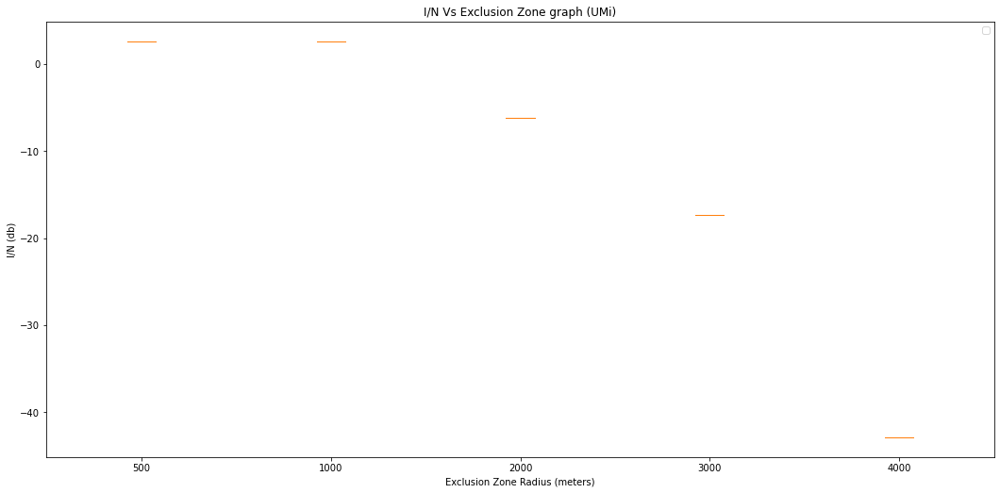

In [40]:
# EXCLUSION ZONE

# Creating dataset
# distance, interface_Noise = pairs_noAverage['UMi']
distance, interface_Noise = pairs['UMi']
 
# print(box_dict_UMi)
 
fig, ax = plt.subplots()

# Creating plot
for i, exclusion_zone in enumerate(exclusion_zones):
    # key is exclusion zone
#     ax.boxplot(interface_Noise[exclusion_zone],
     ax.boxplot([interface_Noise[exclusion_zone]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white'))

# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in exclusion_zones])
 
ax.set_title('I/N Vs Exclusion Zone graph (UMi)')
ax.set_xlabel('Exclusion Zone Radius (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('NLOS_aggregate_direc_graphUmiexclusion5km.pdf', dpi=100)
plt.show()

In [38]:
'''# EXCLUSION ZONE (-15db BS)

# Creating dataset
distance, interface_Noise = pairs_noAverage['UMi']
# distance, interface_Noise = pairs['UMi']
 
# print(box_dict_UMi)
 
fig, ax = plt.subplots()

# Creating plot
for i, exclusion_zone in enumerate(exclusion_zones):
    # key is exclusion zone
#     ax.boxplot(interface_Noise[exclusion_zone],
     ax.boxplot( [x for x in  interface_Noise[exclusion_zone] if x < -15],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white'))

# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in exclusion_zones])
 
ax.set_title('I/N Vs Exclusion Zone graph (UMi)')
ax.set_xlabel('Exclusion Zone Radius (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('-15dbaggregatedirecgraphUmiexclusion5km.pdf', dpi=100)
plt.show()'''

"# EXCLUSION ZONE (-15db BS)\n\n# Creating dataset\ndistance, interface_Noise = pairs_noAverage['UMi']\n# distance, interface_Noise = pairs['UMi']\n \n# print(box_dict_UMi)\n \nfig, ax = plt.subplots()\n\n# Creating plot\nfor i, exclusion_zone in enumerate(exclusion_zones):\n    # key is exclusion zone\n#     ax.boxplot(interface_Noise[exclusion_zone],\n     ax.boxplot( [x for x in  interface_Noise[exclusion_zone] if x < -15],\n               patch_artist=True,\n               positions=[i],\n               boxprops=dict(facecolor='white'))\n\n# keys = sorted([key for key in box_dict_UMi])\n# ax.boxplot([box_dict_UMi[key] for key in keys])\nax.set_xticklabels([int(i) for i in exclusion_zones])\n \nax.set_title('I/N Vs Exclusion Zone graph (UMi)')\nax.set_xlabel('Exclusion Zone Radius (meters)')\nax.set_ylabel('I/N (db)')\nax.legend()\n\n# show plot\n# plt.show()\nfig.set_size_inches(18, 8.5)\n# fig.savefig('-15dbaggregatedirecgraphUmiexclusion5km.pdf', dpi=100)\nplt.show()"

In [39]:
# for key in pairs:
#   plt.scatter(pairs[key][0], pairs[key][1], label=key)

# plt.title('Average I/N Vs Distance graph')
# plt.xlabel('Distance (meter)')
# plt.ylabel('I/N (db)')
# plt.legend()
# plt.show()

In [ ]:
# for key in pairs_noAverage:
#   plt.scatter(pairs_noAverage[key][0], pairs_noAverage[key][1], label=key)

# plt.title('I/N Vs Distance graph')
# plt.xlabel('Distance (meter)')
# plt.ylabel('I/N (db)')
# plt.legend()
# plt.show()

In [ ]:
distance, interface_Noise = pairs_noAverage['RMa']
distance_sorted,interface_Noise_sorted = zip(*sorted(zip(distance, interface_Noise)))
plt.scatter(np.array(distance_sorted), np.array(interface_Noise_sorted))

plt.title('I/N Vs Distance graph (RMa)')
plt.xlabel('Distance (meter)')
plt.ylabel('I/N (db)')
plt.legend()
plt.show()

In [ ]:
distance, interface_Noise = pairs_noAverage['UMa']
distance_sorted,interface_Noise_sorted = zip(*sorted(zip(distance, interface_Noise)))
plt.scatter(np.array(distance_sorted), np.array(interface_Noise_sorted))

plt.title('I/N Vs Distance graph (UMa)')
plt.xlabel('Distance (meter)')
plt.ylabel('I/N (db)')
plt.legend()
plt.show()

In [ ]:
distance, interface_Noise = pairs_noAverage['UMi']
distance_sorted,interface_Noise_sorted = zip(*sorted(zip(distance, interface_Noise)))
plt.scatter(np.array(distance_sorted), np.array(interface_Noise_sorted))

plt.title('I/N Vs Distance graph (UMi)')
plt.xlabel('Distance (meter)')
plt.ylabel('I/N (db)')
plt.legend()
plt.show()

In [ ]:
for key in pairs_noAverage:
  distance, interface_Noise = pairs_noAverage[key]
  distance_1D = np.array([])
  for arr in distance:
    distance_1D = np.append(distance_1D, arr)
  interface_Noise_1D = np.array([])
  for arr in interface_Noise:
    interface_Noise_1D = np.append(interface_Noise_1D, arr)
  distance_sorted,interface_Noise_sorted = zip(*sorted(zip(distance_1D, interface_Noise_1D)))
  coefficients = np.polyfit(distance_sorted, interface_Noise_sorted,1)
  # y = ax + b, where y is the average of interface_Noise_sorted
  plt.plot(np.array(distance_sorted), np.polyval(coefficients, distance_sorted), label=key)

plt.title('I/N Vs Distance graph')
plt.xlabel('Distance (meter)')
plt.ylabel('I/N (db)')
plt.legend()
plt.show()

In [ ]:
# from matplotlib.lines import Line2D
# output= False
# bs_ue_max_radius = 1000
# bs_ue_min_radius= 1
# base_station_count=33
# fig = plt.figure()
# ax = fig.add_subplot(111)


# fss1 = BS(radius, max_height=1.5, carr_freq=12e3, interference_type=None)
# x,y,z = 0,0,0
        
# FSS_X=np.array([])
# FSS_Y=np.array([])
# FSS_Z=np.array([])
# FSS_CHANNELS = []
# for i in range (1):
#     FSS_X = np.append(FSS_X, x)
#     FSS_Y = np.append(FSS_Y, y)
#     FSS_Z = np.append(FSS_Z, z)
#     # 0 means not in use, 1 means in use
#     channel_status = [random.randint(0, 1) for i in range(FSS_Channels.channel_count)]
#     channels_used = np.array([i for i in range(FSS_Channels.channel_count) if channel_status[i] == 1])
#     FSS_CHANNELS.append(channels_used)
#     if output: print("FSS Co-ordinates=" +str (x)+ "," + str(y)+ "," + str(z) + ", channel: " + str(channels_used))
# if output: print(FSS_X, FSS_Y, FSS_Z, FSS_CHANNELS)


# BS_X=np.array([])
# BS_Y=np.array([])
# BS_Z=np.array([])

# # Randomly select base stations 
# base_station_indexes = random.sample(range(len(data_within_zone)), base_station_count)

# for i in base_station_indexes:

#     lat_BS, lon_BS = data_within_zone.iloc[i]['latitude'], data_within_zone.iloc[i]['longitude']
#     bs1 = BS(radius, max_height=35, carr_freq=12e3, interference_type=None)
#     x_BS = R * math.cos(math.radians(lat_BS)) * math.cos(math.radians(lon_BS))
#     y_BS = R * math.cos(math.radians(lat_BS)) * math.sin(math.radians(lon_BS))
# #         z_BS = R * math.sin(math.radians(lat_BS))

#     BS_X = np.append(BS_X, x_BS - x_FSS)
#     BS_Y = np.append(BS_Y, y_BS - y_FSS)
#     BS_Z = np.append(BS_Z, 0)
#     if output: print("Bs Co-ordinates=" +str (x_BS)+ "," + str(y_BS)+ "," + str(z_BS))

# if output: print(BS_X,BS_Y,BS_Z)

# # Create user equipment
# UE_X=np.array([])
# UE_Y=np.array([])
# UE_Z=np.array([])
# UE_CHANNEL=np.array([])
# for p in range (len(BS_X)):
#     UE_X=np.array([])
#     UE_Y=np.array([])
#     UE_Z=np.array([])
#     UE_CHANNEL=np.array([])
#     for i in range(33):
# # number of split regions
# # i is the sector number
#         for j in range(10):
#   # number of UEs per region
#   # j is the number of the UE in one sector
#             bs_x, bs_y, bs_z = BS_X[p], BS_Y[p],BS_Z[p]
#             theta_bs_ue = random.uniform(120 * i, 120 * (i+1))
#             # 0-120, 120-240, 240-360
#             radius_bs_ue = random.uniform(bs_ue_min_radius, bs_ue_max_radius)

#             x1 = bs_x + radius_bs_ue * math.cos(math.radians(theta_bs_ue))
#             y1 = bs_y + radius_bs_ue * math.sin(math.radians(theta_bs_ue))

#             UE_X = np.append(UE_X, x1)
#             UE_Y = np.append(UE_Y, y1)
#             UE_Z = np.append(UE_Z, 1.5)

#             maximum_UEs_per_channel = 4

#             if j > maximum_UEs_per_channel * BS_Channels.channel_count:
#                 raise Exception(f"BS cannot support {j} UEs")

#             count = {i: 0 for i in range(1, BS_Channels.channel_count + 1)}

#             channel = random.randint(1, BS_Channels.channel_count)

#             while count[channel] >= maximum_UEs_per_channel:
#                 channel = random.randint(1, BS_Channels.channel_count)

#             count[channel] += 1

#             UE_CHANNEL = np.append(UE_CHANNEL, channel)

#             if output: print("UE Co-ordinates=" +str (x1)+ "," + str(y1)+ "," + str(z1) + ", channel: " + str(channel))
#         if output: print(UE_X,UE_Y,UE_Z)
#     ax.scatter(UE_X,UE_Y,alpha=0.8, s=30,label= 'UE Location', color='green',)
            

# ax.scatter(BS_X,BS_Y,alpha=0.8, s=30,label= 'BS Location', color='red')
# ax.scatter(FSS_X,FSS_Y,alpha=0.8, s=30,label= 'FSS Location',color='yellow')
# legend_handles = [Line2D([0], [0], marker='o', color='w', label='UE Location', markerfacecolor='g'),
#           Line2D([0], [0], marker='o', color='w', label='BS Location', markerfacecolor='r'),
#           Line2D([0], [0], marker='o', color='w', label='FSS Location', markerfacecolor='y')
# ]
          
# plt.legend(handles=legend_handles)

# # plt.legend(loc=2)
# plt.title('FSS, BS and UE Location plot')
# ax.set_xlabel('X Label')
# ax.set_ylabel('Y Label')

# # fig.savefig('graphcoex.pdf', dpi=100)
# plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
 
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append(interface_Noise[i])
        
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
plt.boxplot([box_dict_UMi[key] for key in keys])
# ax.set_xticklabels(keys)

plt.title('I/N Vs Distance graph (UMi)')
plt.xlabel('No. Of BS')
plt.ylabel('I/N (db)')
plt.legend()
 
 
#show plot
plt.show()
# plt.save

In [ ]:
# Creating dataset
box_dict_UMa = dict()
distance, interface_Noise = pairs_noAverage['UMa']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_UMa:
        box_dict_UMa[distance[i]] = []
    box_dict_UMa[distance[i]].append(interface_Noise[i])
        
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
keys = sorted([key for key in box_dict_UMa])
plt.boxplot([box_dict_UMa[key] for key in keys])
# ax.set_xticklabels(keys)

plt.title('I/N Vs Distance graph (UMa)')
plt.xlabel('No. Of BS')
plt.ylabel('I/N (db)')
plt.legend()
 
 
# show plot
plt.show()


In [ ]:
# Creating dataset
box_dict_RMa = dict()
distance, interface_Noise = pairs_noAverage['RMa']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_RMa:
        box_dict_RMa[distance[i]] = []
    box_dict_RMa[distance[i]].append(interface_Noise[i])
        
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
keys = sorted([key for key in box_dict_RMa])
plt.boxplot([box_dict_RMa[key] for key in keys])
# ax.set_xticklabels(keys)

plt.title('I/N Vs Distance graph (RMa)')
plt.xlabel('No. of BS')
plt.ylabel('I/N (db)')
plt.legend()
 
# show plot
# plt.show()

 
# show plot
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
 
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append(interface_Noise[i])
        
fig = plt.figure(figsize =(10, 7))
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
plt.boxplot([box_dict_UMi[key] for key in keys][0])
# ax.set_xticklabels([keys[0]])
 
# show plot
plt.show()


In [ ]:
# # Creating dataset
# box_dict_UMi = dict()
# distance, interface_Noise = pairs_noAverage['UMi']
# for i in range(len(interface_Noise)):
#     if distance[i] not in box_dict_UMi:
#         box_dict_UMi[distance[i]] = []
#     box_dict_UMi[distance[i]].append(interface_Noise[i])

# elevation_dict_UMi = dict()

# for p in range (len(BS_X)):
#     x, y, z = BS_X[p]-FSS_X[0], BS_Y[p]-FSS_Y[0], 10-FSS_Z[0]

#     distance_2D = math.sqrt(((FSS_X[0]-BS_X[p])**2)+((FSS_Y[0]- BS_Y[p])**2)+((FSS_Z[0]-10)**2))

#     theta_bs_es = math.degrees(math.atan(y/x)) % 360
#     phi_bs_es = math.degrees(math.sqrt(x**2 + y**2) / z) % 360
#     fss_phi_difference = abs(15 - phi_bs_es)

    
#     if distance_2D in box_dict_UMi:
#         elevation_dict_UMi[fss_phi_difference] = box_dict_UMi[distance_2D]

# plt.title('I/N Vs Elevation graph (UMi)')
# plt.xlabel('Elevation (degrees)')
# plt.ylabel('I/N (db)')
# plt.legend()
# plt.show()


In [ ]:
# elevation_dict_UMi

In [ ]:
#Elevation angles (FSS towards to sky )
fig, ax=plt.subplots()

FSS_phi = {
    'UMi': 15,
    'UMa': 48,
    'RMa': 5
}

contexts = sorted([context for context in FSS_phi], key=lambda x:FSS_phi[x])
boxplots = []

boxplots=ax.boxplot([pairs_noAverage[context][1] for context in contexts])
# for context in contexts:
#     distance, interface_Noise = pairs_noAverage[context]
#     boxplots.append(plt.boxplot(interface_Noise))

ax.set_xticklabels([FSS_phi[context] for context in contexts])

ax.set_title('I/N Vs Elevation graph')
ax.set_xlabel('Elevation (degrees)')
ax.set_ylabel('I/N (db)')
ax.legend()
plt.show()

In [ ]:
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_UMi[key][0][1]
    ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='blue' if line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (UMi)')
ax.set_xlabel('Distnace of Each BS to FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()
 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUmi.pdf', dpi=100)
plt.show()

In [ ]:
# # Creating dataset
# box_dict_UMa = dict()
# distance, interface_Noise = pairs_noAverage['UMa']
# for i in range(len(interface_Noise)):
#     if distance[i] not in box_dict_UMa:
#         box_dict_UMa[distance[i]] = []
#     box_dict_UMa[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# # print(box_dict_UMi)

# fig, ax= plt.subplots()
 
# # Creating plot
# keys = sorted([key for key in box_dict_UMa])
# for i, key in enumerate(keys):
#     # key is distance
#     # print(key)
#     # print(box_dict_UMi[key])
#     line_of_sight1 = box_dict_UMa[key][0][1]
#     ax.boxplot([I_N for I_N, los in box_dict_UMa[key]],
#                patch_artist=True,
#                positions=[i],
#                boxprops=dict(facecolor='white', color='blue' if line_of_sight1 else 'red'))
                
# # keys = sorted([key for key in box_dict_UMi])
# # ax.boxplot([box_dict_UMi[key] for key in keys])
# ax.set_xticklabels([int(i) for i in keys])

# ax.set_title('I/N Vs Distance graph (UMa)')
# ax.set_xlabel('Distnace of Each BS to FSS (meters)')
# ax.set_ylabel('I/N (db)')
# ax.legend()
 
# # show plot
# # plt.show()
# fig.set_size_inches(18, 8.5)
# # fig.savefig('graphUMa.pdf', dpi=100)
# plt.show()

In [ ]:
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if not line_of_sight[i]:
        continue   
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_UMi[key][0][1]
    ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='blue' if line_of_sight1  else 'red'))
    
#     ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
#                patch_artist=True,
#                positions=[i],
#                boxprops=dict(facecolor='white', color='red' if not line_of_sight1))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (UMi LOS)')
ax.set_xlabel('Distnace of Each BS from FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()
 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUmiomniwithlog10.pdf', dpi=100)
plt.show()

In [ ]:
# Creating dataset
box_dict_UMi = dict()
distance, interface_Noise = pairs_noAverage['UMi']
for i in range(len(interface_Noise)):
    if line_of_sight[i]:
        continue
        
    if distance[i] not in box_dict_UMi:
        box_dict_UMi[distance[i]] = []
    box_dict_UMi[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_UMi])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_UMi[key][0][1]
#     ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
#                patch_artist=True,
#                positions=[i],
#                boxprops=dict(facecolor='white', color='blue' if line_of_sight1))
    
    ax.boxplot([I_N for I_N, los in box_dict_UMi[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='red' if not line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (UMi NLOS)')
ax.set_xlabel('Distnace of Each BS from FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()

 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphUmiomniwithlog10.pdf', dpi=100)
plt.show()

In [ ]:
# Creating dataset
box_dict_RMa = dict()
distance, interface_Noise = pairs_noAverage['RMa']
for i in range(len(interface_Noise)):
    if distance[i] not in box_dict_RMa:
        box_dict_RMa[distance[i]] = []
    box_dict_RMa[distance[i]].append([interface_Noise[i],line_of_sight[i]])

# print(box_dict_UMi)

fig, ax= plt.subplots()
 
# Creating plot
keys = sorted([key for key in box_dict_RMa])
for i, key in enumerate(keys):
    # key is distance
    # print(key)
    # print(box_dict_UMi[key])
    line_of_sight1 = box_dict_RMa[key][0][1]
    ax.boxplot([I_N for I_N, los in box_dict_RMa[key]],
               patch_artist=True,
               positions=[i],
               boxprops=dict(facecolor='white', color='blue' if line_of_sight1 else 'red'))
                
# keys = sorted([key for key in box_dict_UMi])
# ax.boxplot([box_dict_UMi[key] for key in keys])
ax.set_xticklabels([int(i) for i in keys])

ax.set_title('I/N Vs Distance graph (RMa)')
ax.set_xlabel('Distnace of Each BS to FSS (meters)')
ax.set_ylabel('I/N (db)')
ax.legend()
 
# show plot
# plt.show()
fig.set_size_inches(18, 8.5)
# fig.savefig('graphRma.pdf', dpi=100)
plt.show()

In [ ]:
pathloss_UMi